# MAZ1- Filter CR filtered cells based on cutoffs

In [1]:
library(ArchR)
library(dplyr)
library(Seurat)
library(Cairo)
library(ggplot2)
library(Matrix)
library(hexbin)
library(gridExtra)
library(Signac)
library(tidyverse)
library(reshape2)


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .______      
          /   \     |   _ 


Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths


The following objects are masked from ‘package:data.table’:

    dcast, melt




In [2]:
sample <- 'MAZ1'

In [3]:
CR_DIR <- '/athena/josefowiczlab/scratch/rer4011/projects/MAZ_andrew_data/cellranger_outs/'
ARCHR_OUT <- '/athena/josefowiczlab/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/per_sample_Archr'
proj_name <- 'cr_filt'
Archr_Dir <- file.path(ARCHR_OUT,paste0(sample,'_ArchR'))
cr_out <- file.path(CR_DIR,sample,'outs')
setwd(Archr_Dir)

# Read ArchR object

In [4]:
proj <- loadArchRProject(file.path(Archr_Dir,proj_name))
#proj <- addDoubletScores(input = proj, k = 10, knnMethod = "UMAP", LSIMethod = 1)
proj <- addGeneScoreMatrix(proj)
archr_metadata <- getCellColData(proj)
proj

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

class: ArchRProject 
outputDirectory: /athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/per_sample_Archr/MAZ1_ArchR/cr_filt 
samples(1): MAZ1
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ... nucleosome_signal
  filter_status
numberOfCells(1): 8389
medianTSS(1): 22.574
medianFrags(1): 5523

# Read Seurat object

In [5]:
counts <- Read10X_h5(file.path(cr_out,'filtered_peak_bc_matrix.h5'))
chrom_assay <- CreateChromatinAssay(
  counts = counts,
  sep = c(":", "-"),
  fragments = file.path(cr_out,'fragments.tsv.gz')
)
metadata <- read.csv(file = file.path(cr_out,'singlecell.csv'), header = T, row.names = 1)

# create a seurat Object
seurat_obj <- CreateSeuratObject(
  counts = chrom_assay,
  meta.data = metadata,
  assay = 'ATAC'
)
print(seurat_obj)
seurat_obj <- NucleosomeSignal(seurat_obj)
rownames(seurat_obj@meta.data) <- paste0(sample,'#',rownames(seurat_obj@meta.data))
# fraction of reads in peaks
seurat_obj$pct_reads_in_peaks <- seurat_obj$peak_region_fragments / seurat_obj$passed_filters * 100
head(seurat_obj@meta.data)

Computing hash



An object of class Seurat 
144270 features across 8389 samples within 1 assay 
Active assay: ATAC (144270 features, 0 variable features)
 2 layers present: counts, data


,orig.ident,nCount_ATAC,nFeature_ATAC,total,duplicate,chimeric,unmapped,lowmapq,mitochondrial,nonprimary,⋯,DNase_sensitive_region_fragments,enhancer_region_fragments,promoter_region_fragments,on_target_fragments,blacklist_region_fragments,peak_region_fragments,peak_region_cutsites,nucleosome_signal,nucleosome_percentile,pct_reads_in_peaks
,<fct>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
MAZ1#AAACAAGCACCATGCC-1,SeuratProject,4824,2363,5273,855,5,86,420,0,0,⋯,0,0,0,1519,0,2499,4824,0.4488392,0.33,63.96212
MAZ1#AAACAAGCACTAGCTT-1,SeuratProject,13365,6018,14442,2167,7,176,1060,0,0,⋯,0,0,0,4494,0,6918,13365,0.5087826,0.59,62.70848
MAZ1#AAACAAGCAGTATGTG-1,SeuratProject,6427,3108,8708,1285,5,187,782,1,0,⋯,0,0,0,2400,0,3362,6427,0.6761905,0.96,52.14020
MAZ1#AAACCAGGTATGTTGC-1,SeuratProject,9102,4196,9966,1511,13,150,749,2,0,⋯,0,0,0,3136,0,4710,9102,0.5707525,0.81,62.45856
MAZ1#AAACCAGGTGGATGCG-1,SeuratProject,27597,11158,31081,4862,26,501,2998,0,13,⋯,0,0,0,9333,0,14235,27597,0.4450801,0.31,62.76178
MAZ1#AAACCAGGTGTCCGTA-1,SeuratProject,13444,6223,15144,2338,21,249,1336,0,0,⋯,0,0,0,4391,0,6991,13444,0.5085679,0.59,62.41964


# Merge both metadata

In [6]:
seurat_obj@meta.data <- cbind(seurat_obj@meta.data, archr_metadata)
seurat_obj@meta.data$archr_barcodes <- rownames(seurat_obj@meta.data)
rownames(seurat_obj@meta.data) <- gsub(".*#", "", rownames(seurat_obj@meta.data))
head(seurat_obj@meta.data)

,orig.ident,nCount_ATAC,nFeature_ATAC,total,duplicate,chimeric,unmapped,lowmapq,mitochondrial,nonprimary,⋯,BlacklistRatio,Clusters,DoubletScore,DoubletEnrichment,nCount_ATAC,nFeature_ATAC,pct_reads_in_peaks,nucleosome_signal,filter_status,archr_barcodes
,<fct>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>
AAACAAGCACCATGCC-1,SeuratProject,4824,2363,5273,855,5,86,420,0,0,⋯,0.03780113,C8,0,0.150,4824,2363,63.96212,0.4488392,Included,MAZ1#AAACAAGCACCATGCC-1
AAACAAGCACTAGCTT-1,SeuratProject,13365,6018,14442,2167,7,176,1060,0,0,⋯,0.02504310,C6,0,0.950,13365,6018,62.70848,0.5087826,Included,MAZ1#AAACAAGCACTAGCTT-1
AAACAAGCAGTATGTG-1,SeuratProject,6427,3108,8708,1285,5,187,782,1,0,⋯,0.03275380,C1,0,1.050,6427,3108,52.14020,0.6761905,Included,MAZ1#AAACAAGCAGTATGTG-1
AAACCAGGTATGTTGC-1,SeuratProject,9102,4196,9966,1511,13,150,749,2,0,⋯,0.03389943,C7,0,1.325,9102,4196,62.45856,0.5707525,Included,MAZ1#AAACCAGGTATGTTGC-1
AAACCAGGTGGATGCG-1,SeuratProject,27597,11158,31081,4862,26,501,2998,0,13,⋯,0.03125690,C7,0,1.300,27597,11158,62.76178,0.4450801,Included,MAZ1#AAACCAGGTGGATGCG-1
AAACCAGGTGTCCGTA-1,SeuratProject,13444,6223,15144,2338,21,249,1336,0,0,⋯,0.03413762,C8,0,0.800,13444,6223,62.41964,0.5085679,Included,MAZ1#AAACCAGGTGTCCGTA-1


In [7]:
columns_to_plot <- c('nCount_ATAC', 'nFeature_ATAC', 'TSSEnrichment', 'nFrags', 'pct_reads_in_peaks',
                     'BlacklistRatio', 'nucleosome_signal', 'NucleosomeRatio','DoubletScore','DoubletEnrichment')
for (col in columns_to_plot) {
    if (!(col %in% colnames(archr_metadata))) {
      print(col)
      proj <- addCellColData(
        ArchRProj = proj,
        data = seurat_obj@meta.data[[col]],
        name = col, 
        cells = rownames(archr_metadata),
        force = TRUE 
      )
    }
}

colnames(getCellColData(proj))

[1] "Sample"             "TSSEnrichment"      "ReadsInTSS"        
 [4] "ReadsInPromoter"    "ReadsInBlacklist"   "PromoterRatio"     
 [7] "PassQC"             "NucleosomeRatio"    "nMultiFrags"       
[10] "nMonoFrags"         "nFrags"             "nDiFrags"          
[13] "BlacklistRatio"     "Clusters"           "DoubletScore"      
[16] "DoubletEnrichment"  "nCount_ATAC"        "nFeature_ATAC"     
[19] "pct_reads_in_peaks" "nucleosome_signal"  "filter_status"

# Plot QC metrics

In [8]:
p1 <- DensityScatter(seurat_obj, x = 'nCount_ATAC', y = 'TSSEnrichment', log_x = TRUE, quantiles = TRUE)
p2 <- DensityScatter(seurat_obj, x = 'nucleosome_signal', y = 'TSSEnrichment', log_x = TRUE, quantiles = TRUE)
p1
p2

ERROR while rich displaying an object: Error in `geom_point()`:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error in `FUN()`:
! `data` must be uniquely named but has duplicate columns

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[

ERROR while rich displaying an object: Error in `geom_point()`:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error in `FUN()`:
! `data` must be uniquely named but has duplicate columns

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[

No id variables; using all as measure variables



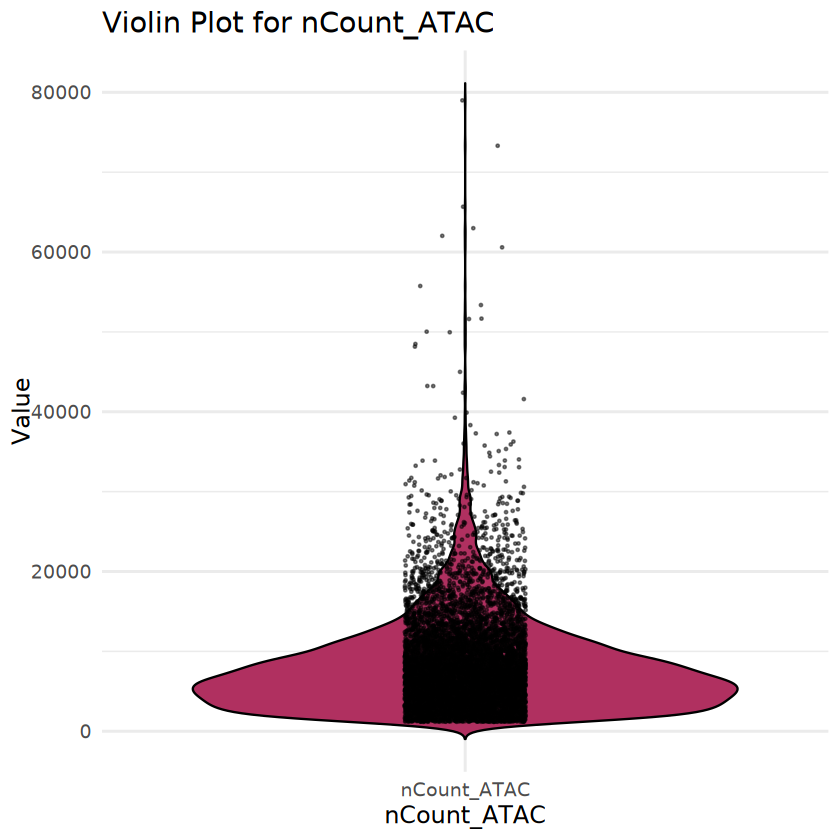

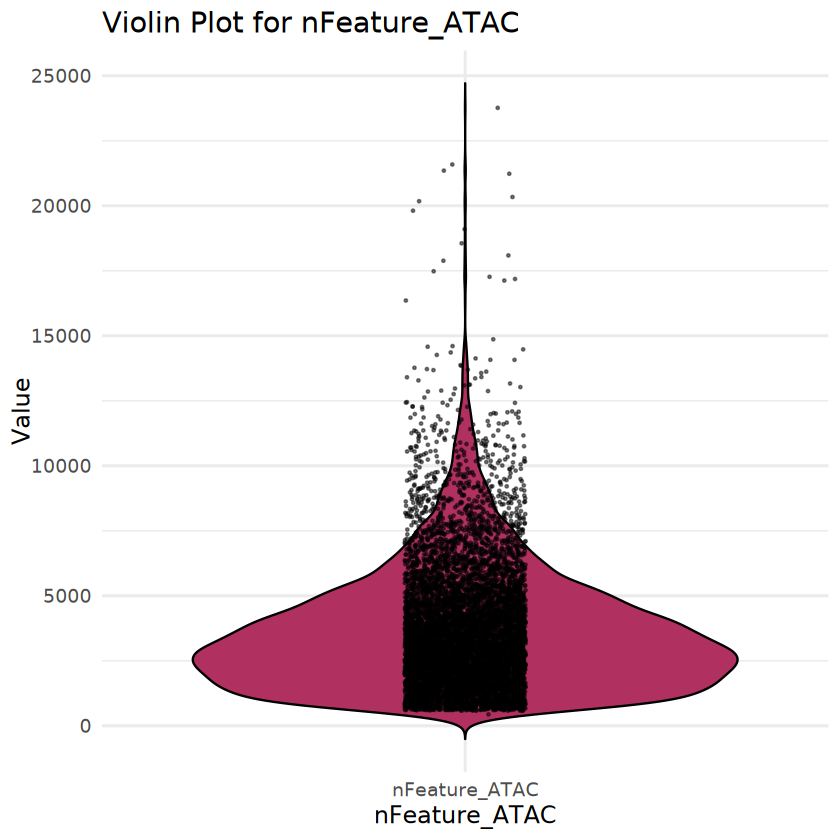

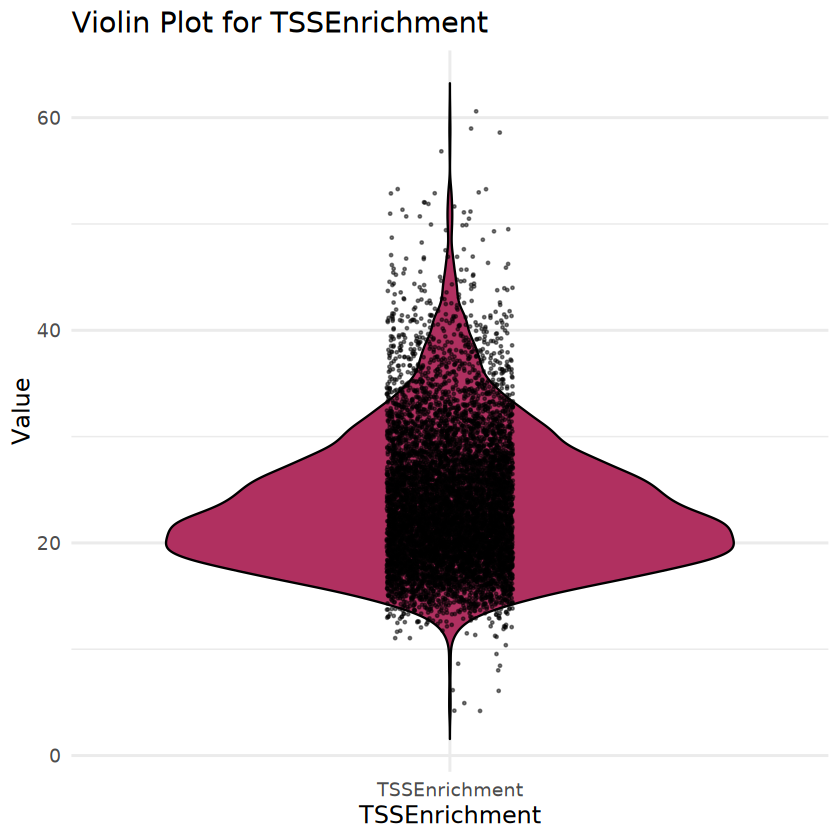

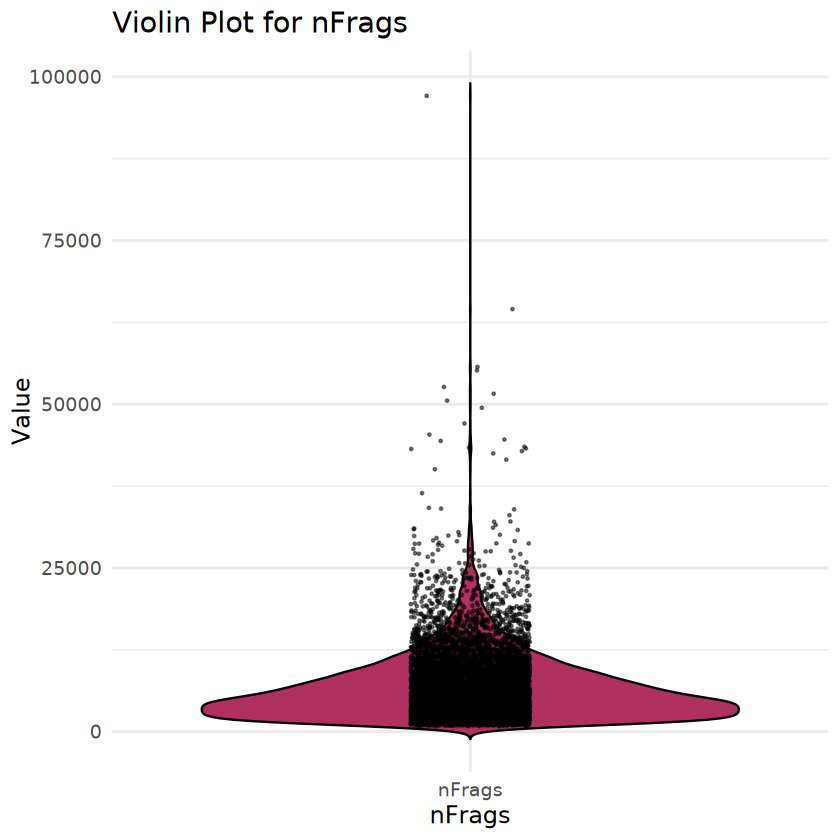

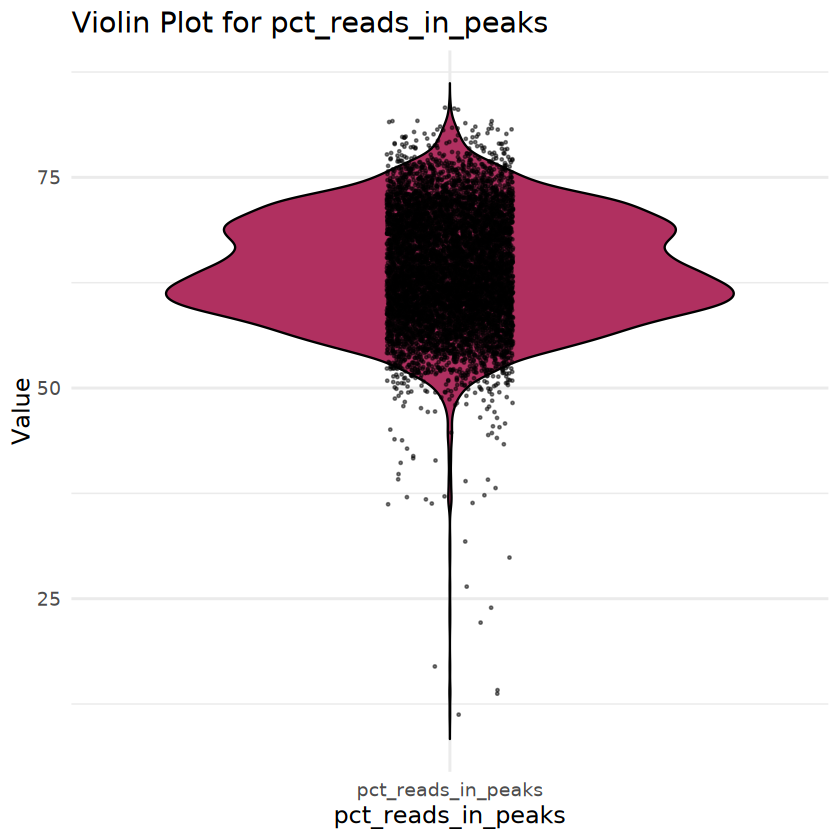

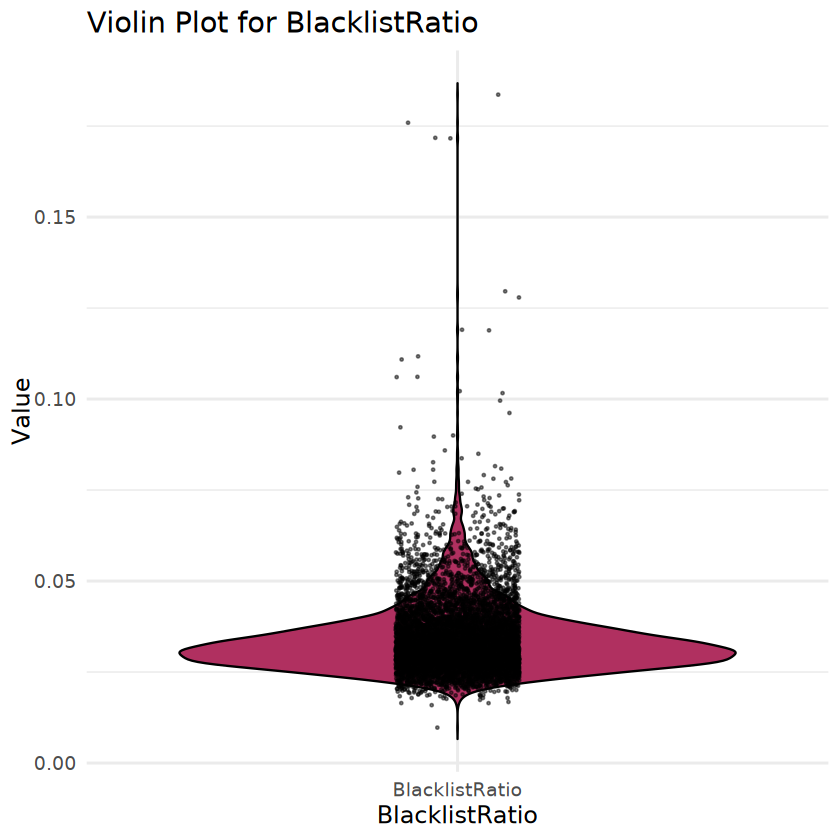

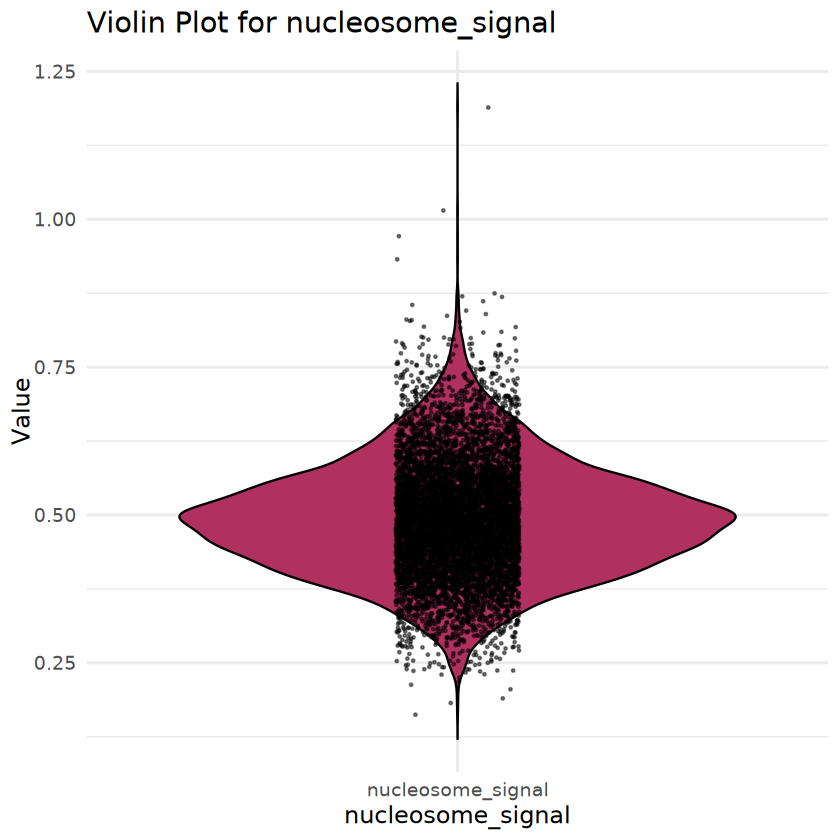

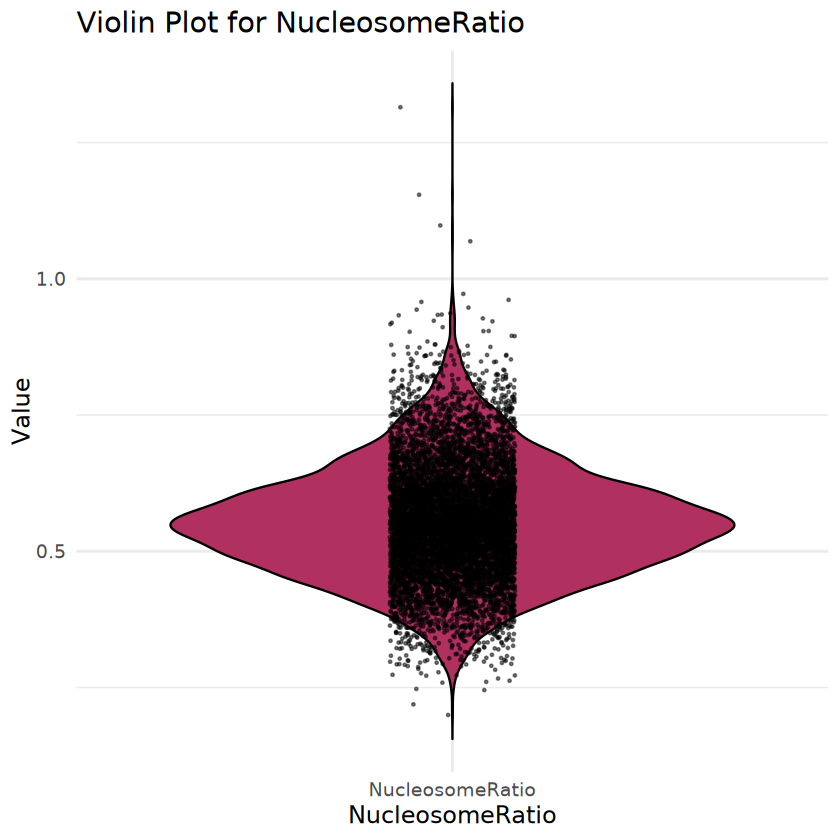

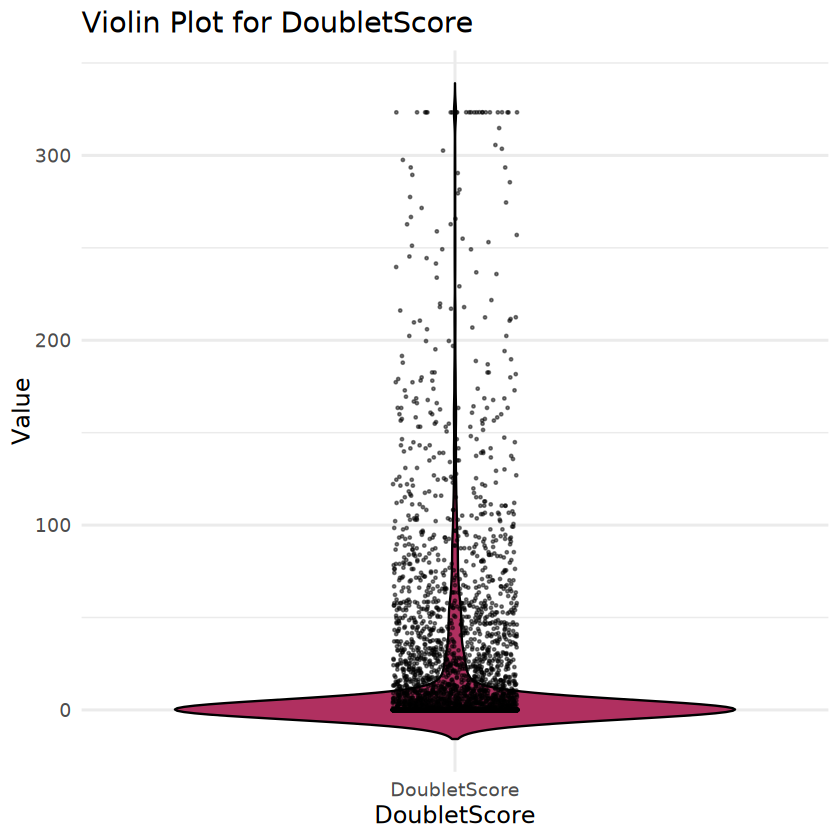

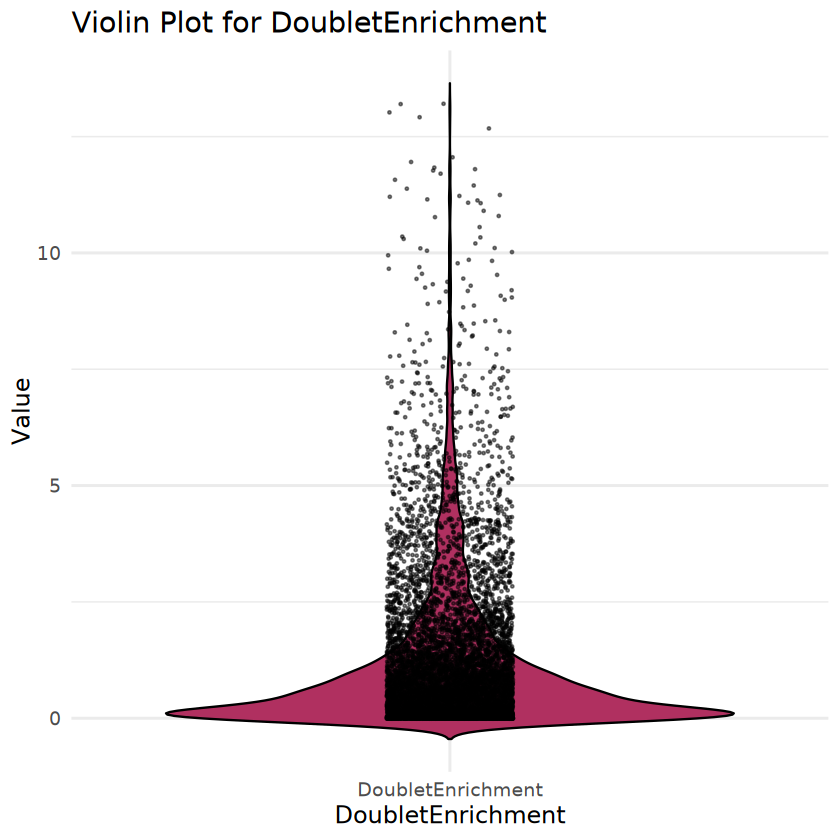

In [9]:
# Define the columns to plot
columns_to_plot <- c('nCount_ATAC', 'nFeature_ATAC', 'TSSEnrichment', 'nFrags', 'pct_reads_in_peaks',
                     'BlacklistRatio', 'nucleosome_signal', 'NucleosomeRatio','DoubletScore','DoubletEnrichment')

# Extract data from seurat_obj@meta.data
plot_data <- seurat_obj@meta.data[, columns_to_plot]

# Melt the data into a long format for plotting
plot_data_melted <- melt(plot_data, variable.name = "Feature", value.name = "Value")

# Create a list to store individual ggplot objects
plot_list <- list()
for (feature in columns_to_plot) {
  p <- ggplot(subset(plot_data_melted, Feature == feature), aes(x = Feature, y = Value)) +
    geom_violin(trim = FALSE, fill = "maroon", color = "black") +  # Violin plot
    geom_jitter(width = 0.1, color = "black", size = 0.3, alpha = 0.5) +  # Jittered points (black)
    theme_minimal(base_size = 14) +  # Larger base font size
    labs(title = paste("Violin Plot for", feature),
         x = feature,
         y = "Value")
  plot_list[[feature]] <- p
  print(p)
}
#grid.arrange(grobs = plot_list, ncol = 4, top = paste0(sample,"QC Metrics"))  # Add a main title

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100585b58571e-Date-2024-11-11_Time-14-29-53.125817.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100585b58571e-Date-2024-11-11_Time-14-29-53.125817.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100583e3828bf-Date-2024-11-11_Time-14-29-57.729194.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100583e3828bf-Date-2024-11-11_Time-14-29-57.729194.log



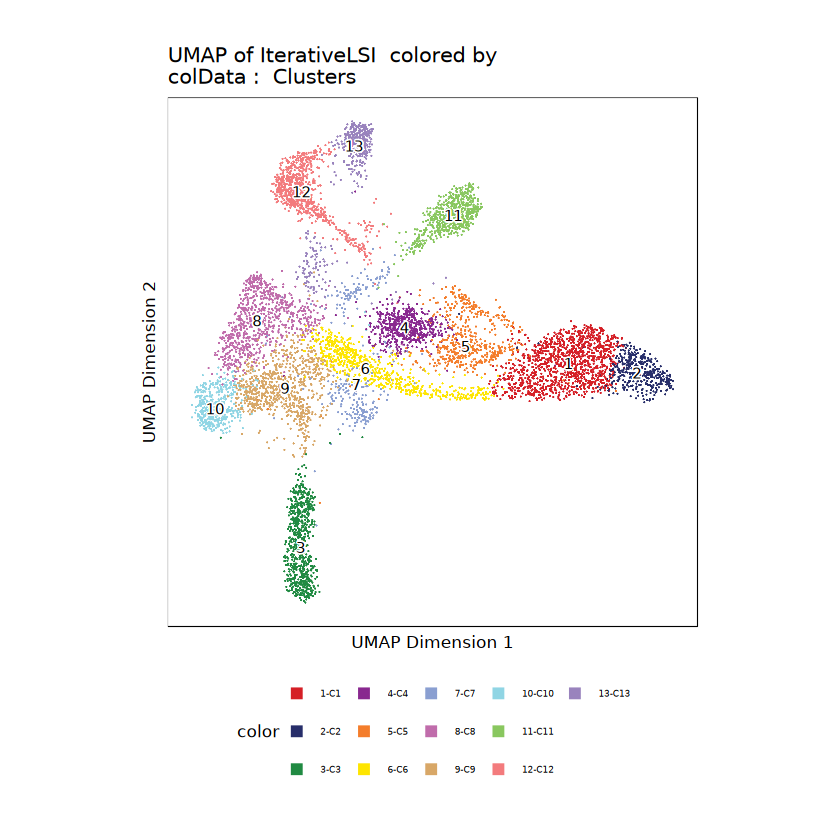

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005843131b2-Date-2024-11-11_Time-14-29-58.73831.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005843131b2-Date-2024-11-11_Time-14-29-58.73831.log



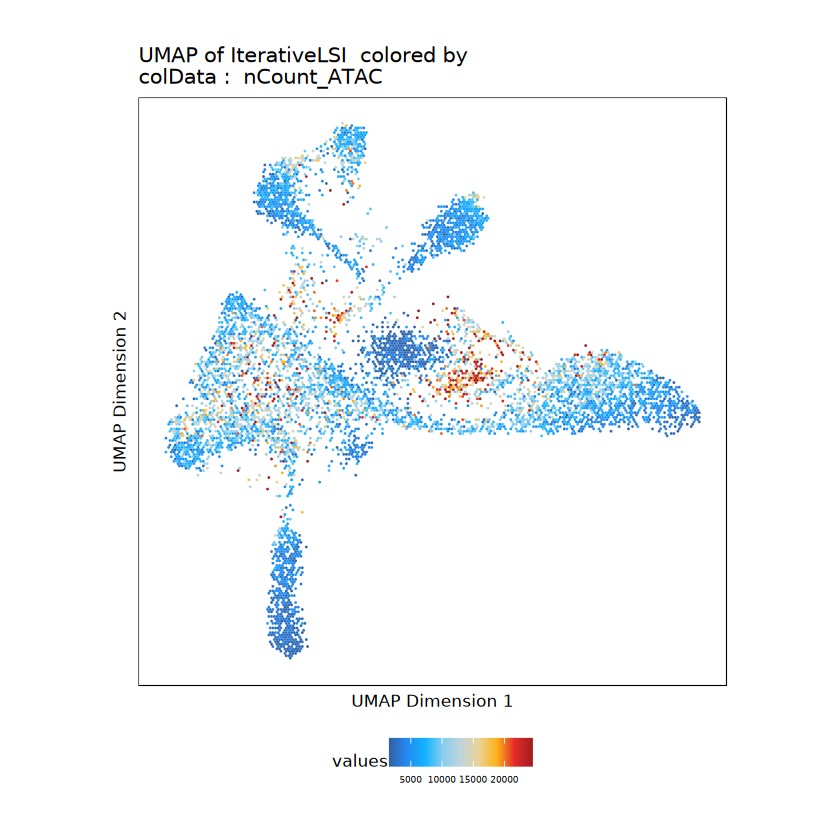

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100582a5fb8c6-Date-2024-11-11_Time-14-29-59.685699.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100582a5fb8c6-Date-2024-11-11_Time-14-29-59.685699.log



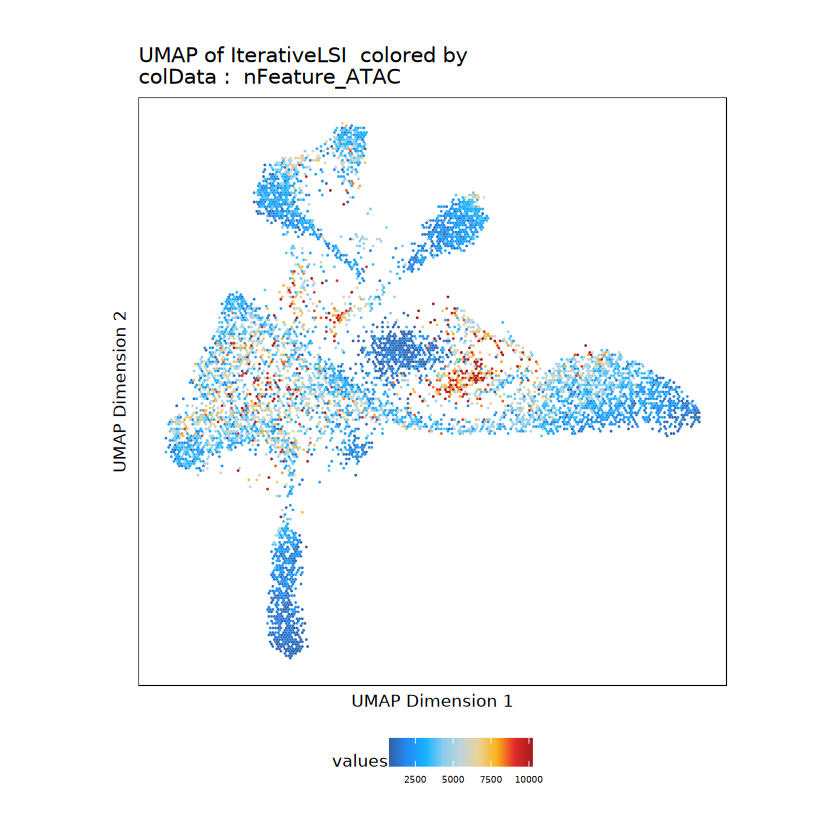

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005868145fc3-Date-2024-11-11_Time-14-30-00.504096.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005868145fc3-Date-2024-11-11_Time-14-30-00.504096.log



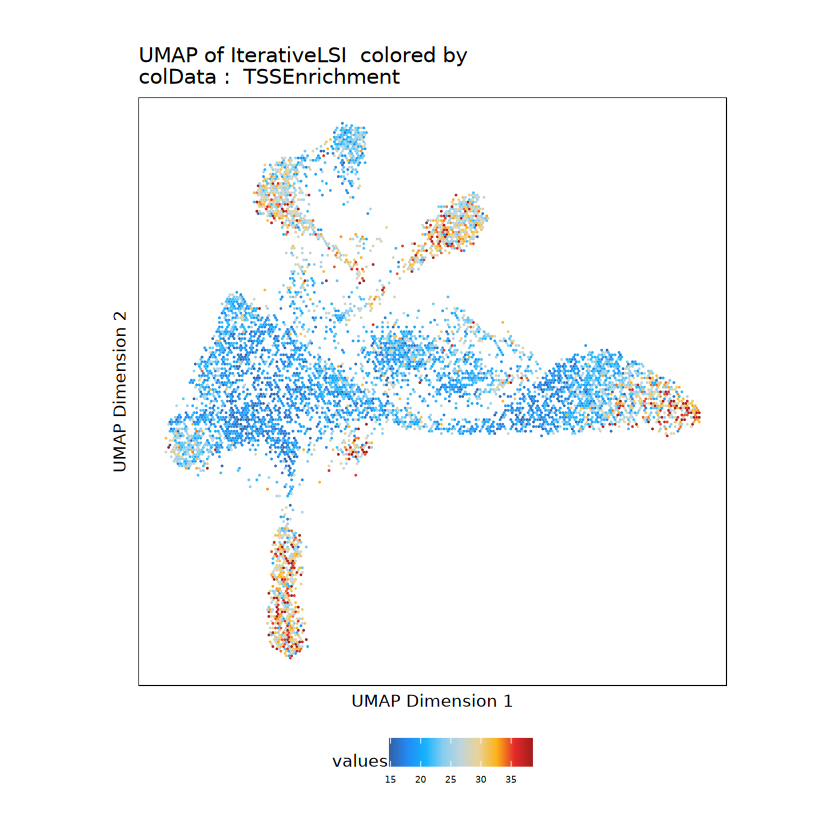

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005867007c80-Date-2024-11-11_Time-14-30-01.232914.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005867007c80-Date-2024-11-11_Time-14-30-01.232914.log



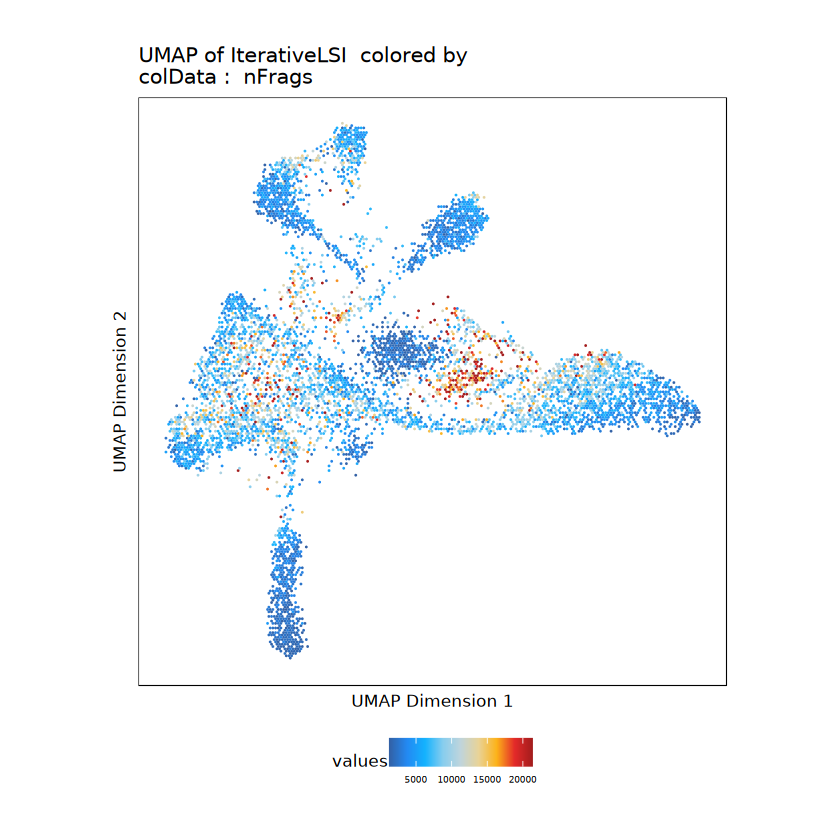

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005855ef08f7-Date-2024-11-11_Time-14-30-02.015711.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005855ef08f7-Date-2024-11-11_Time-14-30-02.015711.log



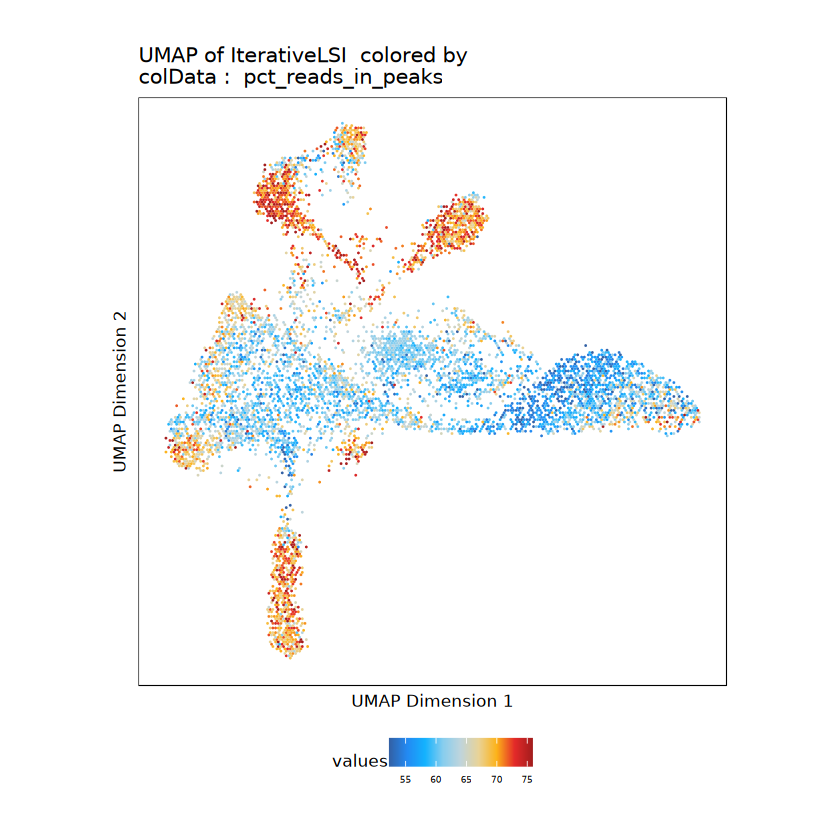

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005857bca20c-Date-2024-11-11_Time-14-30-02.900818.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005857bca20c-Date-2024-11-11_Time-14-30-02.900818.log



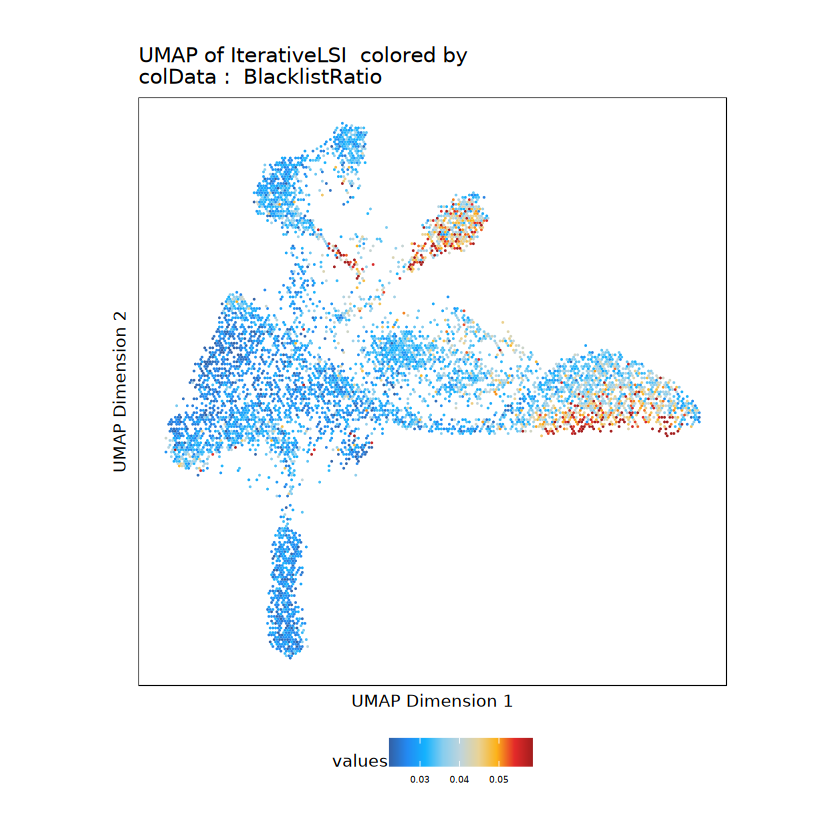

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058367f04a8-Date-2024-11-11_Time-14-30-03.701144.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058367f04a8-Date-2024-11-11_Time-14-30-03.701144.log



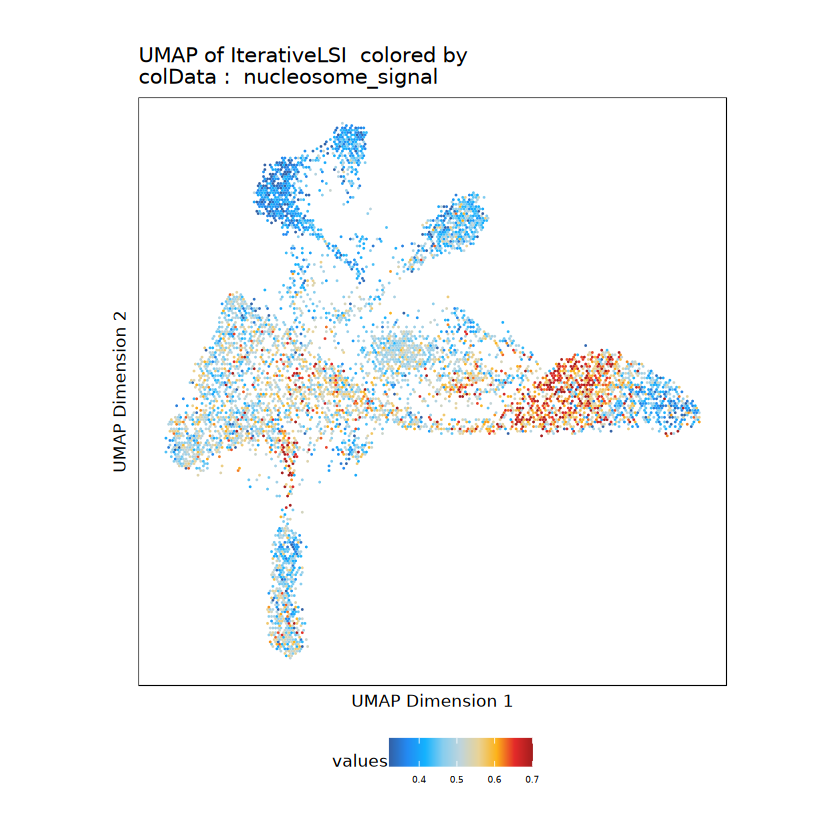

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005855efedc7-Date-2024-11-11_Time-14-30-04.49958.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005855efedc7-Date-2024-11-11_Time-14-30-04.49958.log



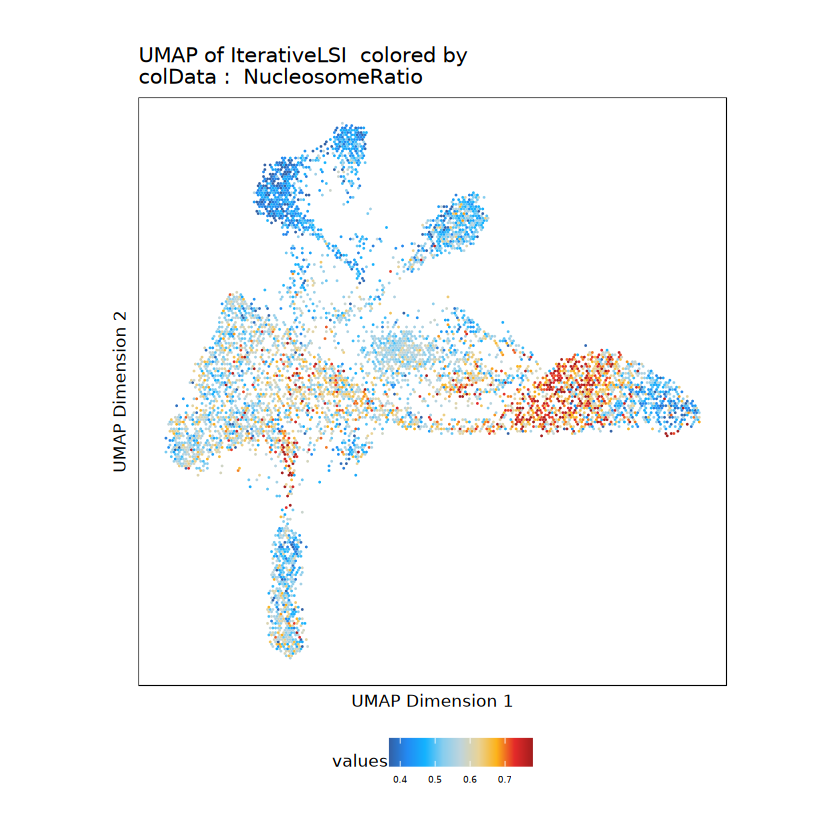

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058d3e1d49-Date-2024-11-11_Time-14-30-05.28108.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058d3e1d49-Date-2024-11-11_Time-14-30-05.28108.log



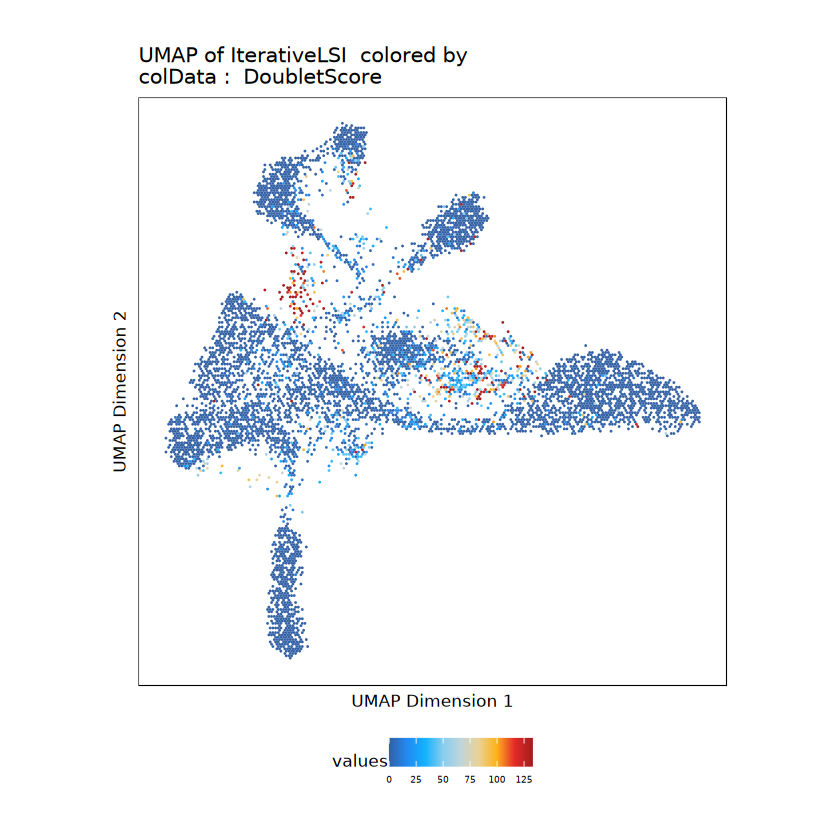

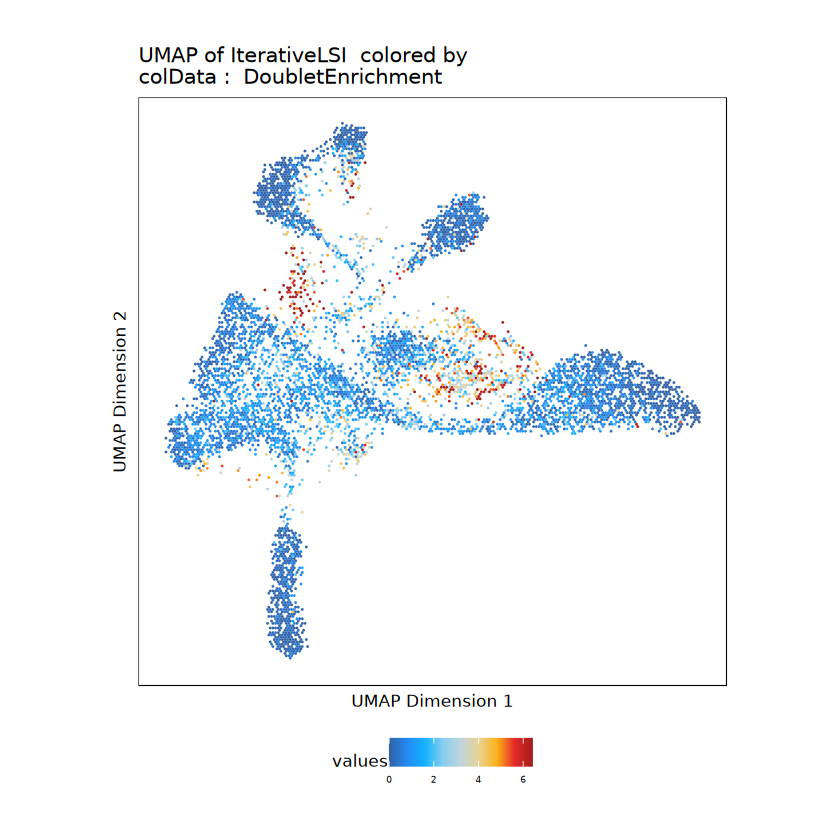

In [10]:
variables <- c('Clusters','nCount_ATAC', 'nFeature_ATAC', 'TSSEnrichment', 'nFrags', 'pct_reads_in_peaks',
                     'BlacklistRatio', 'nucleosome_signal', 'NucleosomeRatio','DoubletScore','DoubletEnrichment')
plot_list2 <- lapply(variables, function(var) {
    p <- plotEmbedding(
      ArchRProj = proj, 
      colorBy = "cellColData", 
      name = var, 
      embedding = "UMAP"
    )
    p + 
      ggtitle(paste("UMAP of", var, proj_name)) +  # Title for each plot
      theme_minimal() +  # A clean minimal theme
      theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels
  print(p)
})

#grid.arrange(grobs = plot_list2, ncol = 3, top = paste0(sample,"QC Metrics"))

# Filtering Round 1

In [11]:
subset_seurat_obj1 <- subset(
  seurat_obj,
  subset = nCount_ATAC < 40000 &
          nFeature_ATAC < 15000 &
          #TSSEnrichment > 4 & TSSEnrichment < 45 &
          nFrags < 37000 &
          pct_reads_in_peaks > 35 &
          BlacklistRatio < 0.08 & 
          DoubletScore < 50 &
          DoubletEnrichment < 8
)
#done
dim(seurat_obj)
dim(subset_seurat_obj1)

[1] 144270   8389

[1] 144270   7757

In [12]:
seurat_obj@meta.data$filter_status <- ifelse(rownames(seurat_obj@meta.data) %in% rownames(subset_seurat_obj1@meta.data), "Included", "Excluded")
proj <- addCellColData(
        ArchRProj = proj,
        data = seurat_obj@meta.data$filter_status,
        name = 'filter_status', 
        cells = seurat_obj@meta.data$archr_barcodes,
        force = TRUE)

Overriding previous entry for filter_status



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005853ab2f49-Date-2024-11-11_Time-14-33-19.928622.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005853ab2f49-Date-2024-11-11_Time-14-33-19.928622.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058239ce7ac-Date-2024-11-11_Time-14-33-21.118143.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058239ce7ac-Date-2024-11-11_Time-14-33-21.118143.log



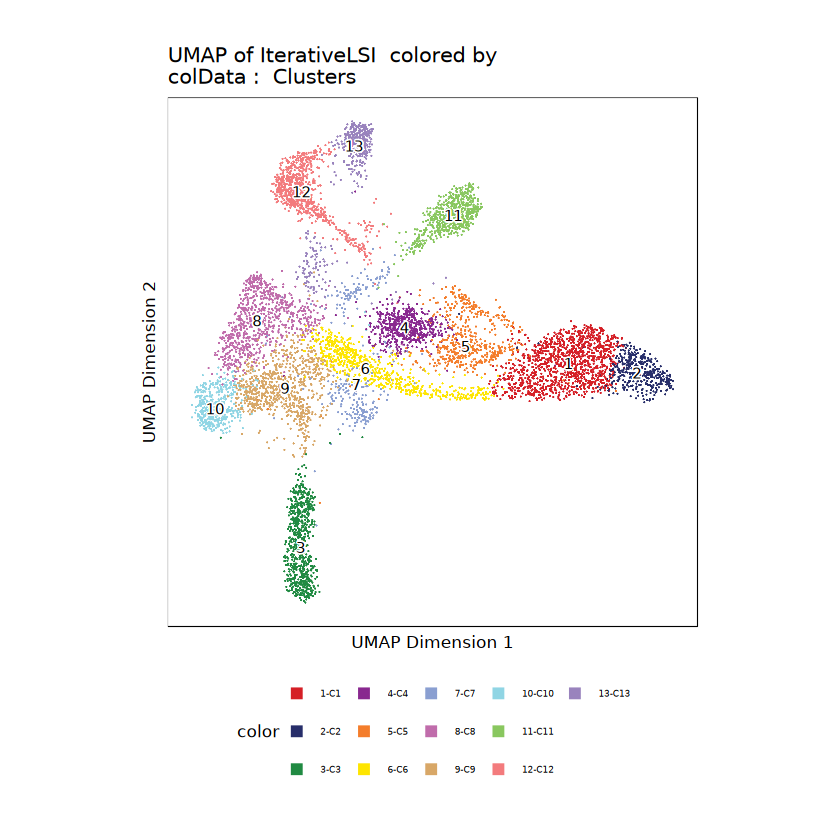

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058b5ef56d-Date-2024-11-11_Time-14-33-22.464846.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058b5ef56d-Date-2024-11-11_Time-14-33-22.464846.log



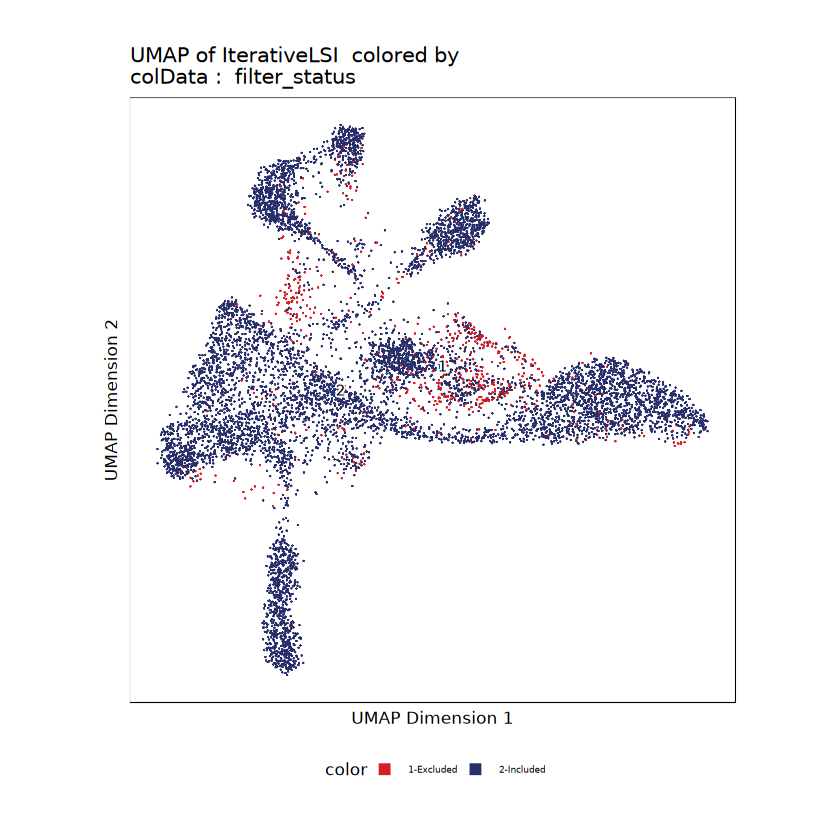

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100587b5684ae-Date-2024-11-11_Time-14-33-23.59943.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100587b5684ae-Date-2024-11-11_Time-14-33-23.59943.log



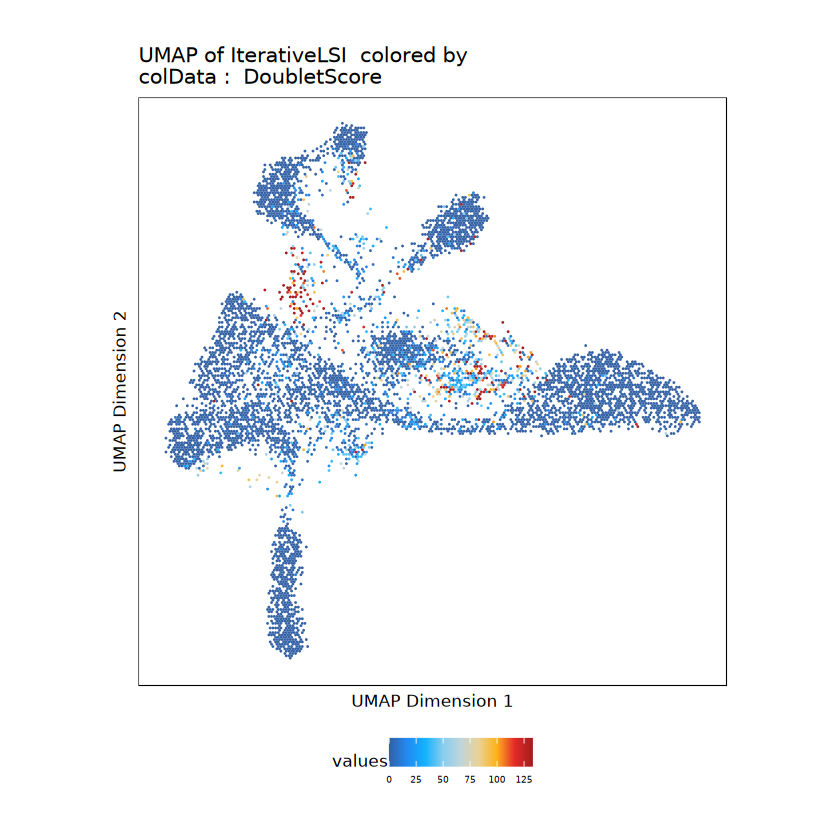

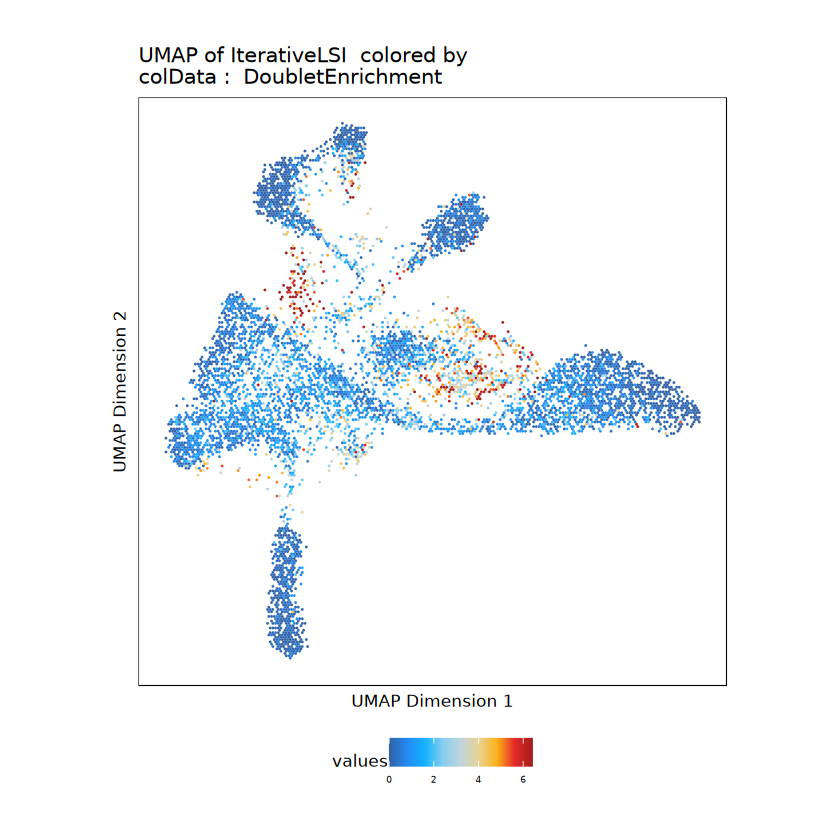

In [13]:
variables <- c('Clusters','filter_status','DoubletScore','DoubletEnrichment')
plot_list2 <- lapply(variables, function(var) {
    p <- plotEmbedding(
      ArchRProj = proj, 
      colorBy = "cellColData", 
      name = var, 
      embedding = "UMAP"
    )
    p + 
      ggtitle(paste("UMAP of", var, proj_name)) +  # Title for each plot
      theme_minimal() +  # A clean minimal theme
      theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels
  print(p)
})

In [14]:
proj <- saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

In [15]:
setwd(Archr_Dir)
sub_proj1 <- subsetArchRProject(
  ArchRProj = proj,
  cells = subset_seurat_obj1@meta.data$archr_barcodes,
  outputDirectory = "filter_round1",
  dropCells = TRUE,
  force = TRUE
)

Copying ArchRProject to new outputDirectory : /athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/per_sample_Archr/MAZ1_ArchR/filter_round1

Copying Arrow Files...

.copyArrow : Initializing Out ArrowFile

.copyArrow : Adding Metadata to Out ArrowFile

.copyArrow : Adding SubMatrices to Out ArrowFile

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 4): Embeddings

Copying Other Files (2 of 4): export

Copying Other Files (3 of 4): IterativeLSI

Copying Other Files (4 of 4): MAZ1

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /         

In [16]:
saveRDS(subset_seurat_obj1, file = "filter1_seurat_object.rds")

# Analyize Round 2

In [ ]:
subset_seurat_obj1 <- readRDS("filter1_seurat_object.rds")
sub_proj1 <- loadArchRProject(file.path(Archr_Dir,'filter_round1'))

In [17]:
sub_proj1


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/per_sample_Archr/MAZ1_ArchR/filter_round1 
samples(1): MAZ1
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ... nucleosome_signal
  filter_status
numberOfCells(1): 7757
medianTSS(1): 22.574
medianFrags(1): 5305

In [18]:
sub_proj1 <- addIterativeLSI(ArchRProj = sub_proj1, useMatrix = "TileMatrix", name = "IterativeLSI",force=TRUE)
sub_proj1 <- addUMAP(sub_proj1, reducedDims = "IterativeLSI", name = "UMAP",force=TRUE)
sub_proj1 <- addClusters(input = sub_proj1, reducedDims = "IterativeLSI", name = "Clusters",force=TRUE)

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-21005844d2ca89-Date-2024-11-11_Time-14-35-54.060083.log
If there is an issue, please report to github with logFile!

2024-11-11 14:35:54.236548 : Computing Total Across All Features, 0 mins elapsed.

2024-11-11 14:35:54.860742 : Computing Top Features, 0.011 mins elapsed.

###########
2024-11-11 14:35:55.989665 : Running LSI (1 of 2) on Top Features, 0.03 mins elapsed.
###########

2024-11-11 14:35:56.009768 : Creating Partial Matrix, 0.03 mins elapsed.

2024-11-11 14:36:03.507625 : Computing LSI, 0.155 mins elapsed.

2024-11-11 14:36:33.378715 : Identifying Clusters, 0.653 mins elapsed.

Warning message:
“Data is of class matrix. Coercing to dgCMatrix.”
2024-11-11 14:36:43.042791 : Identified 6 Clusters, 0.814 mins elapsed.

2024-11-11 14:36:43.060349 : Saving LSI Iteration, 0.814 mins elapsed.




************************************************************
2024-11-11 14:36:59.562419 : ERROR Found in .saveIteration for  
LogFile = ArchRLogs/ArchR-addIterativeLSI-21005844d2ca89-Date-2024-11-11_Time-14-35-54.060083.log

<simpleError in g$grobs[[legend]]: no such index at level 2
>

************************************************************



2024-11-11 14:36:59.564463 : Creating Cluster Matrix on the total Group Features, 1.089 mins elapsed.

2024-11-11 14:37:26.402062 : Computing Variable Features, 1.537 mins elapsed.

###########
2024-11-11 14:37:26.543054 : Running LSI (2 of 2) on Variable Features, 1.539 mins elapsed.
###########

2024-11-11 14:37:26.564288 : Creating Partial Matrix, 1.539 mins elapsed.

2024-11-11 14:37:33.188209 : Computing LSI, 1.65 mins elapsed.

2024-11-11 14:37:58.695004 : Finished Running IterativeLSI, 2.075 mins elapsed.

14:37:58 UMAP embedding parameters a = 0.7669 b = 1.223

14:37:58 Read 7757 rows and found 30 numeric columns

14:37:58 Using Annoy for neighbor search, n_neighbors = 40

14:37:58 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:37:59 Writing NN index file t

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7757
Number of edges: 404694

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8521
Number of communities: 13
Elapsed time: 0 seconds


2024-11-11 14:38:21.914717 : Testing Outlier Clusters, 0.128 mins elapsed.

2024-11-11 14:38:21.919949 : Assigning Cluster Names to 13 Clusters, 0.128 mins elapsed.

2024-11-11 14:38:21.955942 : Finished addClusters, 0.129 mins elapsed.



In [19]:
sub_proj1 <- saveArchRProject(ArchRProj = sub_proj1)
archr_metadata1 <- getCellColData(sub_proj1)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

# Plot QC metrics

In [20]:
p1 <- DensityScatter(subset_seurat_obj1, x = 'nCount_ATAC', y = 'TSSEnrichment', log_x = TRUE, quantiles = TRUE)
p2 <- DensityScatter(subset_seurat_obj1, x = 'nucleosome_signal', y = 'TSSEnrichment', log_x = TRUE, quantiles = TRUE)
p1
p2

ERROR while rich displaying an object: Error in `geom_point()`:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error in `FUN()`:
! `data` must be uniquely named but has duplicate columns

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[

ERROR while rich displaying an object: Error in `geom_point()`:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error in `FUN()`:
! `data` must be uniquely named but has duplicate columns

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[

No id variables; using all as measure variables



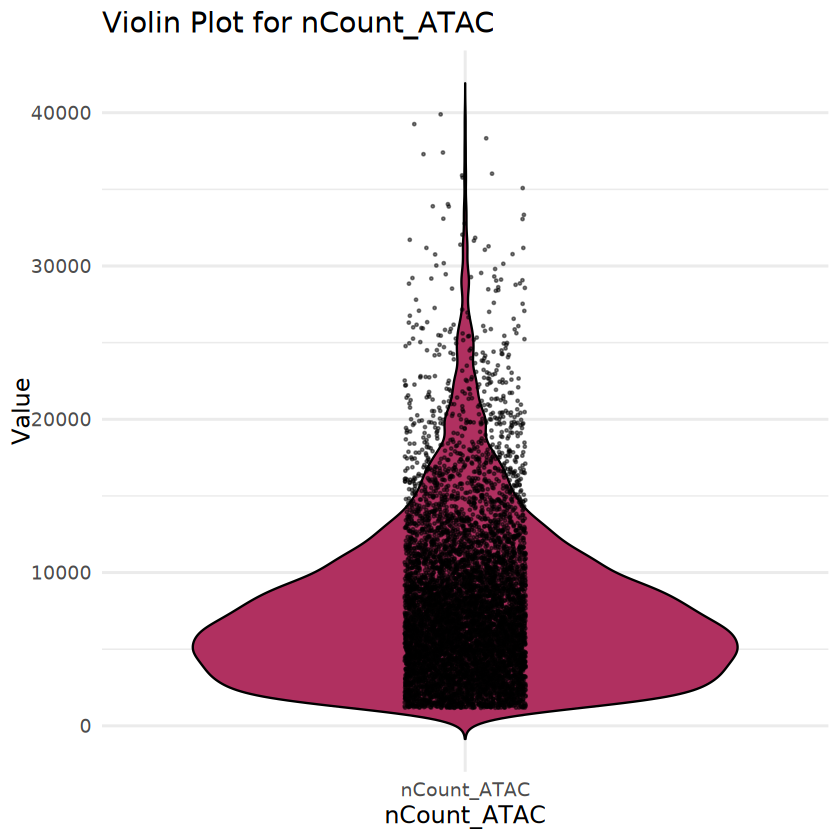

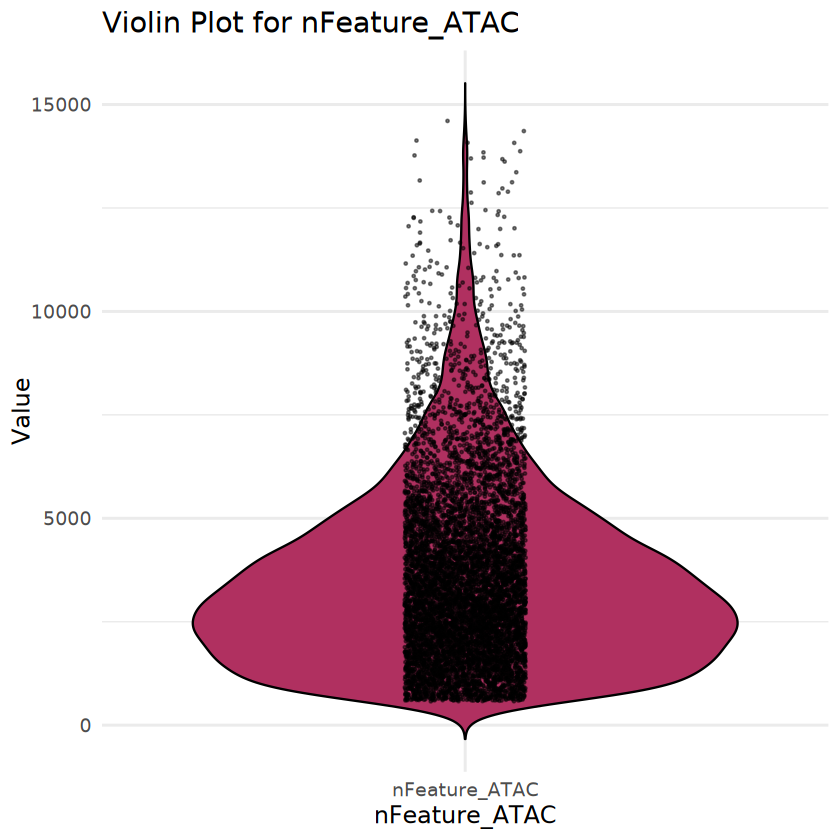

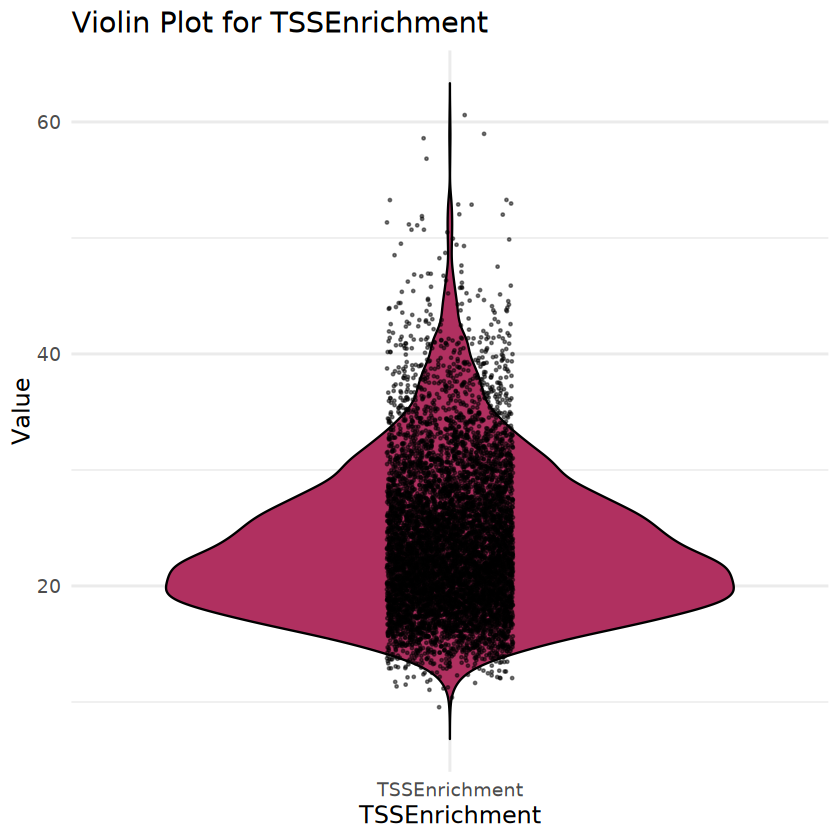

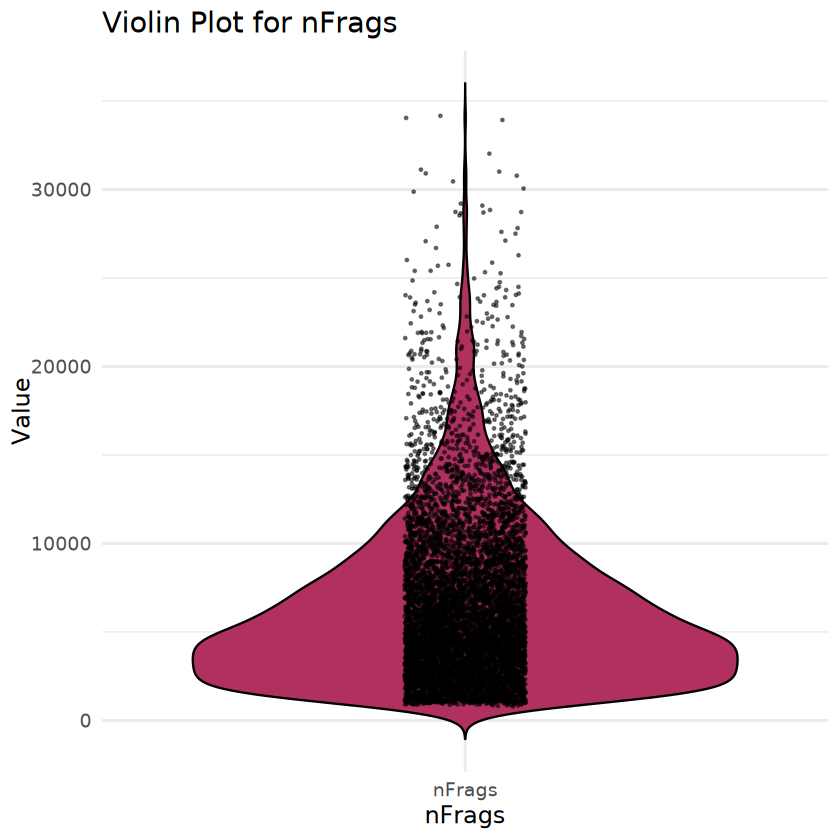

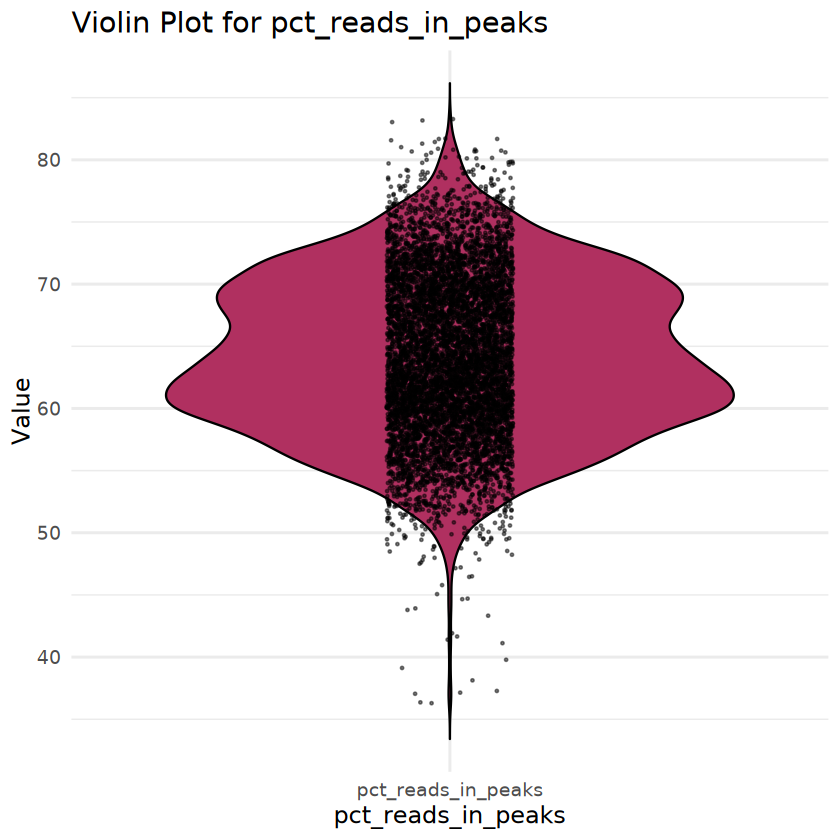

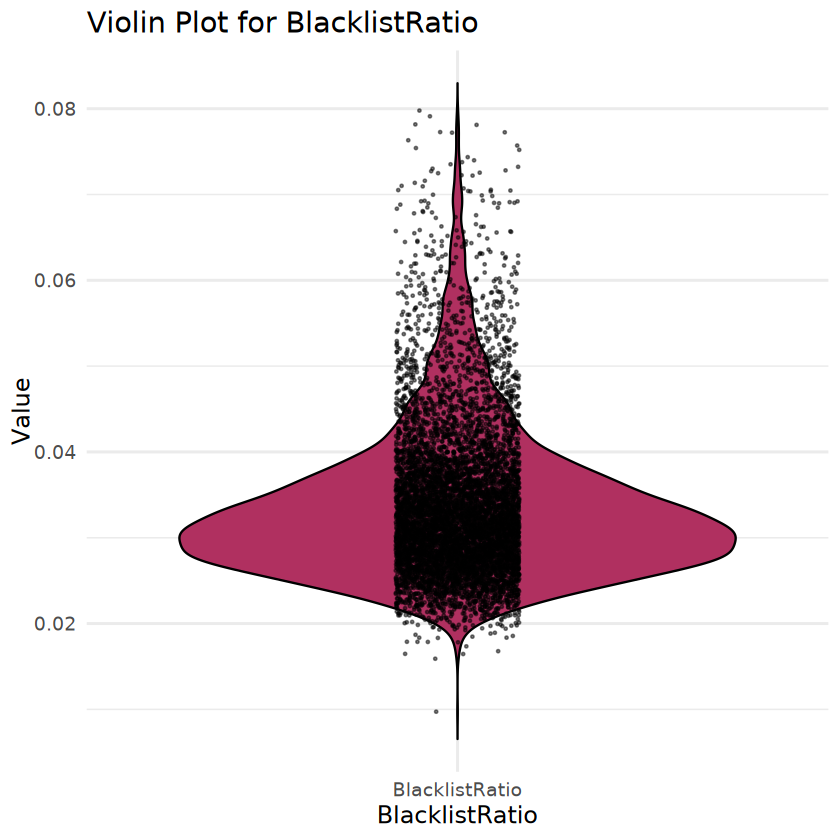

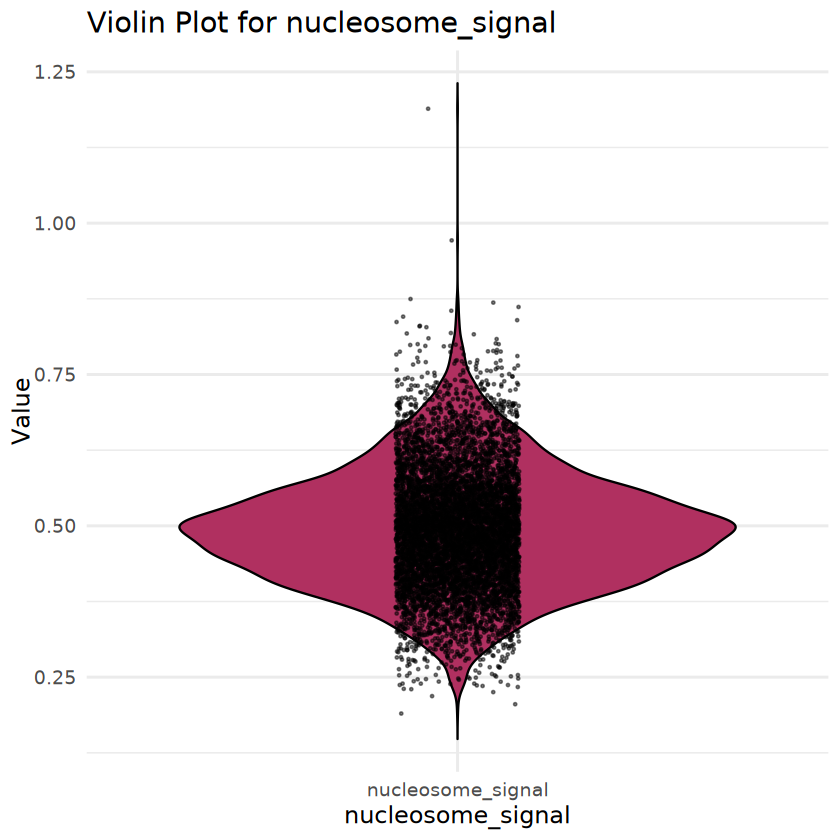

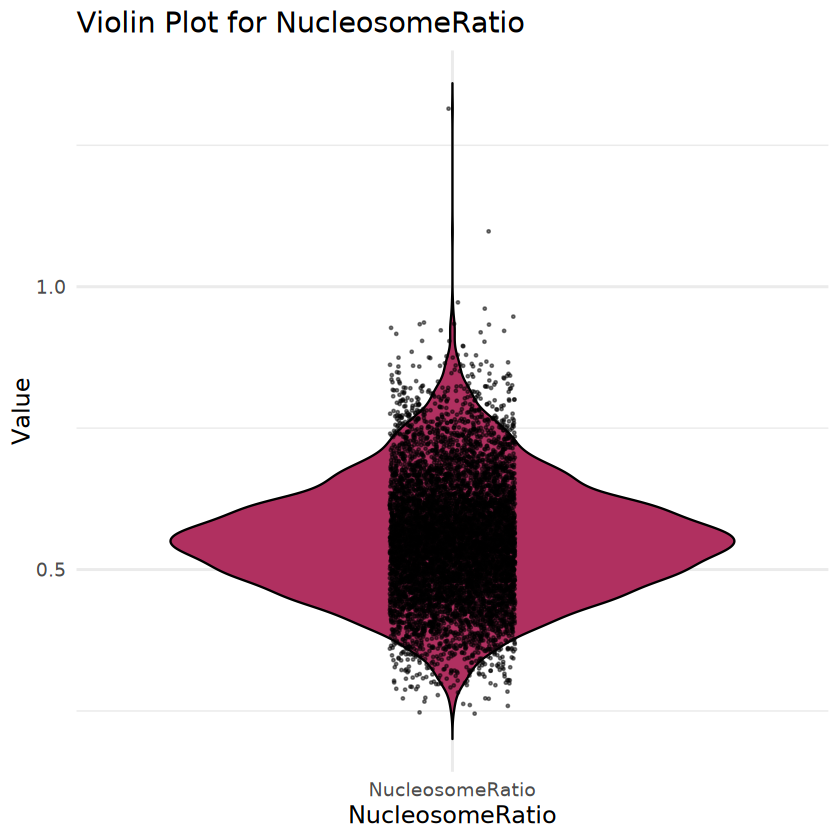

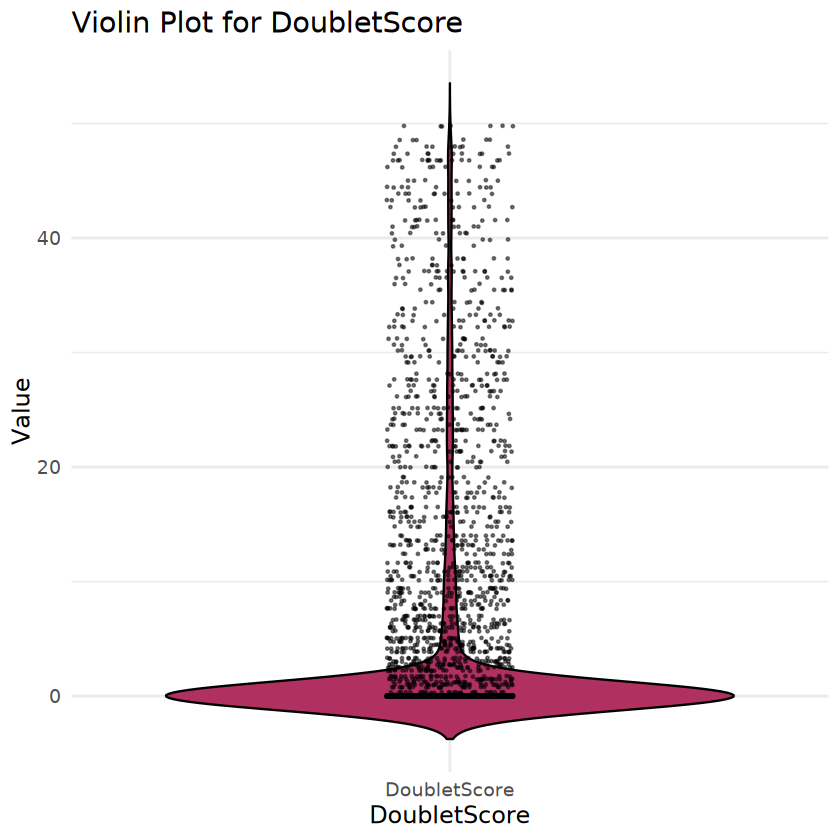

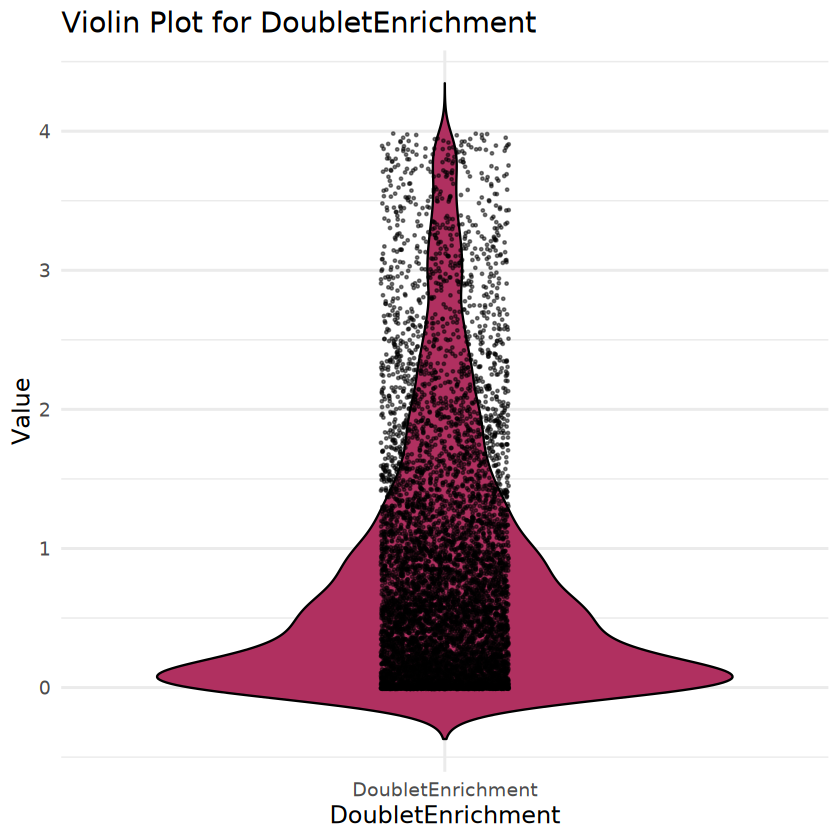

In [21]:
# Define the columns to plot
columns_to_plot <- c('nCount_ATAC', 'nFeature_ATAC', 'TSSEnrichment', 'nFrags', 'pct_reads_in_peaks',
                     'BlacklistRatio', 'nucleosome_signal', 'NucleosomeRatio','DoubletScore','DoubletEnrichment')

# Extract data from seurat_obj@meta.data
plot_data <- subset_seurat_obj1@meta.data[, columns_to_plot]

# Melt the data into a long format for plotting
plot_data_melted <- melt(plot_data, variable.name = "Feature", value.name = "Value")

# Create a list to store individual ggplot objects
plot_list <- list()
for (feature in columns_to_plot) {
  p <- ggplot(subset(plot_data_melted, Feature == feature), aes(x = Feature, y = Value)) +
    geom_violin(trim = FALSE, fill = "maroon", color = "black") +  # Violin plot
    geom_jitter(width = 0.1, color = "black", size = 0.3, alpha = 0.5) +  # Jittered points (black)
    theme_minimal(base_size = 14) +  # Larger base font size
    labs(title = paste("Violin Plot for", feature),
         x = feature,
         y = "Value")
  plot_list[[feature]] <- p
  print(p)
}
#grid.arrange(grobs = plot_list, ncol = 4, top = paste0(sample,"QC Metrics"))  # Add a main title

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100584322147c-Date-2024-11-11_Time-14-39-07.25583.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100584322147c-Date-2024-11-11_Time-14-39-07.25583.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058764d944a-Date-2024-11-11_Time-14-39-08.429535.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058764d944a-Date-2024-11-11_Time-14-39-08.429535.log



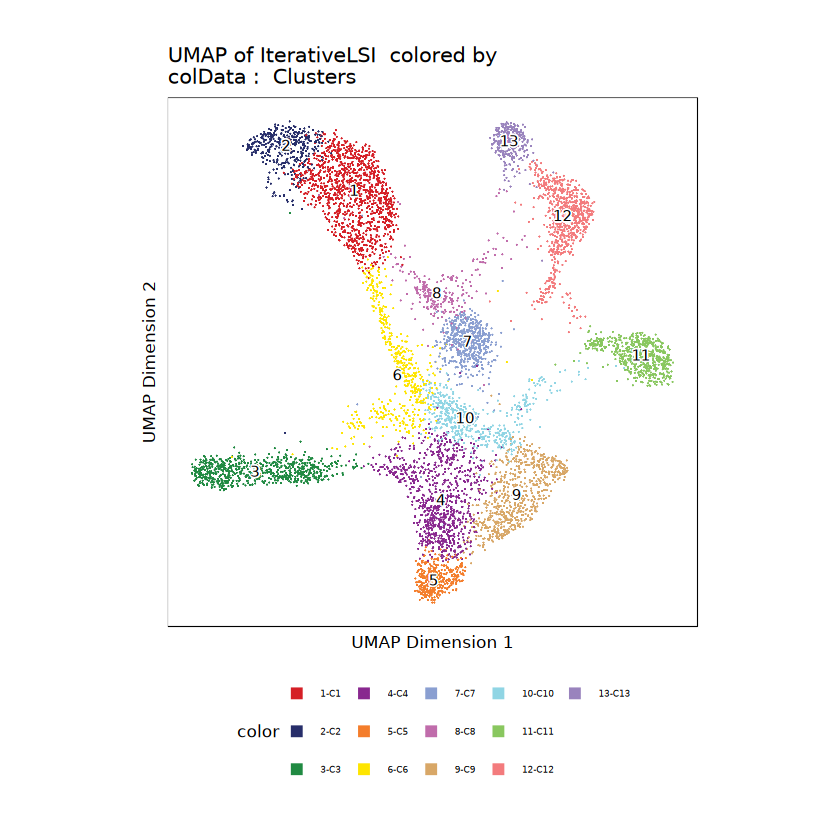

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005864be3cac-Date-2024-11-11_Time-14-39-09.346066.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005864be3cac-Date-2024-11-11_Time-14-39-09.346066.log



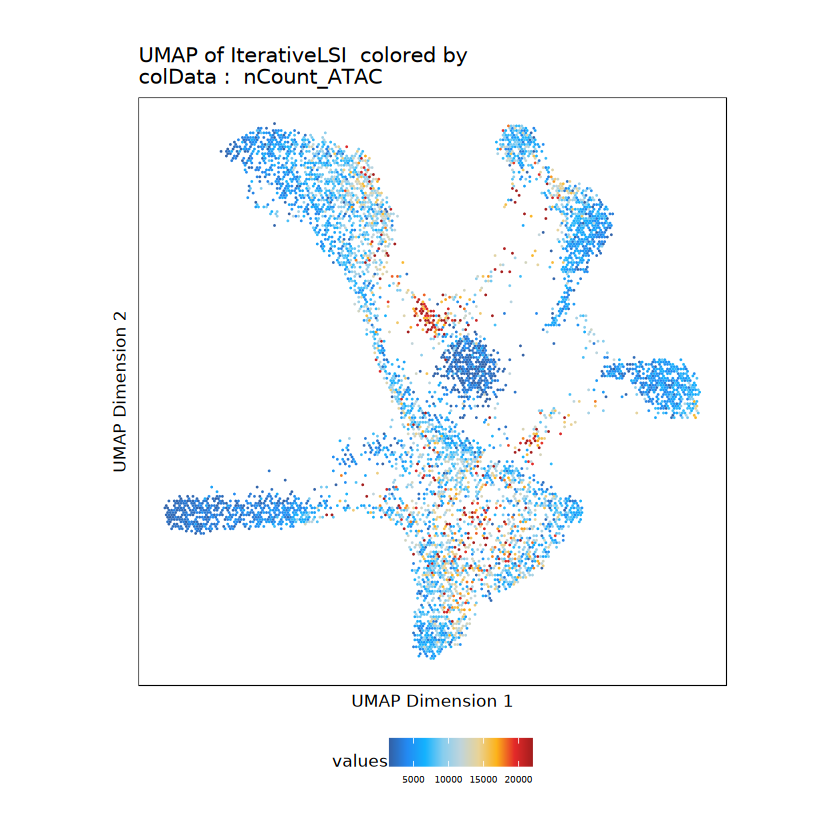

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005825e755a5-Date-2024-11-11_Time-14-39-10.275587.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005825e755a5-Date-2024-11-11_Time-14-39-10.275587.log



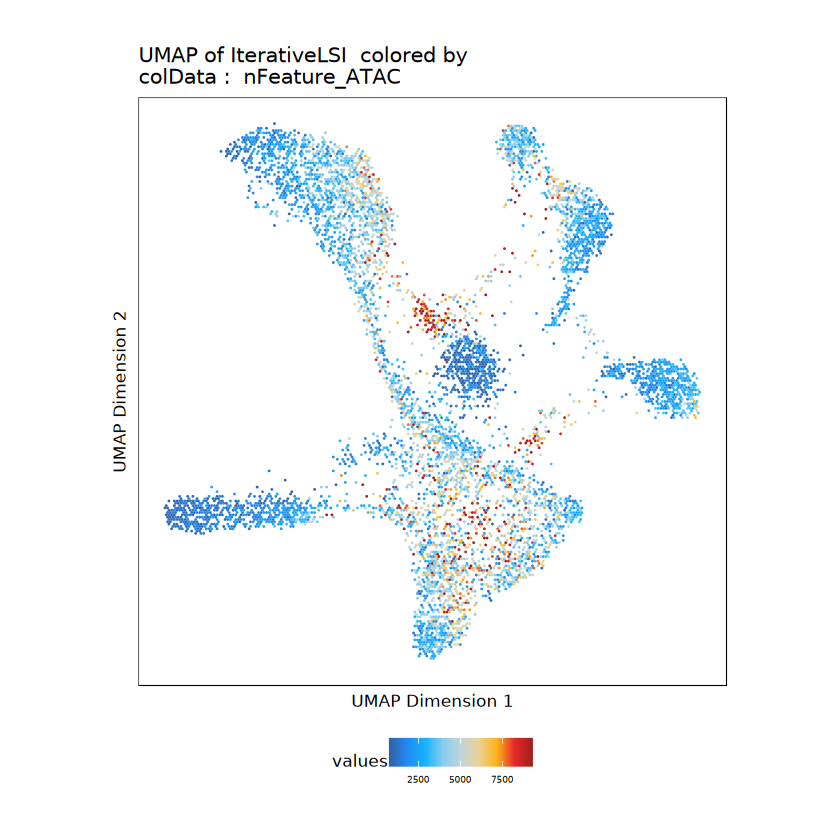

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058699c9e7f-Date-2024-11-11_Time-14-39-11.032873.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058699c9e7f-Date-2024-11-11_Time-14-39-11.032873.log



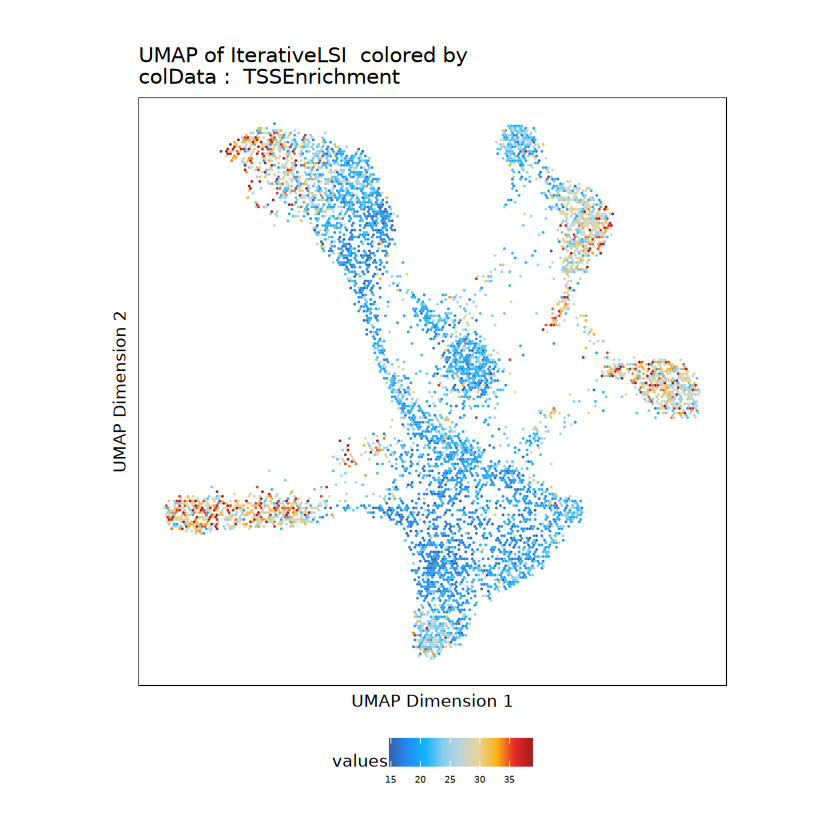

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058216a48b8-Date-2024-11-11_Time-14-39-11.802101.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058216a48b8-Date-2024-11-11_Time-14-39-11.802101.log



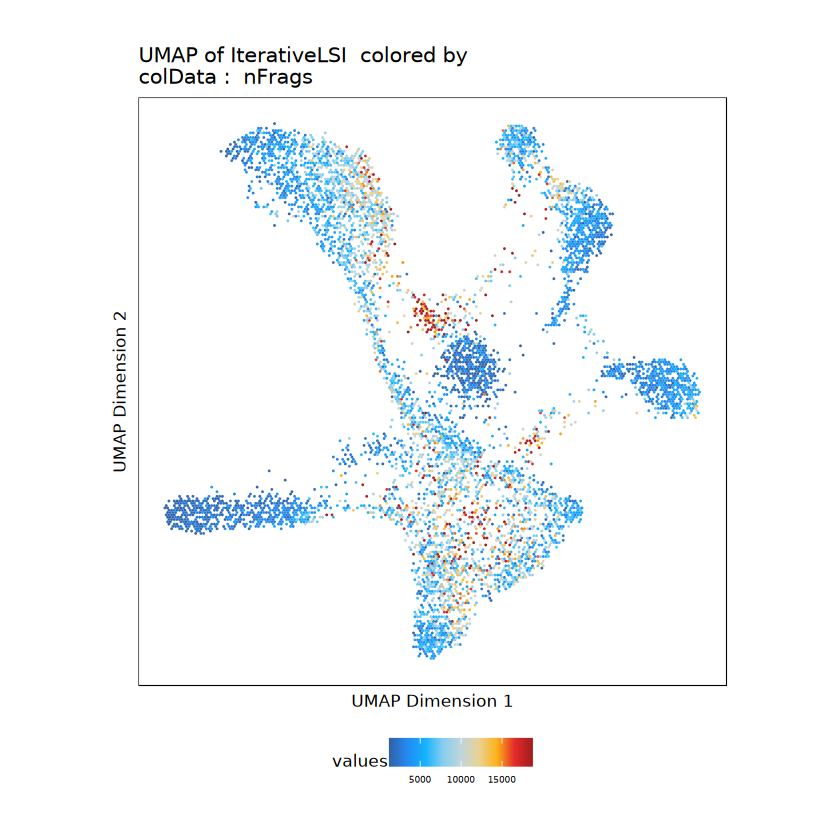

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100581297440c-Date-2024-11-11_Time-14-39-12.581281.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100581297440c-Date-2024-11-11_Time-14-39-12.581281.log



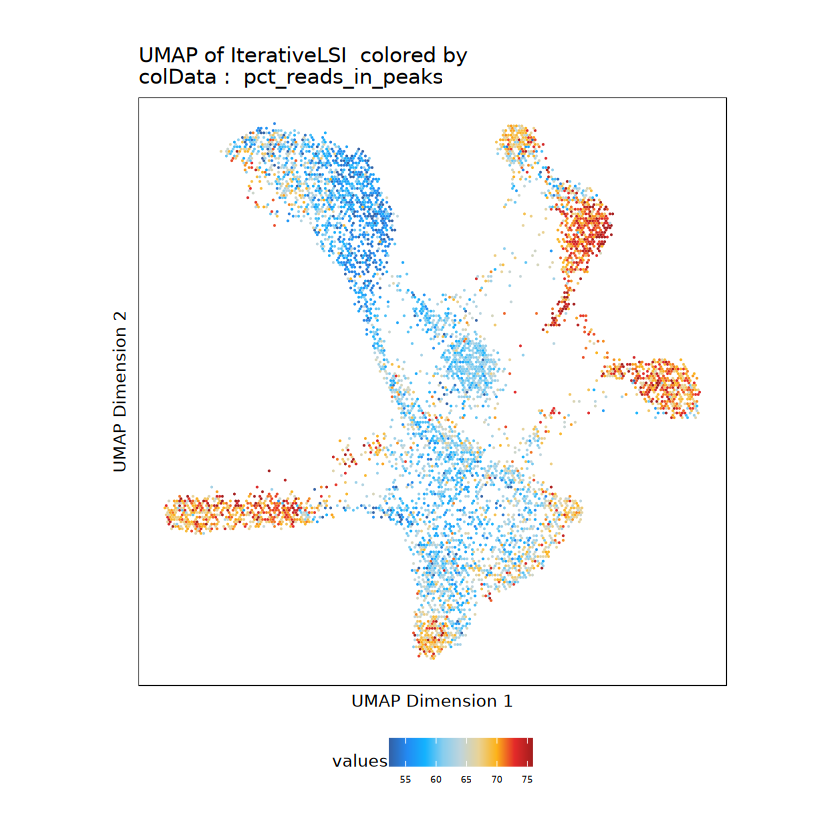

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058611efcec-Date-2024-11-11_Time-14-39-13.42437.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058611efcec-Date-2024-11-11_Time-14-39-13.42437.log



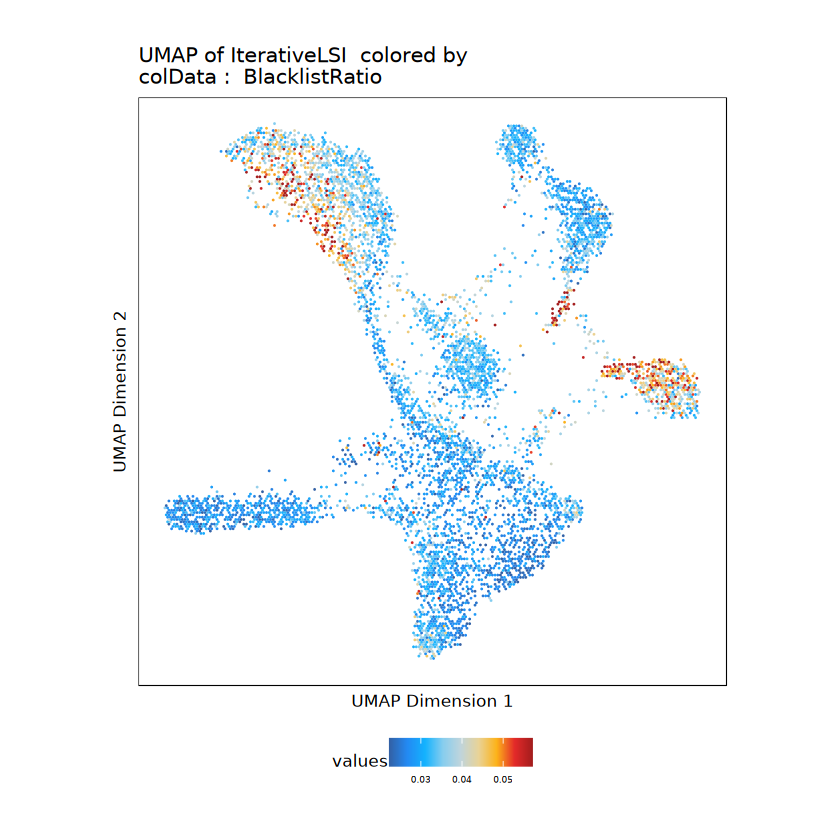

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100585e2e43f1-Date-2024-11-11_Time-14-39-14.184976.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100585e2e43f1-Date-2024-11-11_Time-14-39-14.184976.log



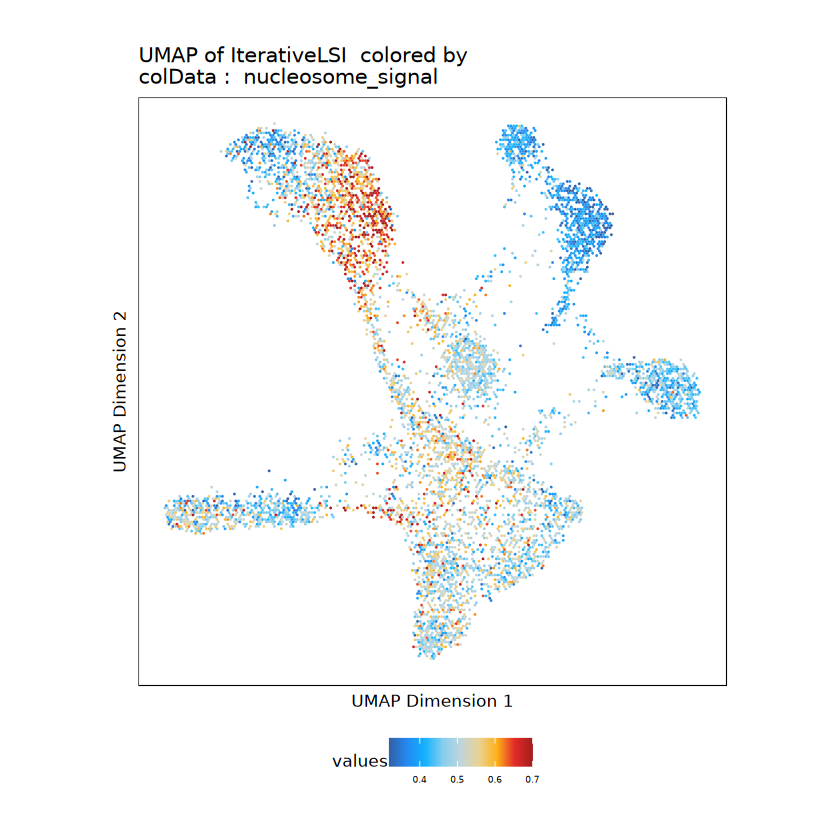

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058255620f7-Date-2024-11-11_Time-14-39-14.971303.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058255620f7-Date-2024-11-11_Time-14-39-14.971303.log



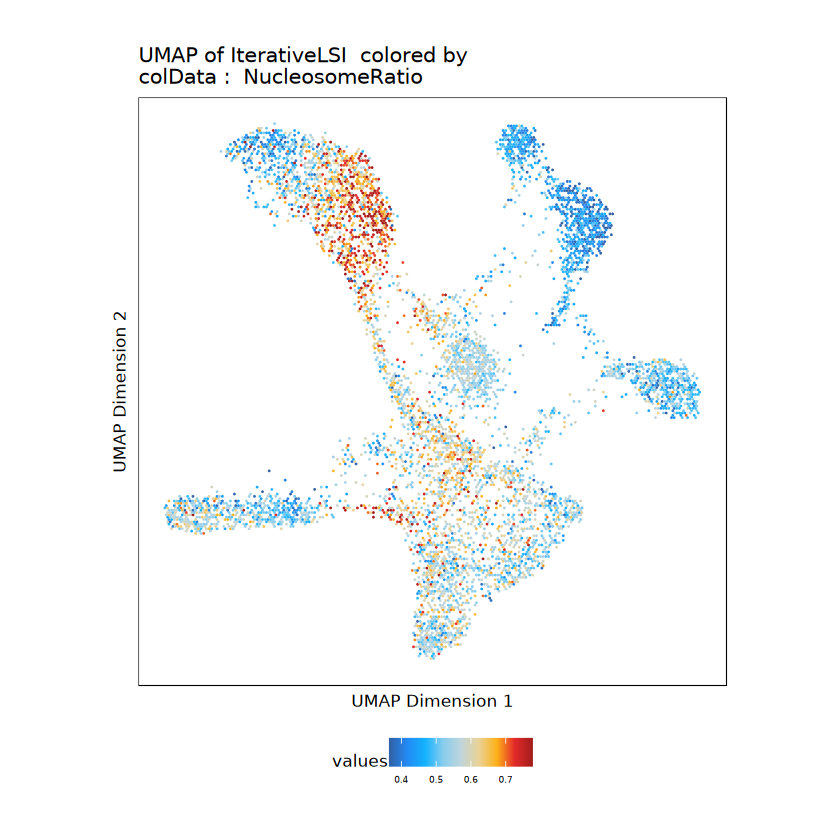

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005832fd607-Date-2024-11-11_Time-14-39-15.738681.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005832fd607-Date-2024-11-11_Time-14-39-15.738681.log



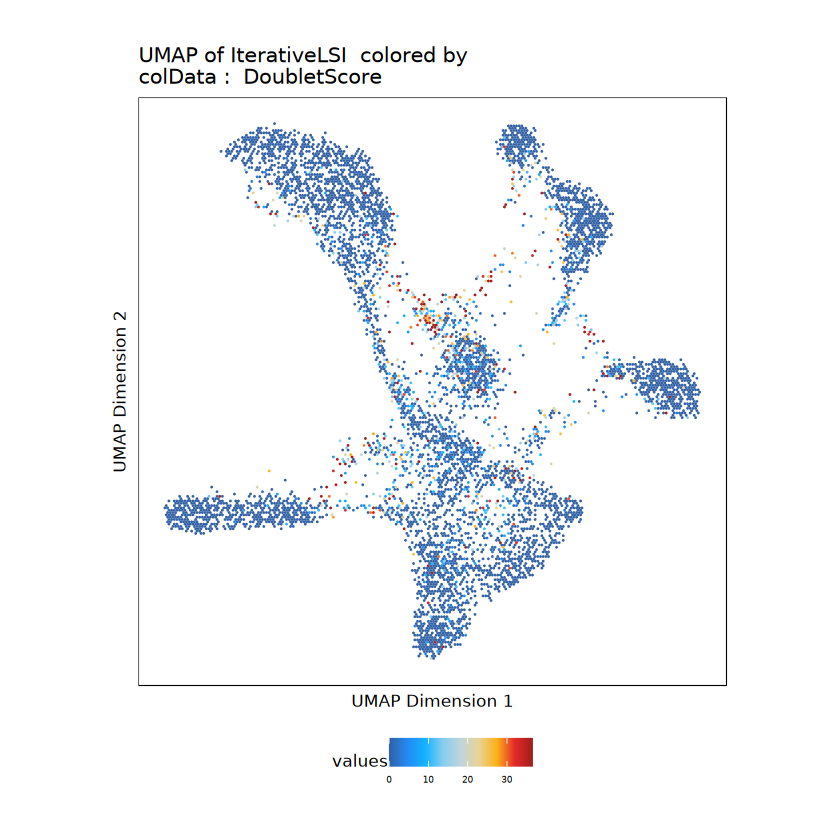

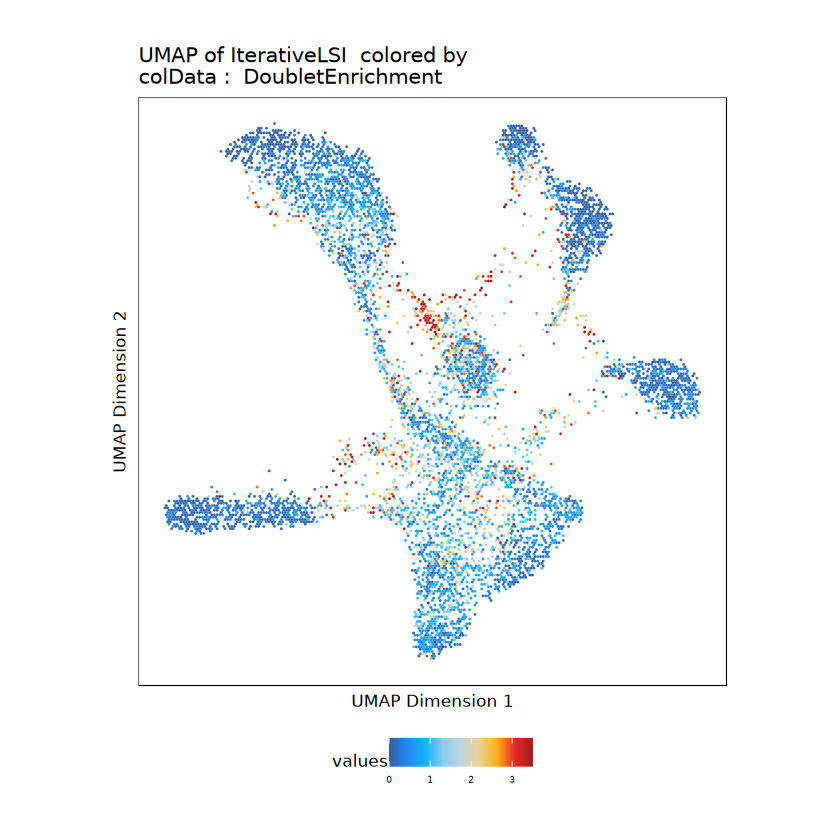

In [22]:
variables <- c('Clusters','nCount_ATAC', 'nFeature_ATAC', 'TSSEnrichment', 'nFrags', 'pct_reads_in_peaks',
                     'BlacklistRatio', 'nucleosome_signal', 'NucleosomeRatio','DoubletScore','DoubletEnrichment')
plot_list2 <- lapply(variables, function(var) {
    p <- plotEmbedding(
      ArchRProj = sub_proj1, 
      colorBy = "cellColData", 
      name = var, 
      embedding = "UMAP"
    )
    p + 
      ggtitle(paste("UMAP of", var, proj_name)) +  # Title for each plot
      theme_minimal() +  # A clean minimal theme
      theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels
  print(p)
})

#grid.arrange(grobs = plot_list2, ncol = 3, top = paste0(sample,"QC Metrics"))

# Filtering Round 2

In [37]:
subset_seurat_obj2 <- subset(
  subset_seurat_obj1,
  subset = nCount_ATAC < 35000 & nCount_ATAC > 100 &
          nFeature_ATAC < 25000 & nFeature_ATAC > 100 &
          TSSEnrichment > 4 & TSSEnrichment < 55 &
          pct_reads_in_peaks > 40 &
          nFrags < 27000 &
          #BlacklistRatio < 0.055 & 
          #nucleosome_signal < 1.1 &
          #NucleosomeRatio > 0.4 & NucleosomeRatio < 1.2 &
          DoubletScore < 10 &
          DoubletEnrichment < 6
)
dim(seurat_obj)
dim(subset_seurat_obj1)
dim(subset_seurat_obj2)

[1] 144270   8389

[1] 144270   7757

[1] 144270   6994

In [38]:
subset_seurat_obj1@meta.data$filter_status <- ifelse(rownames(subset_seurat_obj1@meta.data) %in% rownames(subset_seurat_obj2@meta.data), "Included", "Excluded")
sub_proj1 <- addCellColData(
        ArchRProj = sub_proj1,
        data = subset_seurat_obj1@meta.data$filter_status,
        name = 'filter_status', 
        cells = subset_seurat_obj1@meta.data$archr_barcodes,
        force = TRUE)

Overriding previous entry for filter_status



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005845b1ff44-Date-2024-11-11_Time-14-56-54.851619.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005845b1ff44-Date-2024-11-11_Time-14-56-54.851619.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100581a276e7a-Date-2024-11-11_Time-14-56-56.147676.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100581a276e7a-Date-2024-11-11_Time-14-56-56.147676.log



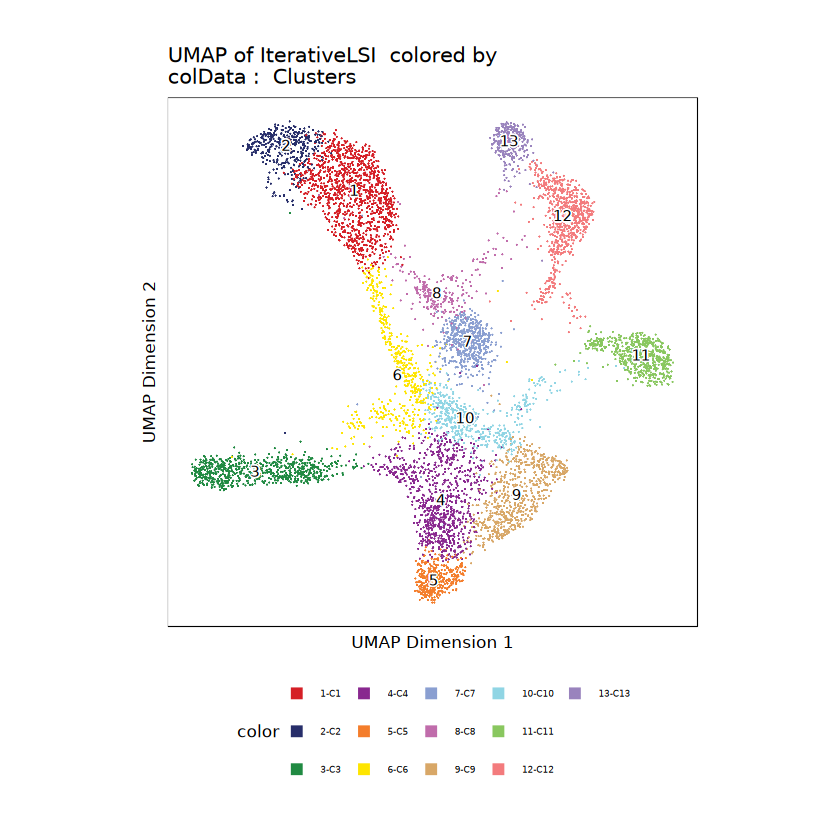

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005876223a74-Date-2024-11-11_Time-14-56-57.47381.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005876223a74-Date-2024-11-11_Time-14-56-57.47381.log



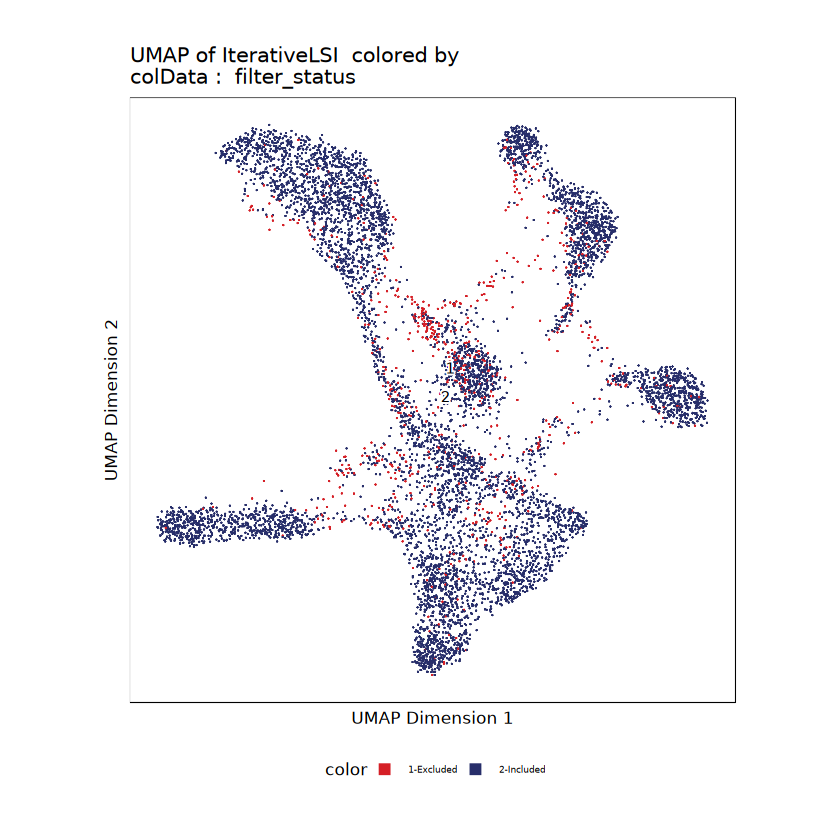

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005843a293f4-Date-2024-11-11_Time-14-56-58.639567.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005843a293f4-Date-2024-11-11_Time-14-56-58.639567.log



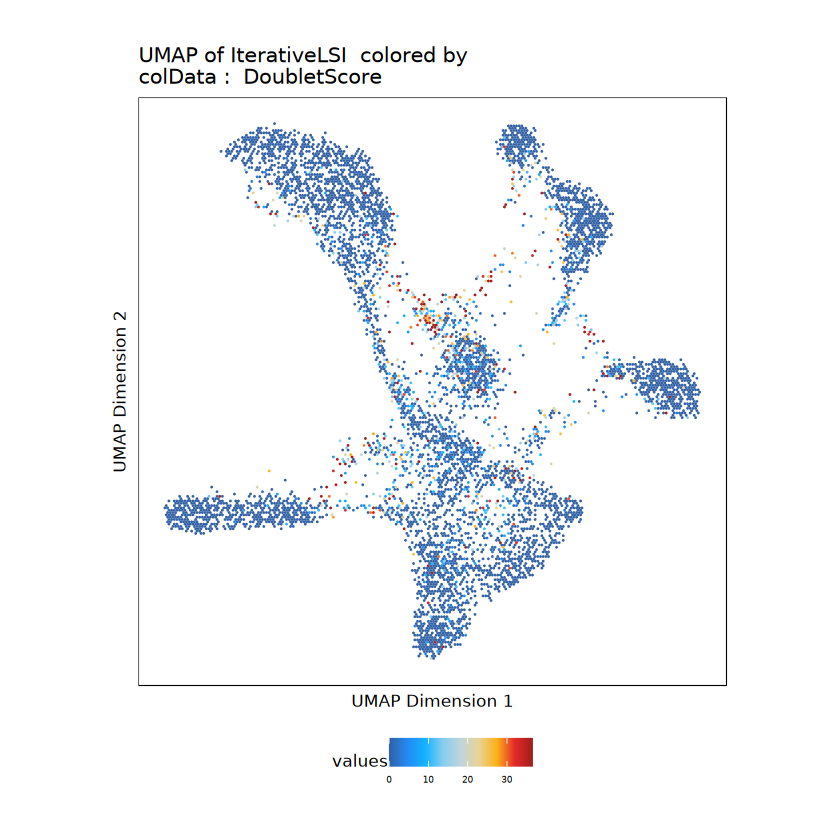

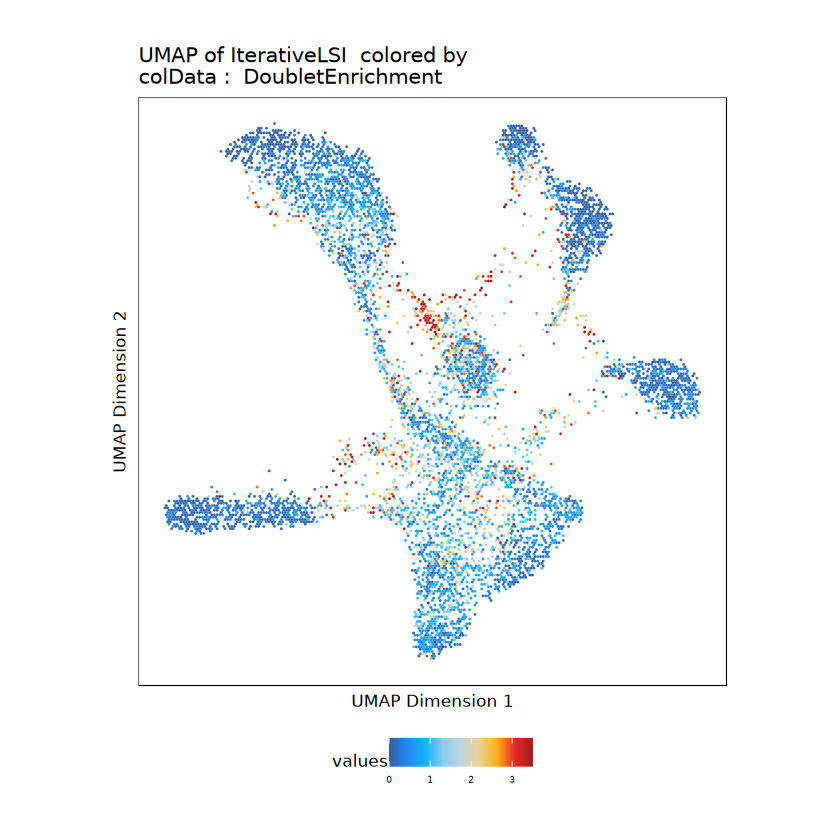

In [39]:
variables <- c('Clusters','filter_status','DoubletScore','DoubletEnrichment')
plot_list2 <- lapply(variables, function(var) {
    p <- plotEmbedding(
      ArchRProj = sub_proj1, 
      colorBy = "cellColData", 
      name = var, 
      embedding = "UMAP"
    )
    p + 
      ggtitle(paste("UMAP of", var, proj_name)) +  # Title for each plot
      theme_minimal() +  # A clean minimal theme
      theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels
  print(p)
})

In [40]:
sub_proj1 <- saveArchRProject(ArchRProj = sub_proj1)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

In [41]:
setwd(Archr_Dir)
sub_proj2 <- subsetArchRProject(
  ArchRProj = sub_proj1,
  cells = subset_seurat_obj2@meta.data$archr_barcodes,
  outputDirectory = "filter_round2",
  dropCells = TRUE,
  force = TRUE
)

Copying ArchRProject to new outputDirectory : /athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/per_sample_Archr/MAZ1_ArchR/filter_round2

Copying Arrow Files...

.copyArrow : Initializing Out ArrowFile

.copyArrow : Adding Metadata to Out ArrowFile

.copyArrow : Adding SubMatrices to Out ArrowFile

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 4): Embeddings

Copying Other Files (2 of 4): export

Copying Other Files (3 of 4): IterativeLSI

Copying Other Files (4 of 4): MAZ1

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /         

In [42]:
saveRDS(subset_seurat_obj2, file = "filter2_seurat_object.rds")

# Analyze Round 3

In [ ]:
#subset_seurat_obj2 <- readRDS("filter1_seurat_object.rds")
sub_proj2 <- loadArchRProject(file.path(Archr_Dir,'filter_round2'))

In [43]:
sub_proj2


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/per_sample_Archr/MAZ1_ArchR/filter_round2 
samples(1): MAZ1
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ... nucleosome_signal
  filter_status
numberOfCells(1): 6994
medianTSS(1): 22.61
medianFrags(1): 5119

In [44]:
subset_seurat_obj2

An object of class Seurat 
144270 features across 6994 samples within 1 assay 
Active assay: ATAC (144270 features, 0 variable features)
 2 layers present: counts, data

In [45]:
sub_proj2 <- addIterativeLSI(ArchRProj = sub_proj2, useMatrix = "TileMatrix", name = "IterativeLSI",force=TRUE)
sub_proj2 <- addUMAP(sub_proj2, reducedDims = "IterativeLSI", name = "UMAP",force=TRUE)
sub_proj2 <- addClusters(input = sub_proj2, reducedDims = "IterativeLSI", name = "Clusters",force=TRUE)

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-21005841e72079-Date-2024-11-11_Time-14-59-16.543338.log
If there is an issue, please report to github with logFile!

2024-11-11 14:59:16.769951 : Computing Total Across All Features, 0 mins elapsed.

2024-11-11 14:59:17.371814 : Computing Top Features, 0.011 mins elapsed.

###########
2024-11-11 14:59:18.551684 : Running LSI (1 of 2) on Top Features, 0.03 mins elapsed.
###########

2024-11-11 14:59:18.571675 : Creating Partial Matrix, 0.031 mins elapsed.

2024-11-11 14:59:25.054757 : Computing LSI, 0.139 mins elapsed.

2024-11-11 14:59:53.222614 : Identifying Clusters, 0.608 mins elapsed.

Warning message:
“Data is of class matrix. Coercing to dgCMatrix.”
2024-11-11 15:00:02.211999 : Identified 6 Clusters, 0.758 mins elapsed.

2024-11-11 15:00:02.220951 : Saving LSI Iteration, 0.758 mins elapsed.




************************************************************
2024-11-11 15:00:17.49898 : ERROR Found in .saveIteration for  
LogFile = ArchRLogs/ArchR-addIterativeLSI-21005841e72079-Date-2024-11-11_Time-14-59-16.543338.log

<simpleError in g$grobs[[legend]]: no such index at level 2
>

************************************************************



2024-11-11 15:00:17.500826 : Creating Cluster Matrix on the total Group Features, 1.013 mins elapsed.

2024-11-11 15:00:42.77675 : Computing Variable Features, 1.434 mins elapsed.

###########
2024-11-11 15:00:42.917497 : Running LSI (2 of 2) on Variable Features, 1.436 mins elapsed.
###########

2024-11-11 15:00:42.938478 : Creating Partial Matrix, 1.437 mins elapsed.

2024-11-11 15:00:48.744988 : Computing LSI, 1.533 mins elapsed.

2024-11-11 15:01:12.617119 : Finished Running IterativeLSI, 1.931 mins elapsed.

15:01:12 UMAP embedding parameters a = 0.7669 b = 1.223

15:01:12 Read 6994 rows and found 30 numeric columns

15:01:12 Using Annoy for neighbor search, n_neighbors = 40

15:01:12 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:01:13 Writing NN index file t

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6994
Number of edges: 427761

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8308
Number of communities: 11
Elapsed time: 0 seconds


2024-11-11 15:01:34.556783 : Testing Outlier Clusters, 0.125 mins elapsed.

2024-11-11 15:01:34.561992 : Assigning Cluster Names to 11 Clusters, 0.125 mins elapsed.

2024-11-11 15:01:34.597976 : Finished addClusters, 0.125 mins elapsed.



In [46]:
sub_proj2 <- saveArchRProject(ArchRProj = sub_proj2)
archr_metadata2 <- getCellColData(sub_proj2)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

# Plot QC Metrics

In [47]:
p1 <- DensityScatter(subset_seurat_obj2, x = 'nCount_ATAC', y = 'TSSEnrichment', log_x = TRUE, quantiles = TRUE)
p2 <- DensityScatter(subset_seurat_obj2, x = 'nucleosome_signal', y = 'TSSEnrichment', log_x = TRUE, quantiles = TRUE)
p1
p2

ERROR while rich displaying an object: Error in `geom_point()`:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error in `FUN()`:
! `data` must be uniquely named but has duplicate columns

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[

ERROR while rich displaying an object: Error in `geom_point()`:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error in `FUN()`:
! `data` must be uniquely named but has duplicate columns

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[

No id variables; using all as measure variables



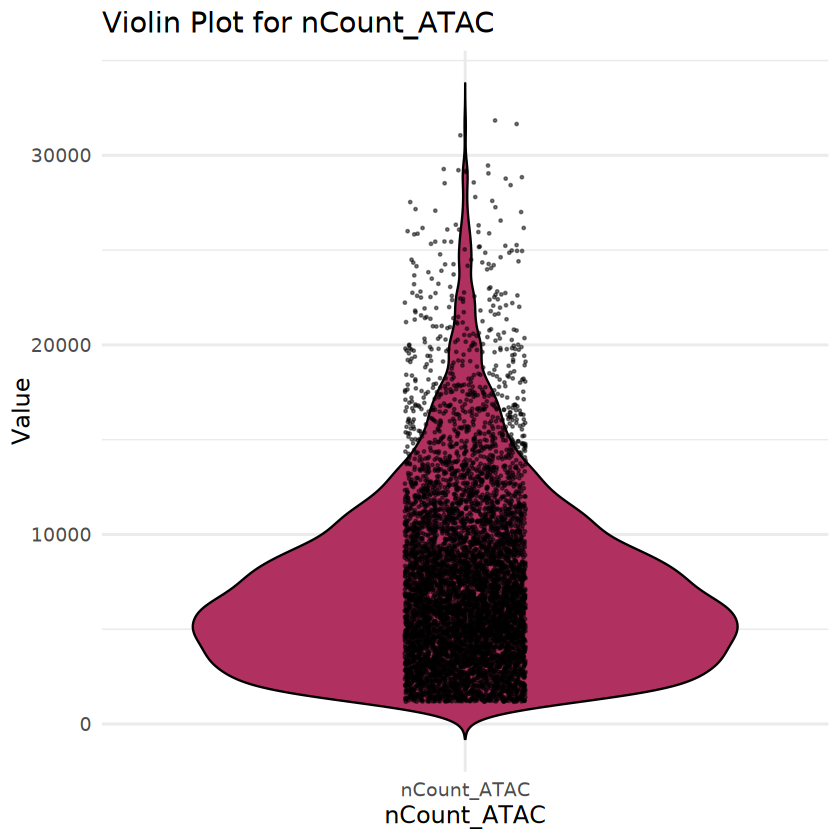

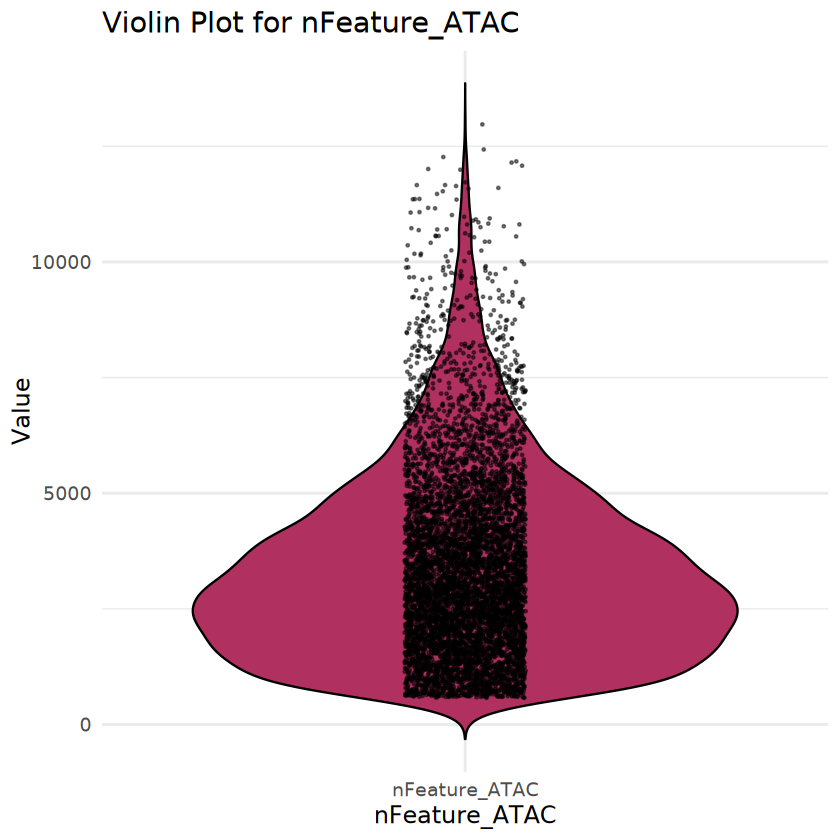

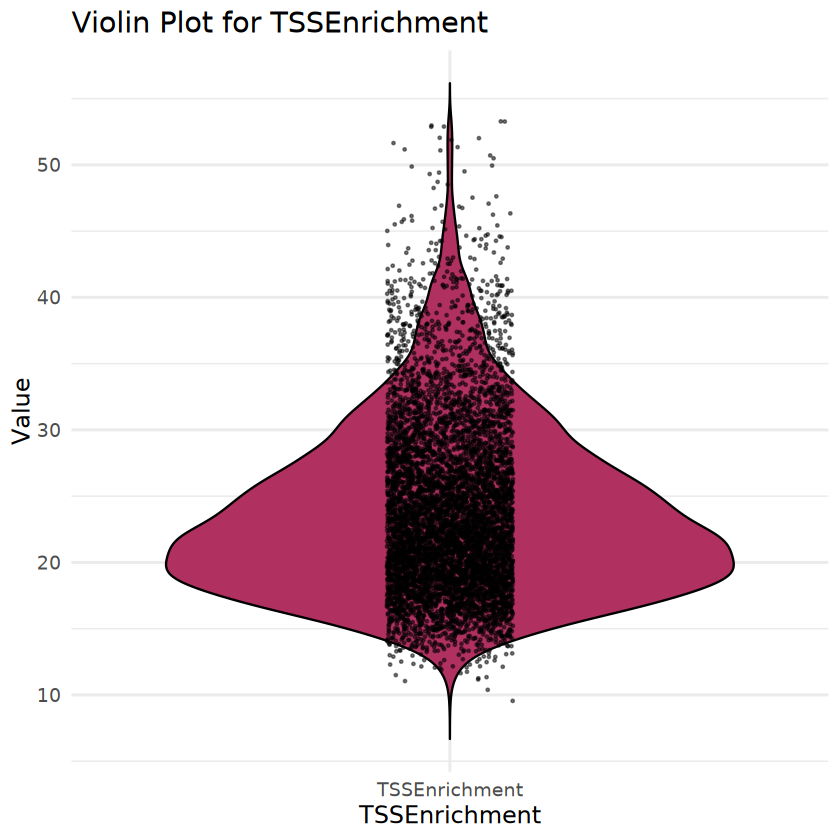

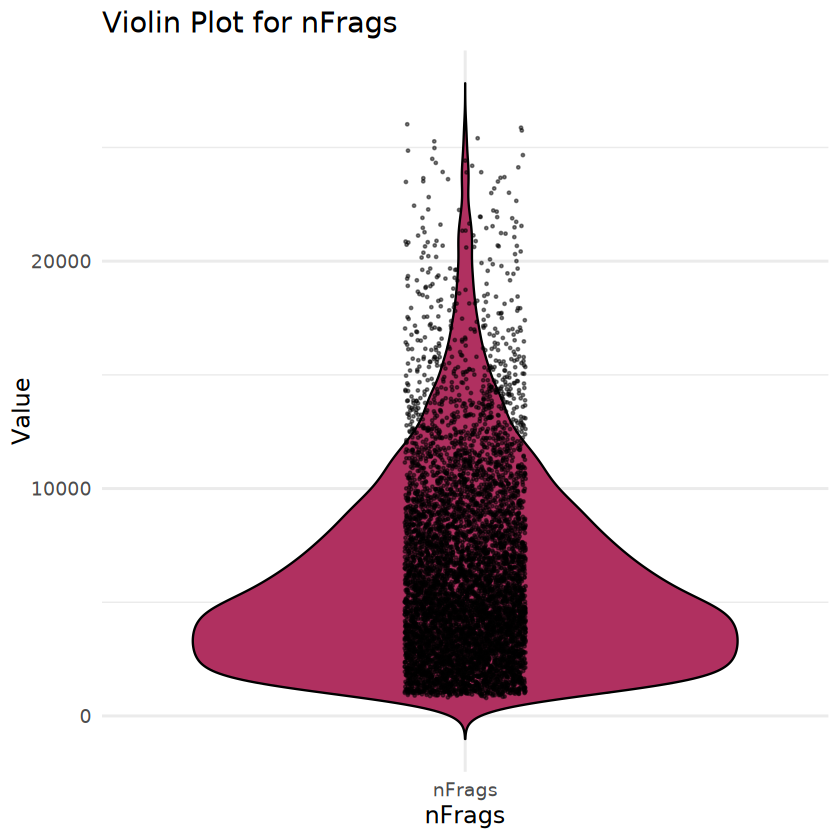

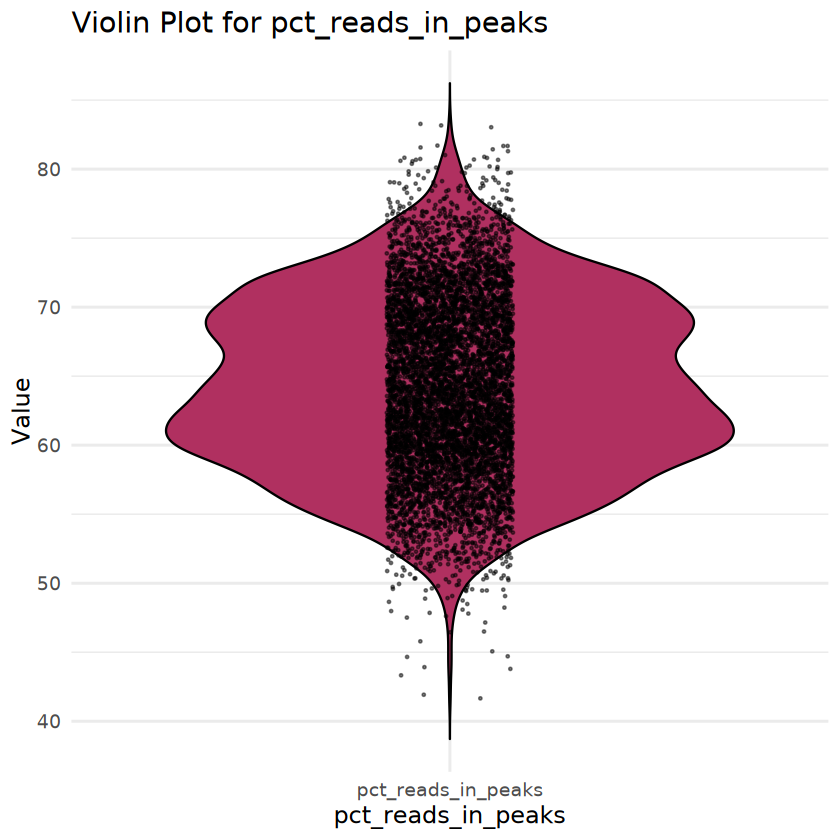

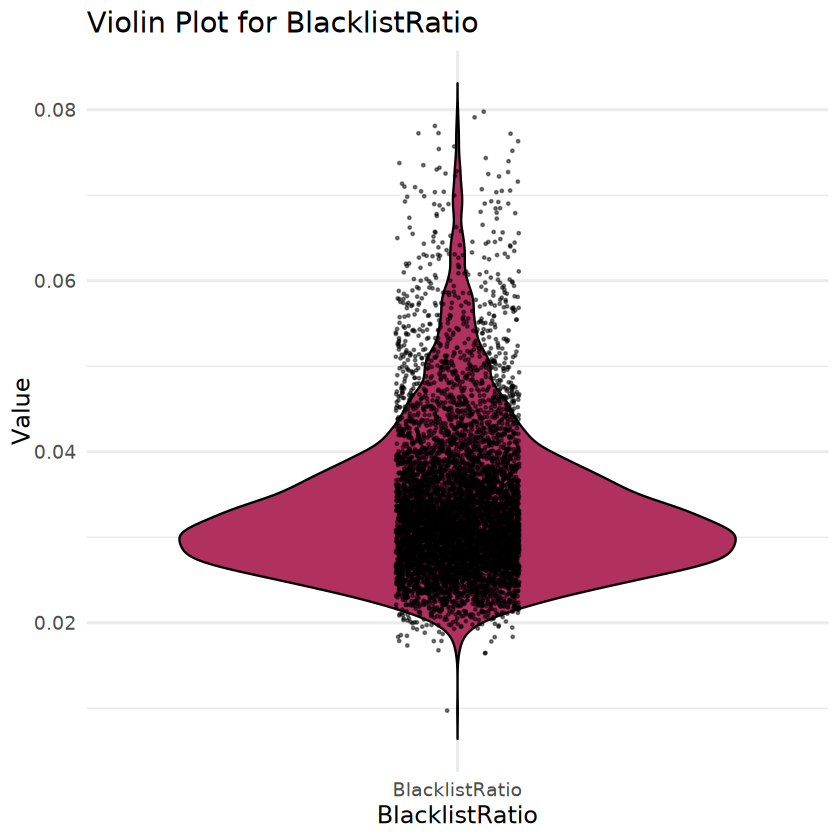

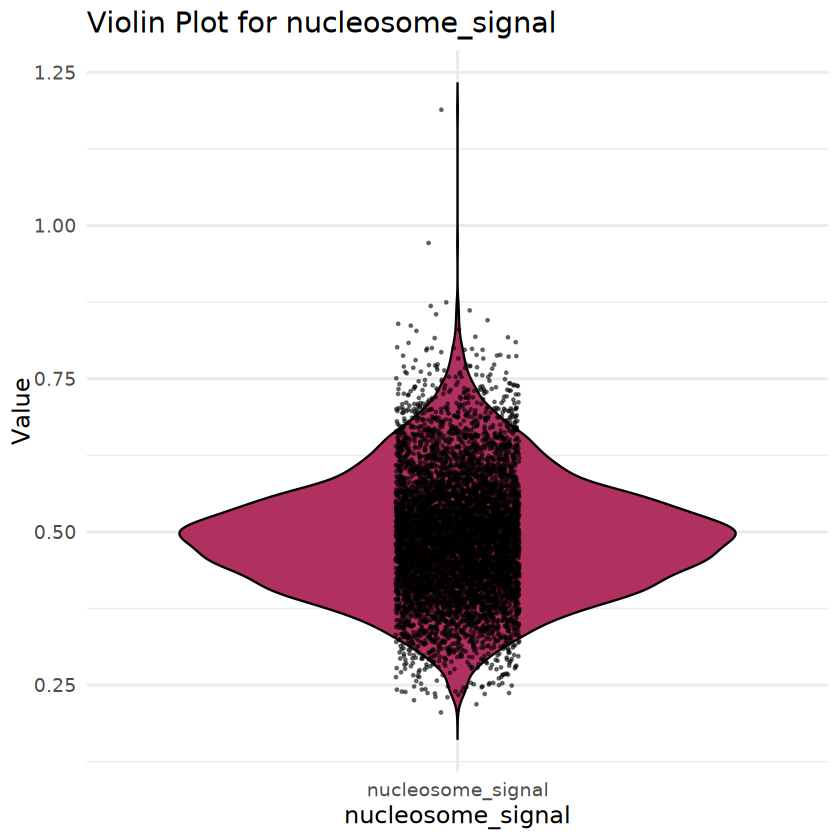

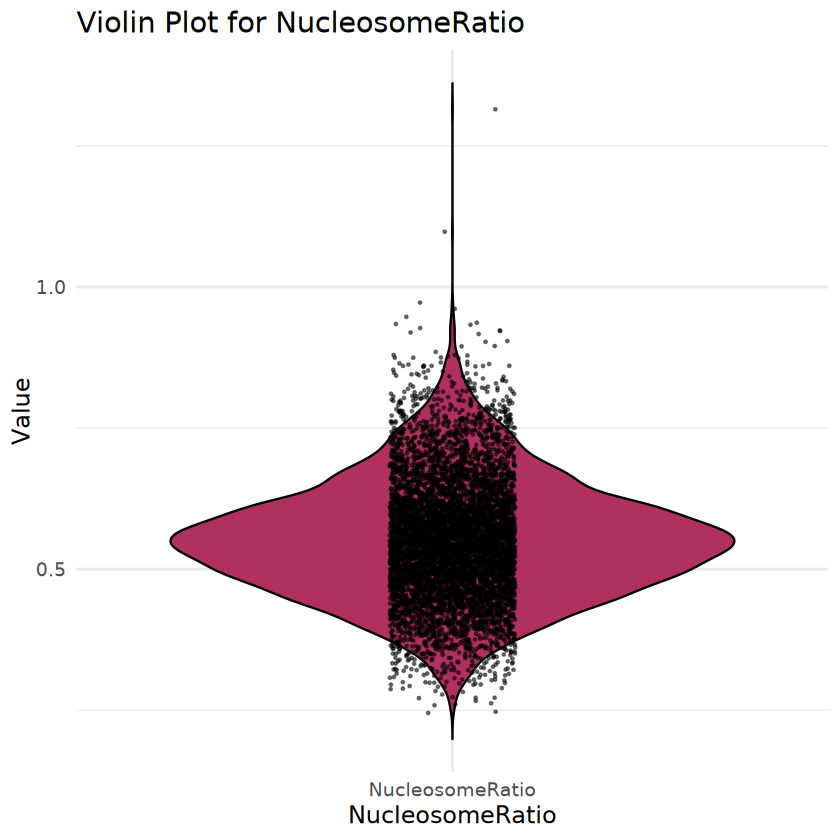

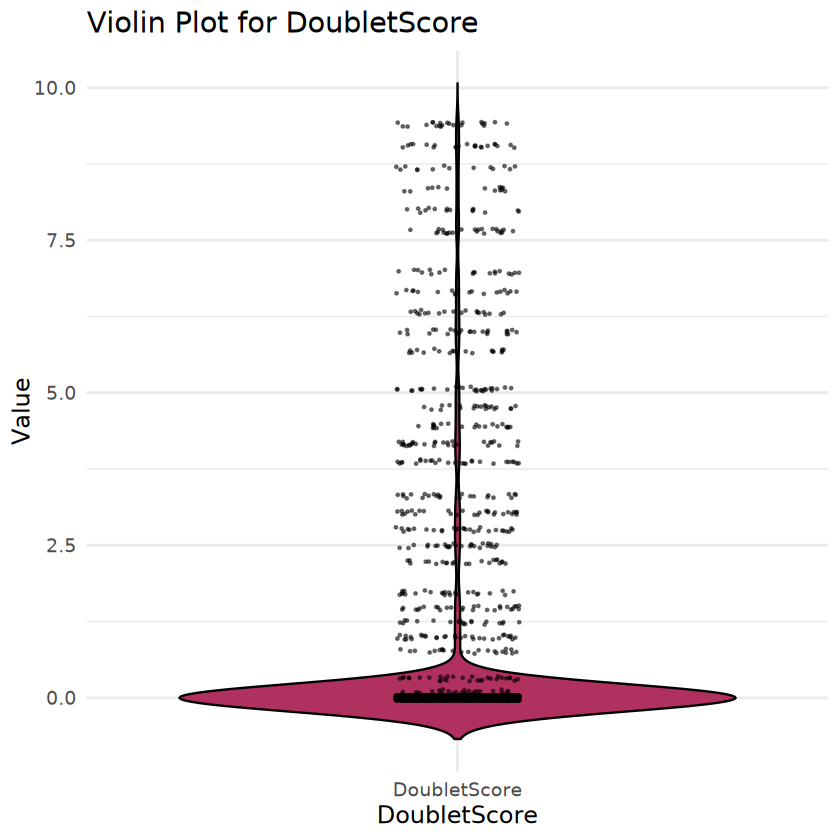

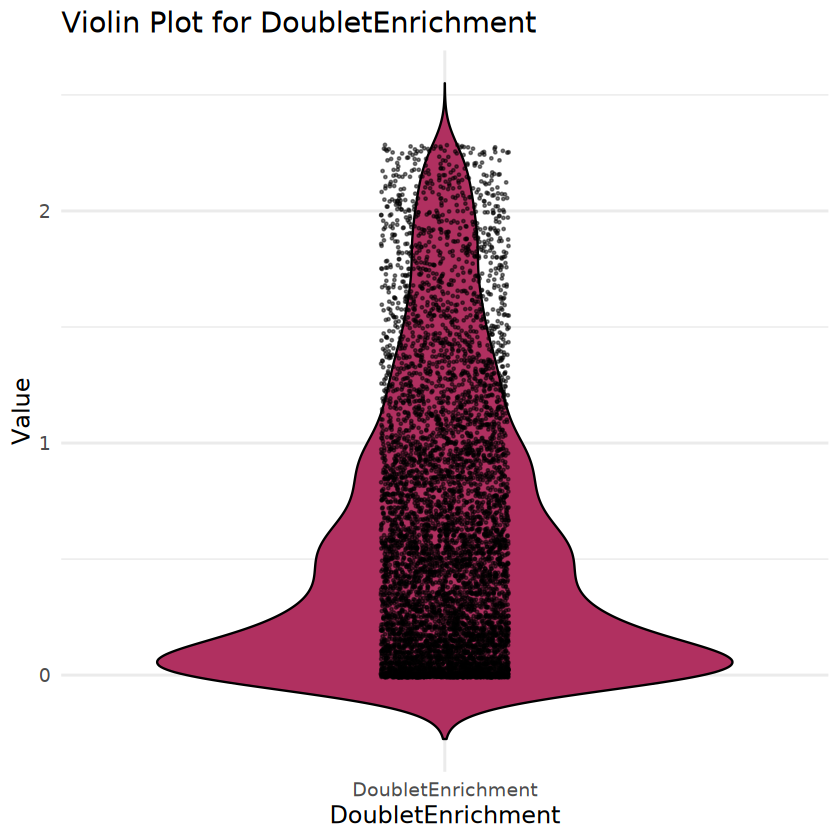

In [48]:
# Define the columns to plot
columns_to_plot <- c('nCount_ATAC', 'nFeature_ATAC', 'TSSEnrichment', 'nFrags', 'pct_reads_in_peaks',
                     'BlacklistRatio', 'nucleosome_signal', 'NucleosomeRatio','DoubletScore','DoubletEnrichment')

# Extract data from seurat_obj@meta.data
plot_data <- subset_seurat_obj2@meta.data[, columns_to_plot]

# Melt the data into a long format for plotting
plot_data_melted <- melt(plot_data, variable.name = "Feature", value.name = "Value")

# Create a list to store individual ggplot objects
plot_list <- list()
for (feature in columns_to_plot) {
  p <- ggplot(subset(plot_data_melted, Feature == feature), aes(x = Feature, y = Value)) +
    geom_violin(trim = FALSE, fill = "maroon", color = "black") +  # Violin plot
    geom_jitter(width = 0.1, color = "black", size = 0.3, alpha = 0.5) +  # Jittered points (black)
    theme_minimal(base_size = 14) +  # Larger base font size
    labs(title = paste("Violin Plot for", feature),
         x = feature,
         y = "Value")
  plot_list[[feature]] <- p
  print(p)
}
#grid.arrange(grobs = plot_list, ncol = 4, top = paste0(sample,"QC Metrics"))  # Add a main title

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005876045f06-Date-2024-11-11_Time-15-01-41.773811.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005876045f06-Date-2024-11-11_Time-15-01-41.773811.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058171de58c-Date-2024-11-11_Time-15-01-43.555688.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058171de58c-Date-2024-11-11_Time-15-01-43.555688.log



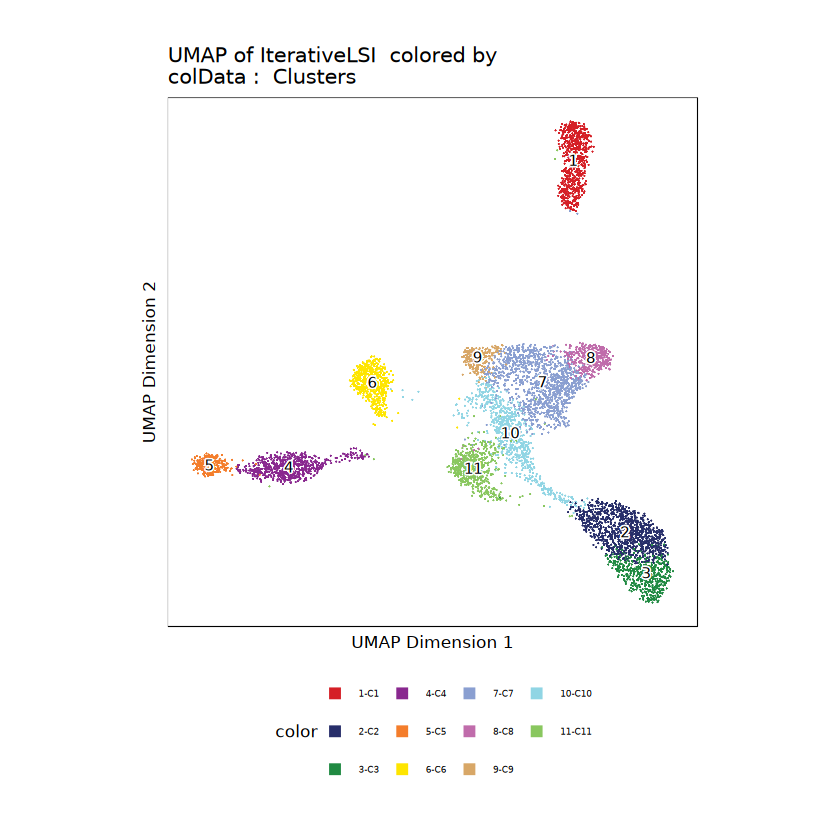

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005824183cbf-Date-2024-11-11_Time-15-01-44.410628.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005824183cbf-Date-2024-11-11_Time-15-01-44.410628.log



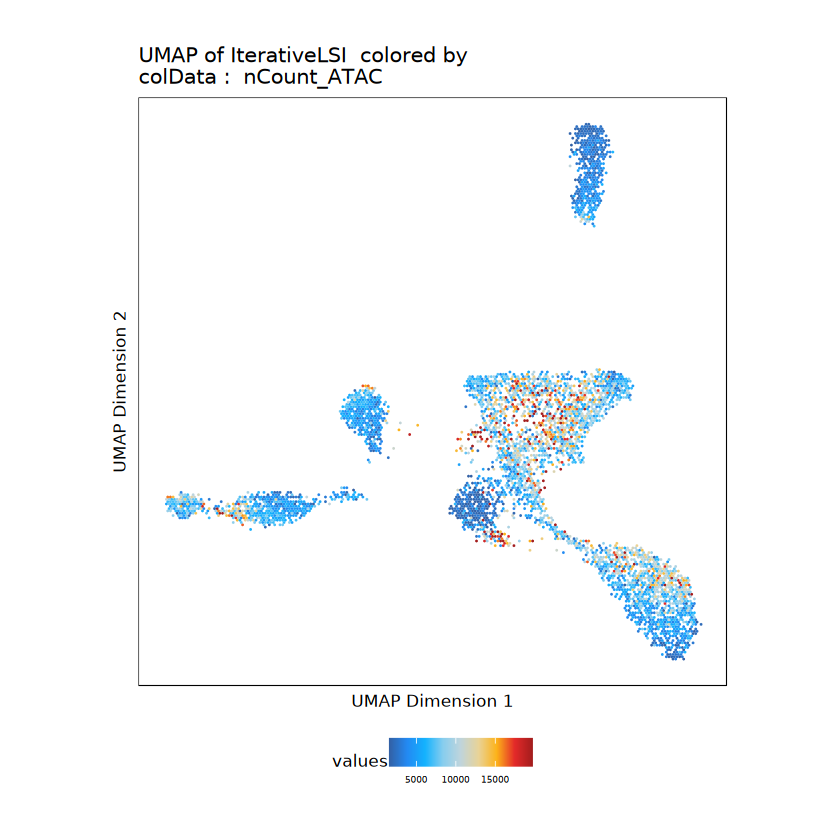

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100586413a6da-Date-2024-11-11_Time-15-01-45.292328.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100586413a6da-Date-2024-11-11_Time-15-01-45.292328.log



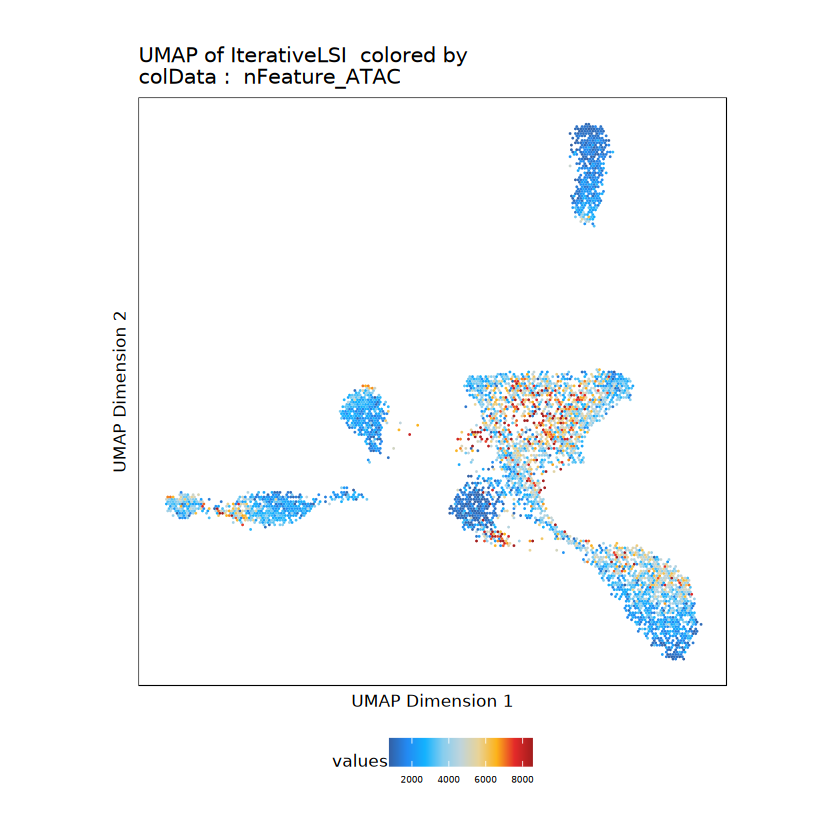

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058761fe2b5-Date-2024-11-11_Time-15-01-46.000045.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058761fe2b5-Date-2024-11-11_Time-15-01-46.000045.log



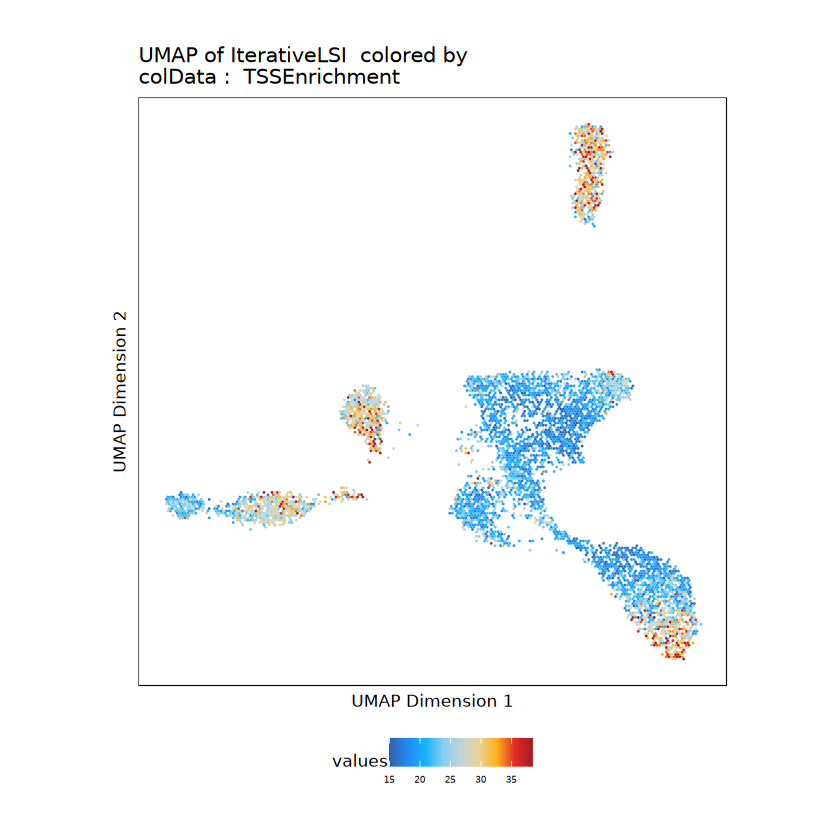

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21005874ff2572-Date-2024-11-11_Time-15-01-46.614655.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21005874ff2572-Date-2024-11-11_Time-15-01-46.614655.log



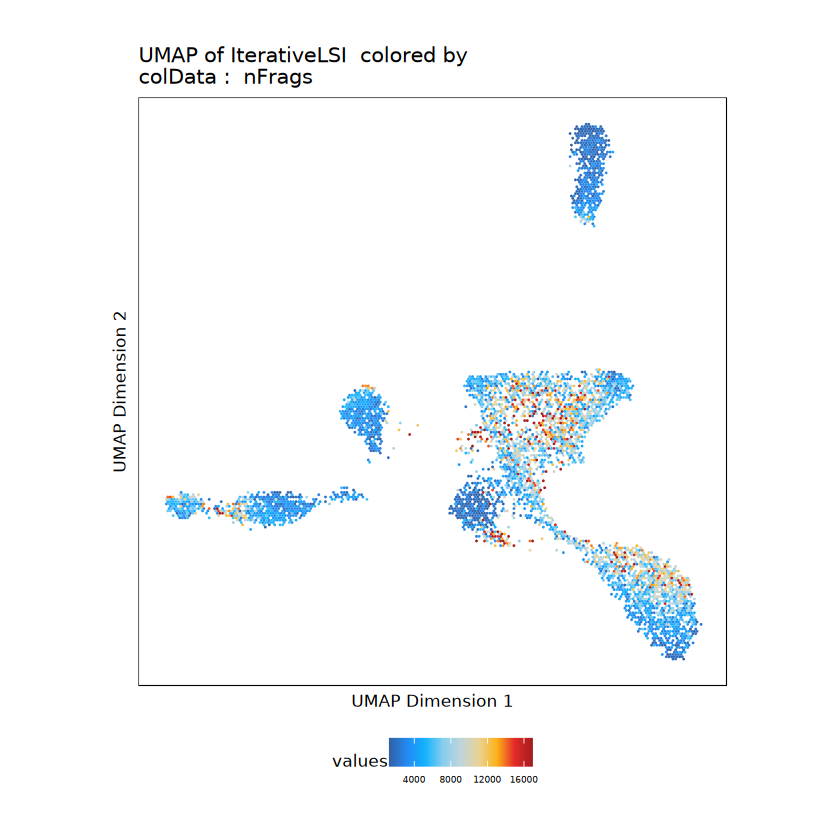

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100585280f112-Date-2024-11-11_Time-15-01-47.283434.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100585280f112-Date-2024-11-11_Time-15-01-47.283434.log



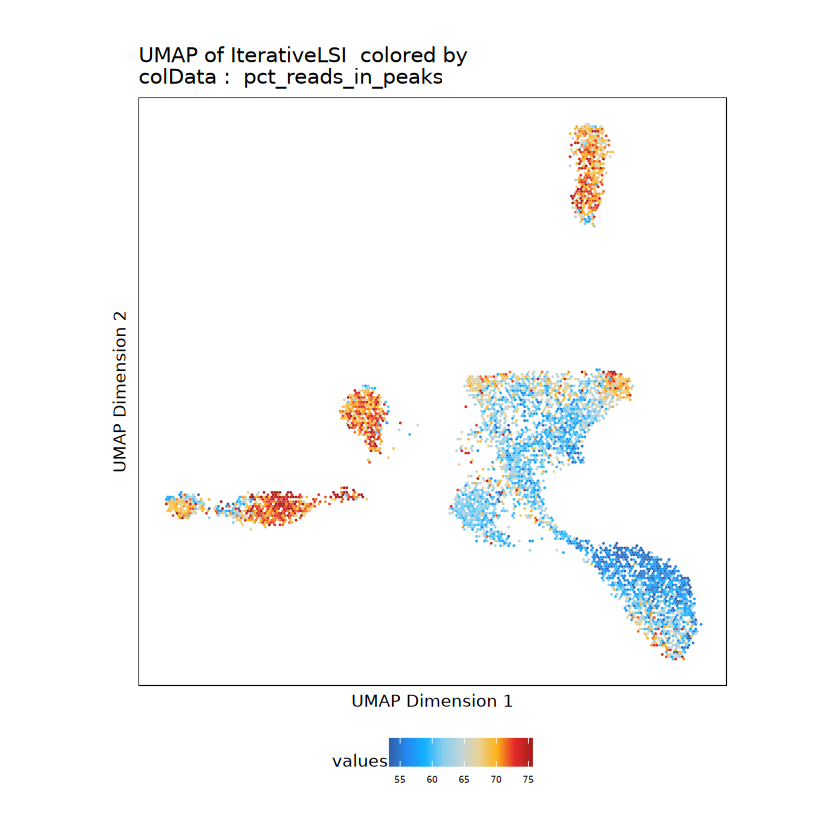

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058242cfbbd-Date-2024-11-11_Time-15-01-47.963685.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058242cfbbd-Date-2024-11-11_Time-15-01-47.963685.log



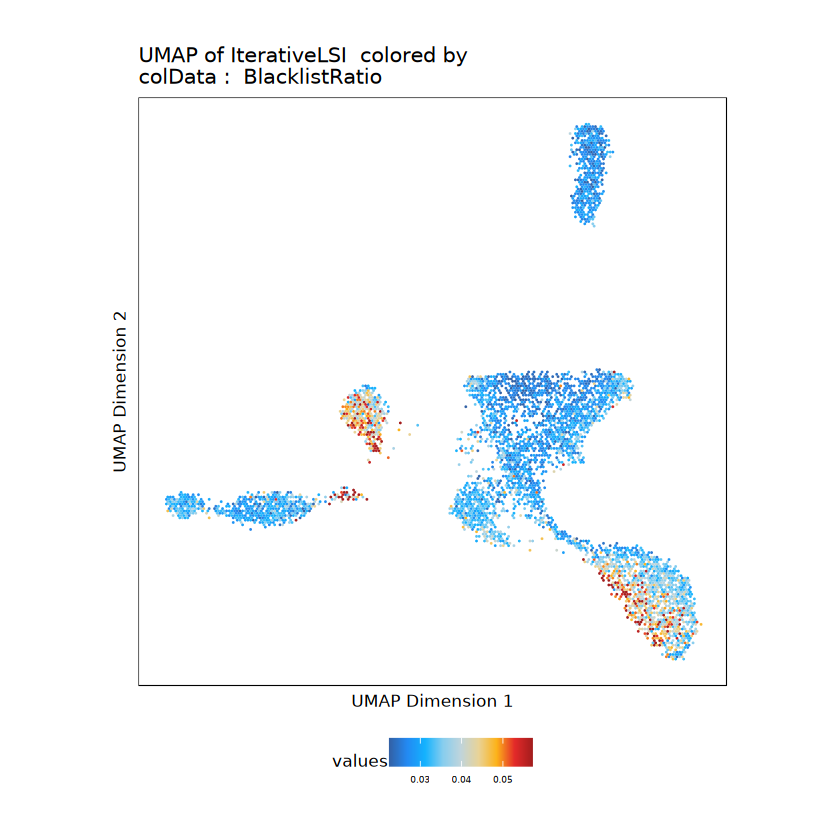

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100583bc72dd3-Date-2024-11-11_Time-15-01-48.627078.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100583bc72dd3-Date-2024-11-11_Time-15-01-48.627078.log



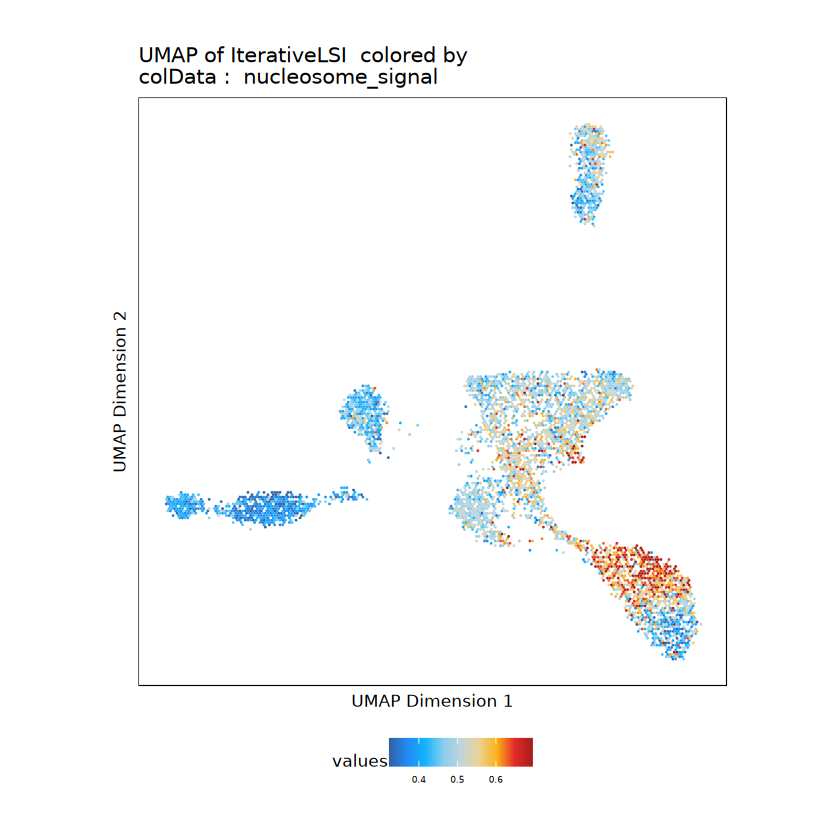

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-210058416218f0-Date-2024-11-11_Time-15-01-49.237707.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-210058416218f0-Date-2024-11-11_Time-15-01-49.237707.log



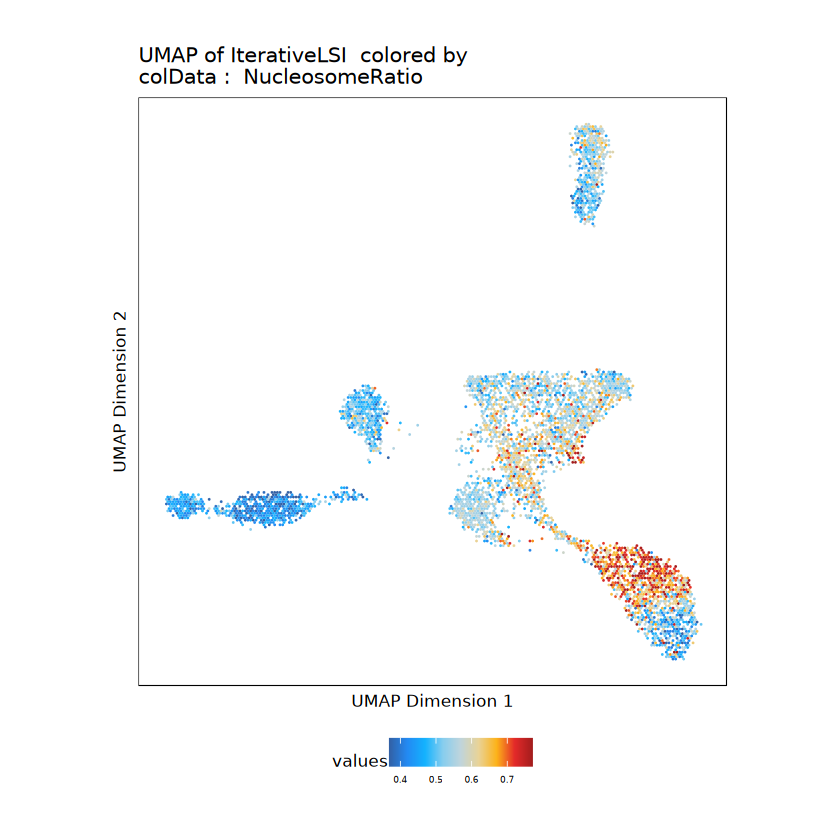

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100586b5c12a1-Date-2024-11-11_Time-15-01-50.014334.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100586b5c12a1-Date-2024-11-11_Time-15-01-50.014334.log



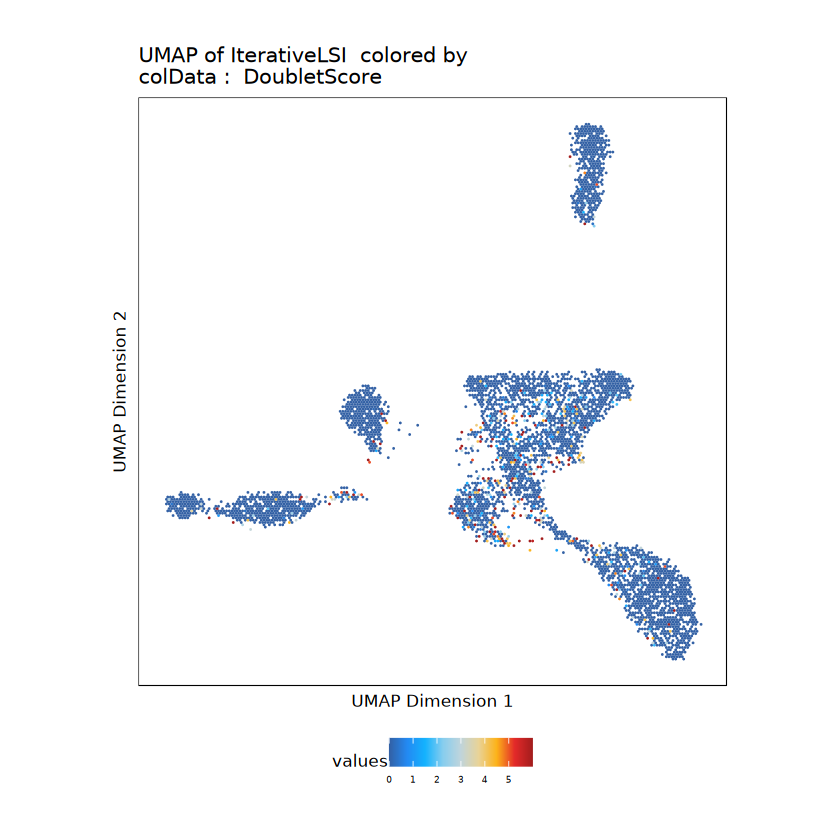

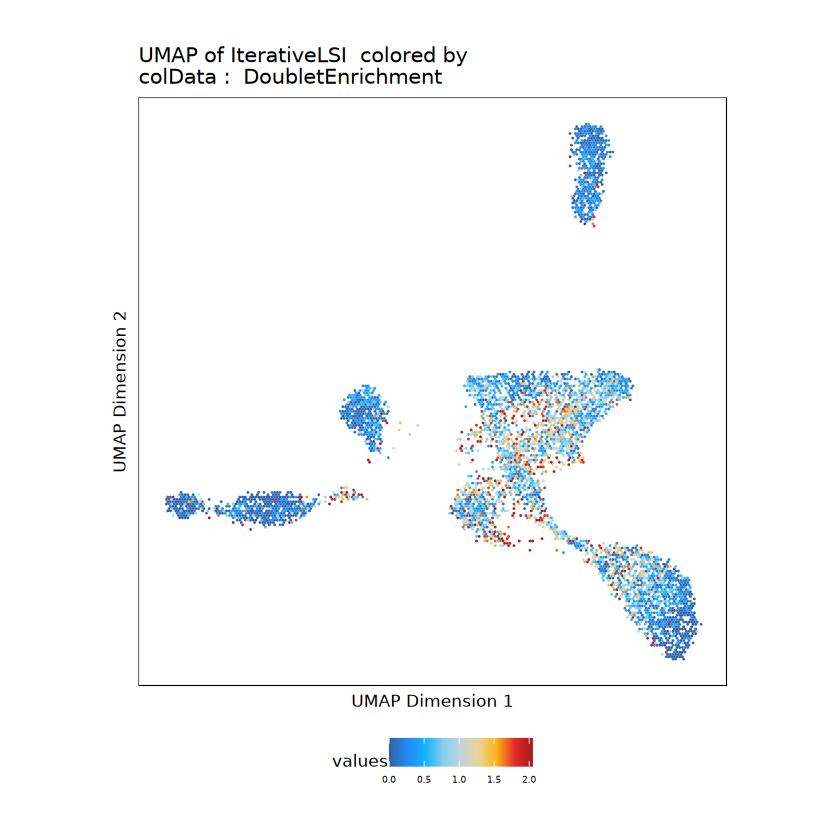

In [49]:
variables <- c('Clusters','nCount_ATAC', 'nFeature_ATAC', 'TSSEnrichment', 'nFrags', 'pct_reads_in_peaks',
                     'BlacklistRatio', 'nucleosome_signal', 'NucleosomeRatio','DoubletScore','DoubletEnrichment')
plot_list2 <- lapply(variables, function(var) {
    p <- plotEmbedding(
      ArchRProj = sub_proj2, 
      colorBy = "cellColData", 
      name = var, 
      embedding = "UMAP"
    )
    p + 
      ggtitle(paste("UMAP of", var, proj_name)) +  # Title for each plot
      theme_minimal() +  # A clean minimal theme
      theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels
  print(p)
})

#grid.arrange(grobs = plot_list2, ncol = 3, top = paste0(sample,"QC Metrics"))

# Filtering Round 3

In [ ]:
subset_seurat_obj3 <- subset(
  subset_seurat_obj2,
  subset = nCount_ATAC < 55000 & nCount_ATAC > 100 &
          #nFeature_ATAC < 20000 & nFeature_ATAC > 100 &
          #TSSEnrichment > 5 & TSSEnrichment < 45 &
          #pct_reads_in_peaks > 35 &
          nFrags < 50000 &
          #BlacklistRatio < 0.05 & 
          #nucleosome_signal < 1.1 &
          #NucleosomeRatio > 0.4 & NucleosomeRatio < 1.2 &
          DoubletScore < 10 #&
          #DoubletEnrichment < 6
)
dim(subset_seurat_obj1)
dim(subset_seurat_obj2)
dim(subset_seurat_obj3)

In [ ]:
subset_seurat_obj2@meta.data$filter_status <- ifelse(rownames(subset_seurat_obj2@meta.data) %in% rownames(subset_seurat_obj3@meta.data), "Included", "Excluded")
sub_proj2 <- addCellColData(
        ArchRProj = sub_proj2,
        data = subset_seurat_obj2@meta.data$filter_status,
        name = 'filter_status', 
        cells = subset_seurat_obj2@meta.data$archr_barcodes,
        force = TRUE)

In [ ]:
variables <- c('Clusters','filter_status','DoubletScore','DoubletEnrichment')
plot_list2 <- lapply(variables, function(var) {
    p <- plotEmbedding(
      ArchRProj = sub_proj2, 
      colorBy = "cellColData", 
      name = var, 
      embedding = "UMAP"
    )
    p + 
      ggtitle(paste("UMAP of", var, proj_name)) +  # Title for each plot
      theme_minimal() +  # A clean minimal theme
      theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels
  print(p)
})

In [ ]:
sub_proj2 <- saveArchRProject(ArchRProj = sub_proj2)

In [ ]:
setwd(Archr_Dir)
sub_proj3 <- subsetArchRProject(
  ArchRProj = sub_proj2,
  cells = subset_seurat_obj3@meta.data$archr_barcodes,
  outputDirectory = "filter_round3",
  dropCells = TRUE,
  force = TRUE
)

In [ ]:
saveRDS(subset_seurat_obj3, file = "filter3_seurat_object.rds")

# Analyze Round 4

In [ ]:
subset_seurat_obj3 <- readRDS("filter3_seurat_object.rds")
sub_proj3 <- loadArchRProject(file.path(Archr_Dir,'filter_round3'))

In [ ]:
sub_proj3

In [ ]:
subset_seurat_obj3

In [ ]:
sub_proj3 <- addIterativeLSI(ArchRProj = sub_proj3, useMatrix = "TileMatrix", name = "IterativeLSI",force=TRUE)
sub_proj3 <- addUMAP(sub_proj3, reducedDims = "IterativeLSI", name = "UMAP",force=TRUE)
sub_proj3 <- addClusters(input = sub_proj3, reducedDims = "IterativeLSI", name = "Clusters",force=TRUE)

In [ ]:
sub_proj3 <- saveArchRProject(ArchRProj = sub_proj3)
archr_metadata3 <- getCellColData(sub_proj3)

# Plot QC Metrics

In [ ]:
p1 <- DensityScatter(subset_seurat_obj3, x = 'nCount_ATAC', y = 'TSSEnrichment', log_x = TRUE, quantiles = TRUE)
p2 <- DensityScatter(subset_seurat_obj3, x = 'nucleosome_signal', y = 'TSSEnrichment', log_x = TRUE, quantiles = TRUE)
p1
p2

In [ ]:
# Define the columns to plot
columns_to_plot <- c('nCount_ATAC', 'nFeature_ATAC', 'TSSEnrichment', 'nFrags', 'pct_reads_in_peaks',
                     'BlacklistRatio', 'nucleosome_signal', 'NucleosomeRatio','DoubletScore','DoubletEnrichment')

# Extract data from seurat_obj@meta.data
plot_data <- subset_seurat_obj3@meta.data[, columns_to_plot]

# Melt the data into a long format for plotting
plot_data_melted <- melt(plot_data, variable.name = "Feature", value.name = "Value")

# Create a list to store individual ggplot objects
plot_list <- list()
for (feature in columns_to_plot) {
  p <- ggplot(subset(plot_data_melted, Feature == feature), aes(x = Feature, y = Value)) +
    geom_violin(trim = FALSE, fill = "maroon", color = "black") +  # Violin plot
    geom_jitter(width = 0.1, color = "black", size = 0.3, alpha = 0.5) +  # Jittered points (black)
    theme_minimal(base_size = 14) +  # Larger base font size
    labs(title = paste("Violin Plot for", feature),
         x = feature,
         y = "Value")
  plot_list[[feature]] <- p
  print(p)
}
#grid.arrange(grobs = plot_list, ncol = 4, top = paste0(sample,"QC Metrics"))  # Add a main title

In [ ]:
variables <- c('Clusters','nCount_ATAC', 'nFeature_ATAC', 'TSSEnrichment', 'nFrags', 'pct_reads_in_peaks',
                     'BlacklistRatio', 'nucleosome_signal', 'NucleosomeRatio','DoubletScore','DoubletEnrichment')
plot_list2 <- lapply(variables, function(var) {
    p <- plotEmbedding(
      ArchRProj = sub_proj3, 
      colorBy = "cellColData", 
      name = var, 
      embedding = "UMAP"
    )
    p + 
      ggtitle(paste("UMAP of", var, proj_name)) +  # Title for each plot
      theme_minimal() +  # A clean minimal theme
      theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels
  print(p)
})

#grid.arrange(grobs = plot_list2, ncol = 3, top = paste0(sample,"QC Metrics"))

In [50]:
archr_metadata3 <- getCellColData(sub_proj2)
head(archr_metadata3)

DataFrame with 6 rows and 21 columns
                             Sample TSSEnrichment ReadsInTSS ReadsInPromoter
                        <character>     <numeric>  <numeric>       <numeric>
MAZ1#AAACAAGCACCATGCC-1        MAZ1        18.038        583            2009
MAZ1#AAACAAGCACTAGCTT-1        MAZ1        29.263       2128            6807
MAZ1#AAACAAGCAGTATGTG-1        MAZ1        16.832        884            3228
MAZ1#AAACCAGGTATGTTGC-1        MAZ1        29.429       1397            4685
MAZ1#AAACCAGGTGGATGCG-1        MAZ1        27.561       4440           13574
MAZ1#AAACCAGGTGTCCGTA-1        MAZ1        16.837       1607            5664
                        ReadsInBlacklist PromoterRatio    PassQC
                               <numeric>     <numeric> <numeric>
MAZ1#AAACAAGCACCATGCC-1              295      0.257432         1
MAZ1#AAACAAGCACTAGCTT-1              552      0.308820         1
MAZ1#AAACAAGCAGTATGTG-1              422      0.250543         1
MAZ1#AAACCAGGTATGTTGC-

In [51]:
setwd(Archr_Dir)
write.csv(archr_metadata3, file = "filtered_cells_metadata.csv", row.names = TRUE)

In [52]:
markerGenes  <- c(
    "Cd4","Il7r",
    "Cd8a", "Cd8b1","Ccl5",
    "Ngly1", "Nkg7","Klrb1c",
    "Cd79a",  "Cd79b", "Ms4a1",
    "Fcgr3", "Ms4a7",
    "Lyz1", "Cd14","Lgals3", "S100a8",
    "Cst3",
    "Apoe","Lyz2",
    "MEIS1"
  )

In [55]:
sub_proj2 <- addImputeWeights(sub_proj2)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-210058537e0397-Date-2024-11-11_Time-15-19-00.240363.log
If there is an issue, please report to github with logFile!

2024-11-11 15:19:00.320081 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2100587f76f988-Date-2024-11-11_Time-15-20-35.581542.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2024-11-11 15:20:35.796088 : 

1 


Imputing Matrix

Using weights on disk

1 of 2

2 of 2

Using weights on disk

1 of 2

2 of 2

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2100587f76f988-Date-2024-11-11_Time-15-20-35.581542.log



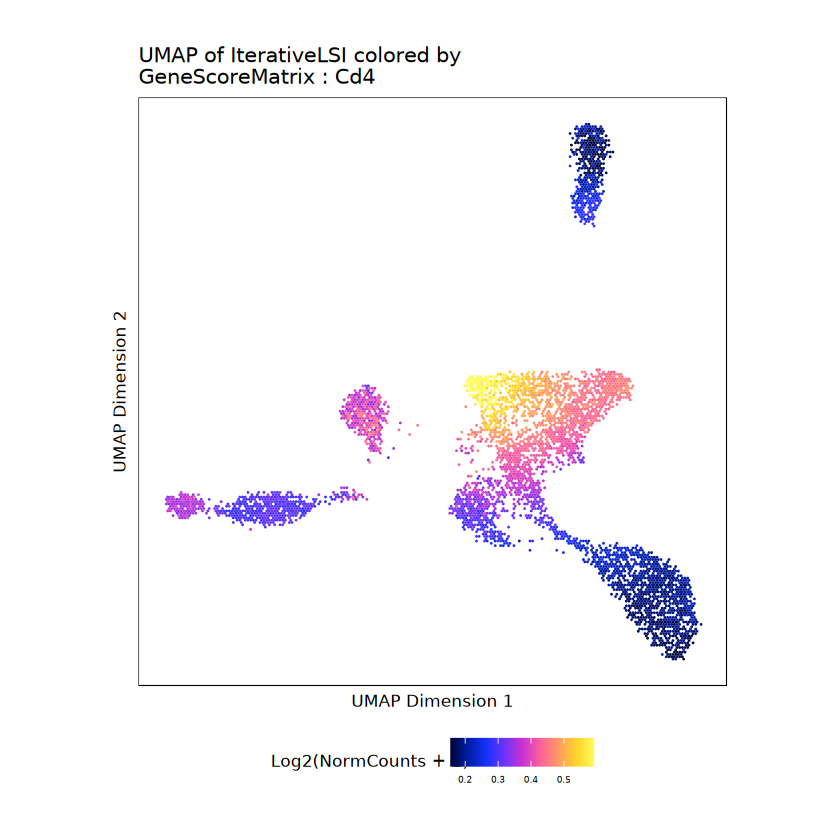

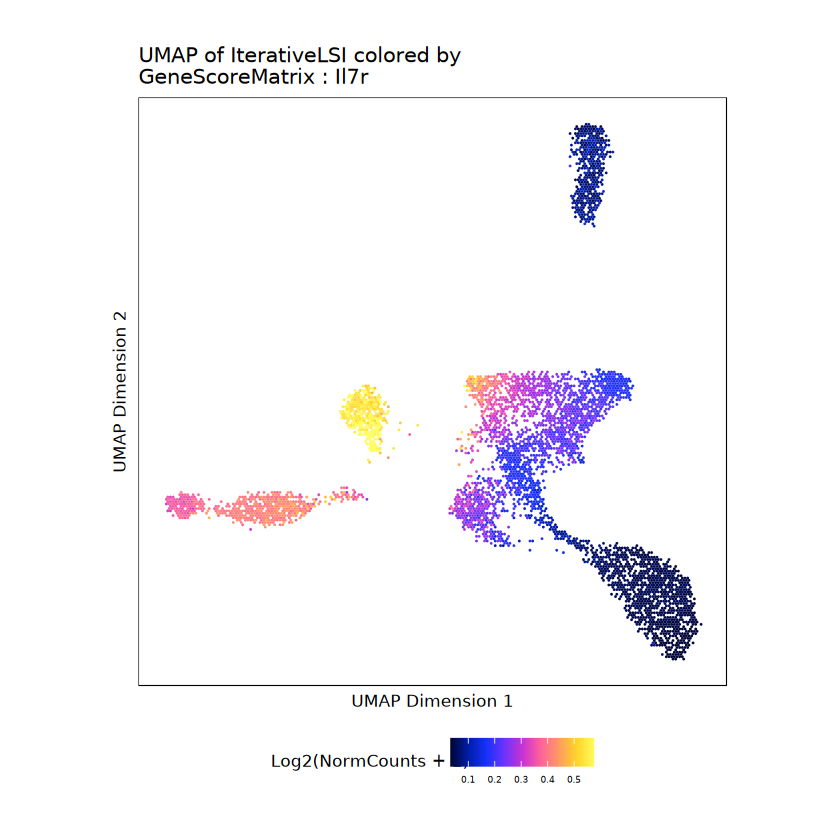

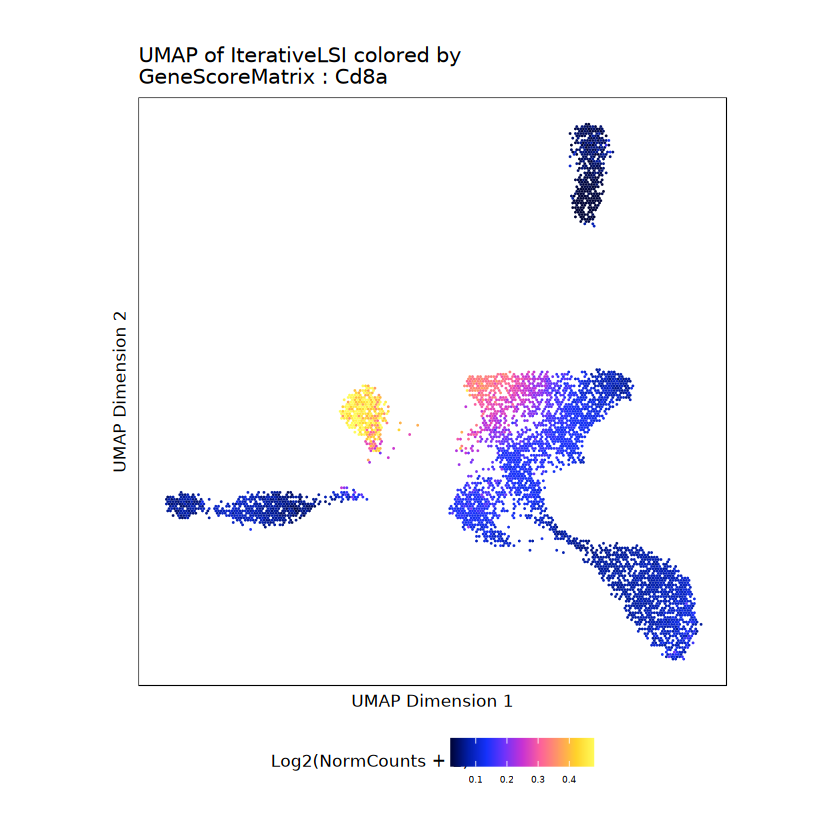

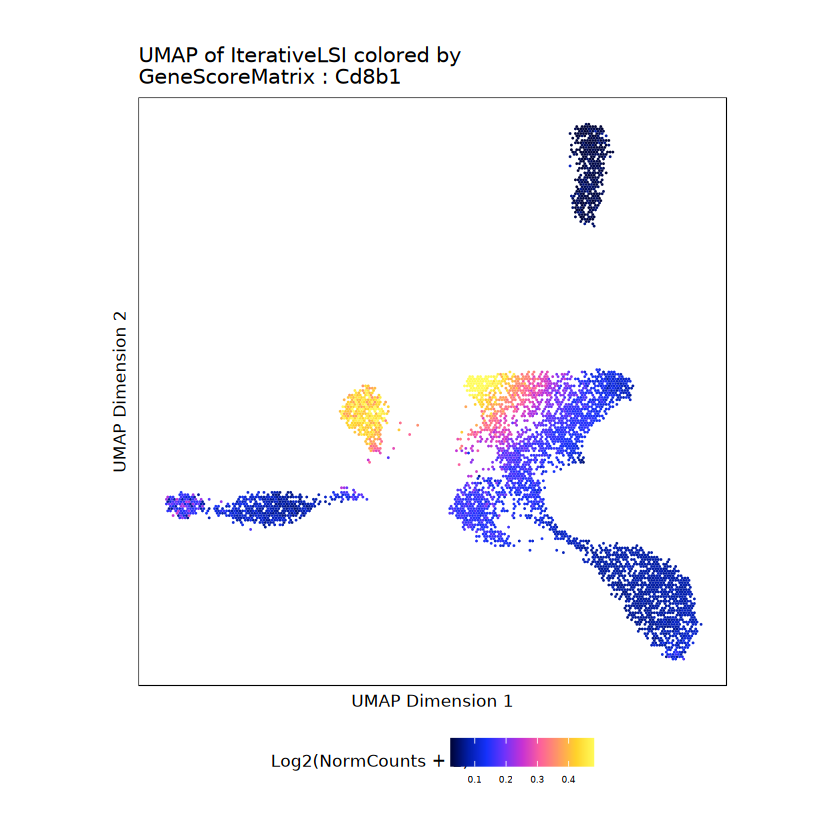

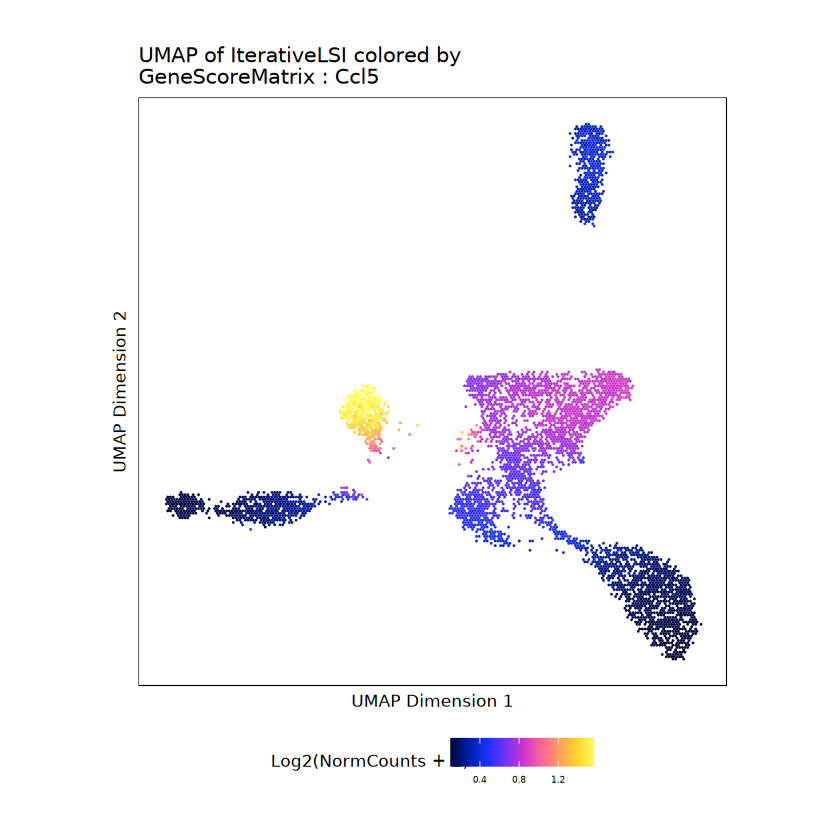

...

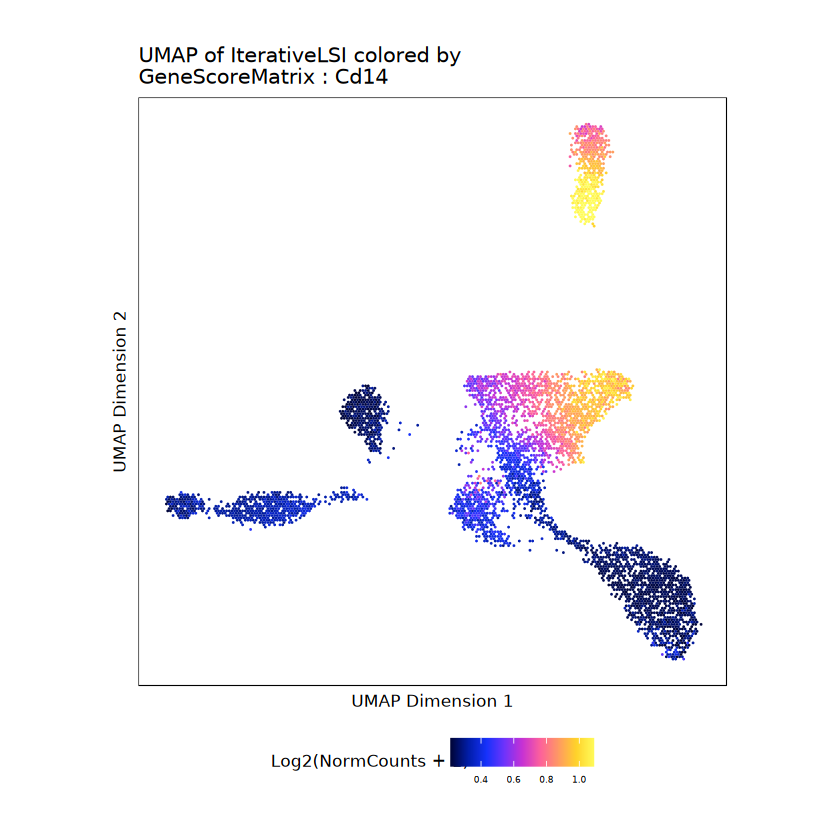

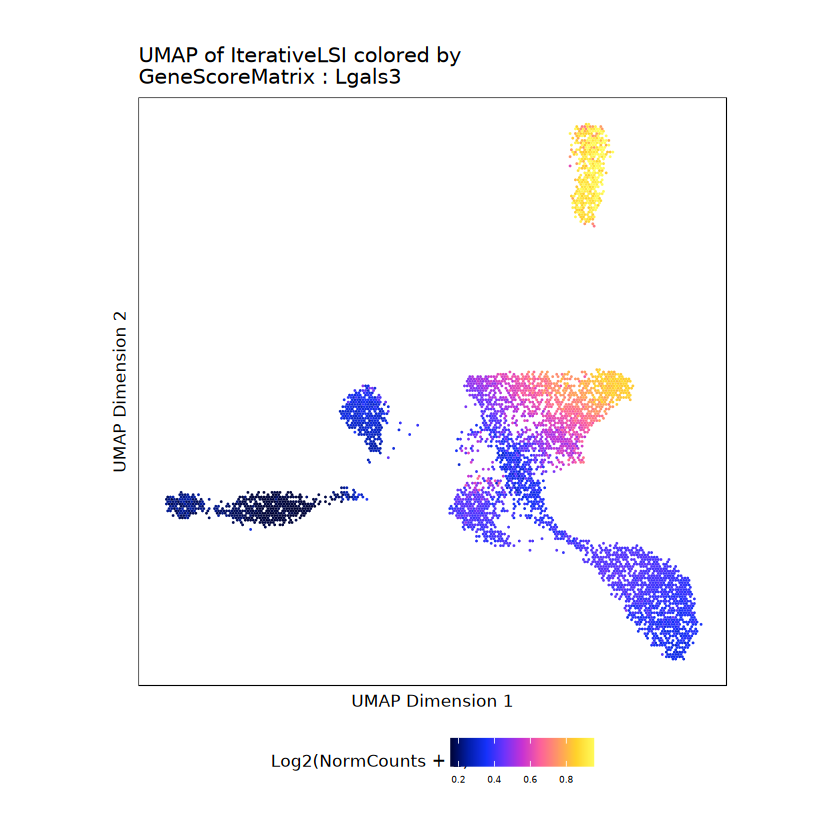

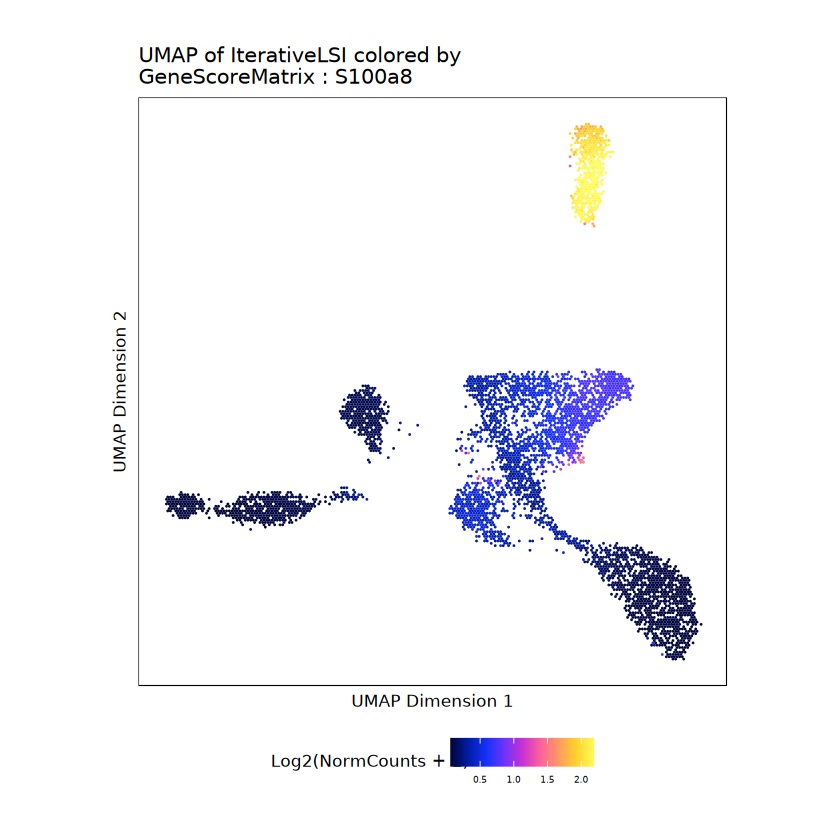

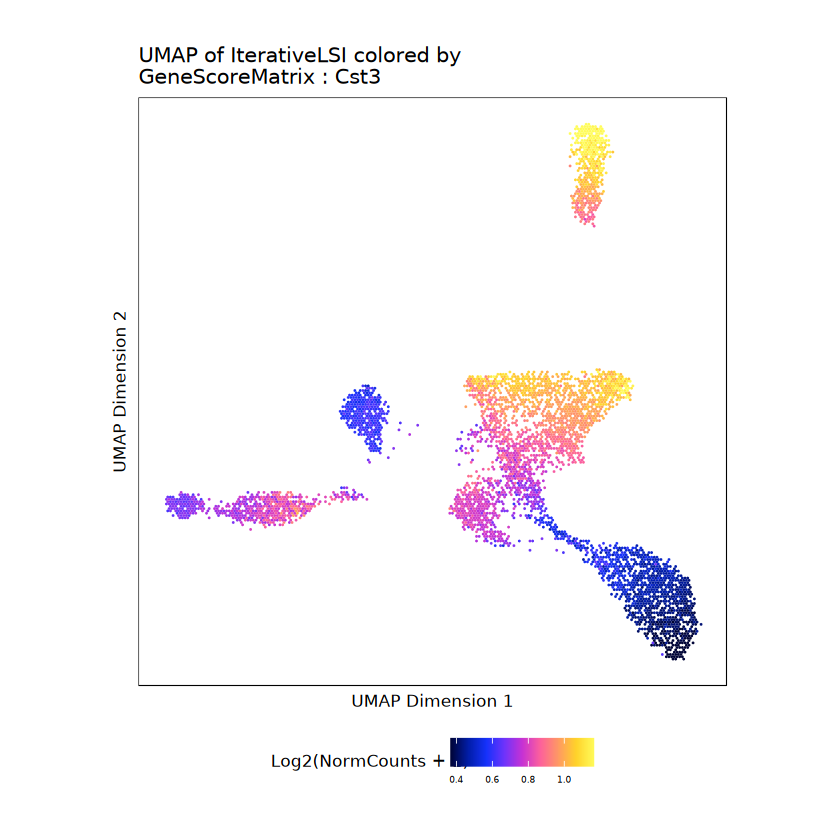

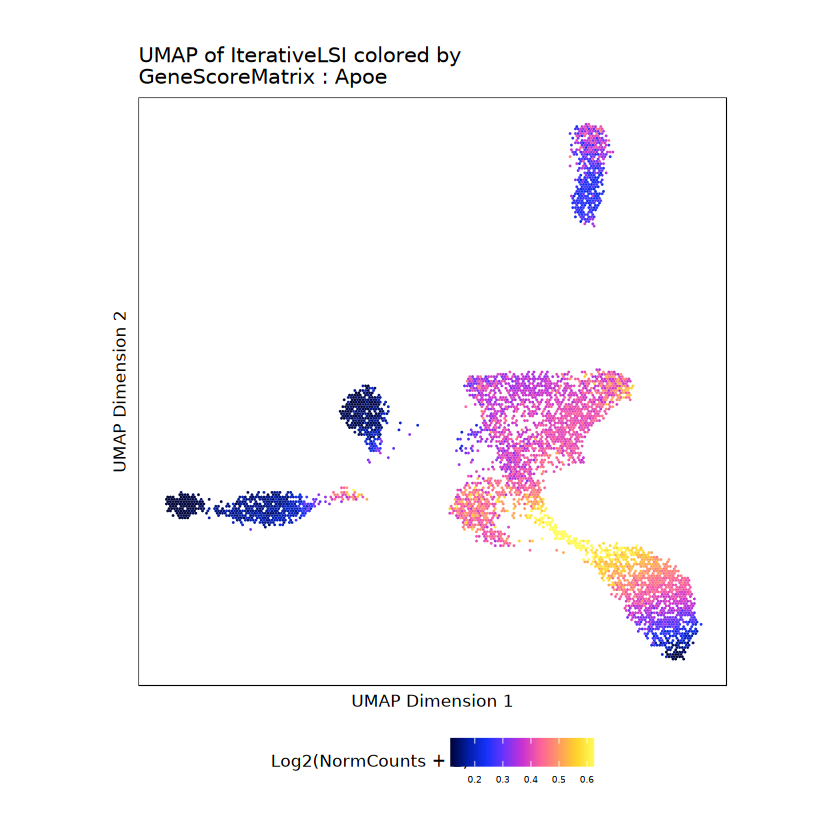

$Cd4

$Il7r

$Cd8a

$Cd8b1

$Ccl5

$Ngly1

$Nkg7

$Klrb1c

$Cd79a

$Cd79b

$Ms4a1

$Fcgr3

$Ms4a7

$Lyz1

$Cd14

$Lgals3

$S100a8

$Cst3

$Apoe

$Lyz2

$MEIS1


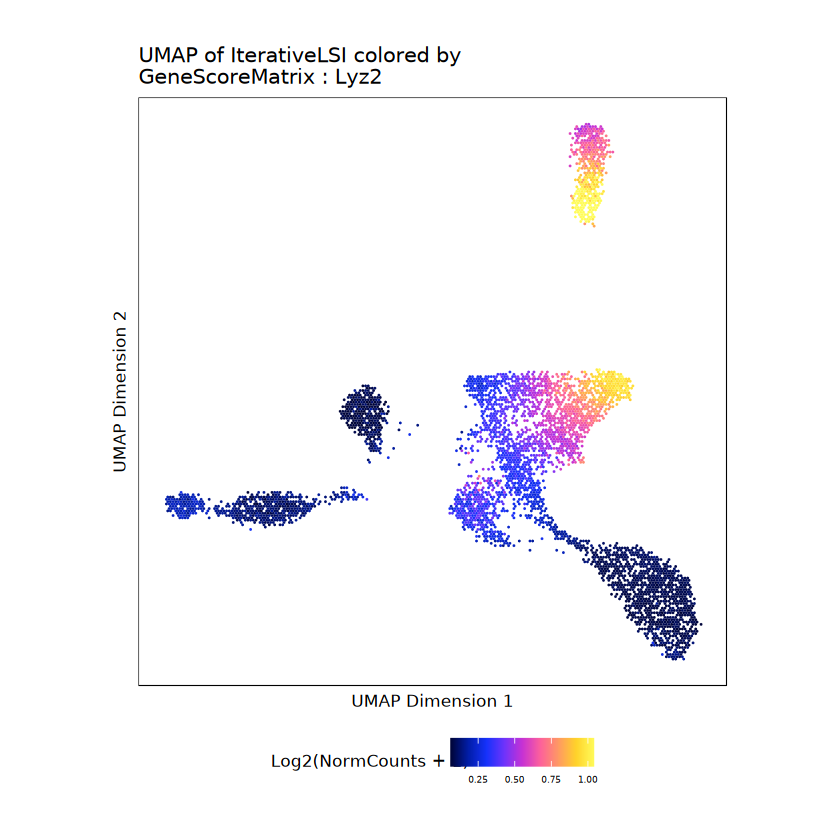

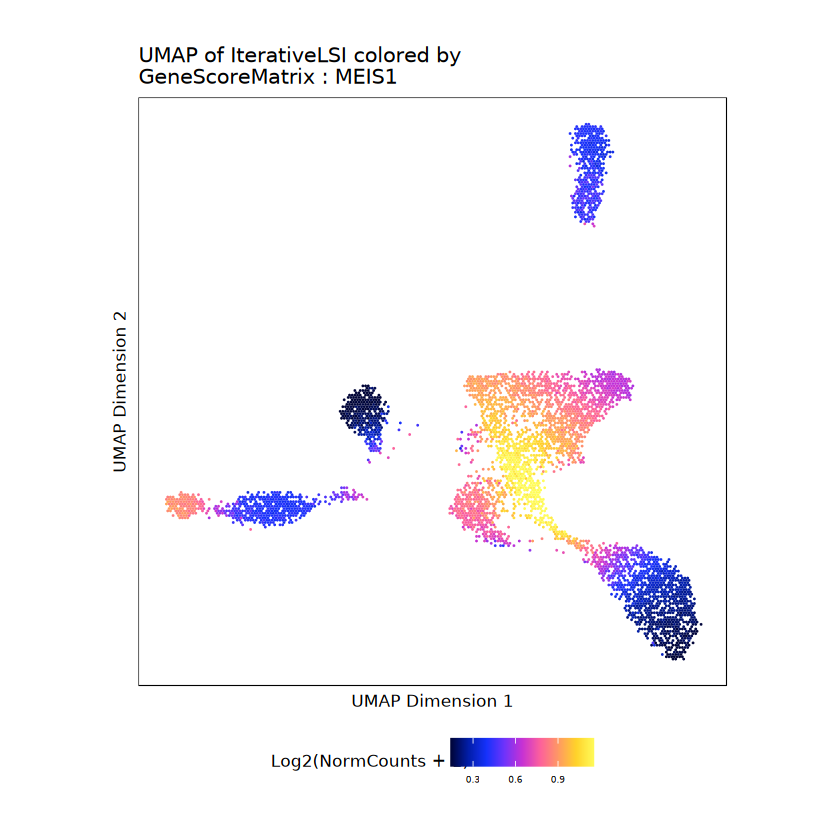

In [58]:
p <- plotEmbedding(
    ArchRProj = sub_proj2, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(sub_proj2)
)
p